___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___

# WELCOME!

Welcome to "***Employee Churn Analysis Project***". This is the second project of Capstone Project Series, which you will be able to build your own classification models for a variety of business settings.

Also you will research what is Employee Churn?, How it is different from customer churn, Exploratory data analysis and visualization of employee churn dataset using ***matplotlib*** and ***seaborn***, model building and evaluation using python ***scikit-learn*** and ***Tensorflow-Keras*** packages.

You will be able to implement classification techniques in Python. Using Scikit-Learn allowing you to successfully make predictions with Distance Based, Bagging, Boosting algorithms for this project. On the other hand, for Deep Learning you will use Tensorflow-Keras.

At the end of the project, you will have the opportunity to deploy your model using *Streamlit*.

Before diving into the project, please take a look at the determines and project structure.

- NOTE: This project assumes that you already know the basics of coding in Python and are familiar with model deployement as well as the theory behind Distance Based, Bagging, Boosting algorithms, and Confusion Matrices. You can try more models and methods beside these to improve your model metrics.



# #Determines
In this project you have HR data of a company. A study is requested from you to predict which employee will churn by using this data.

The HR dataset has 14,999 samples. In the given dataset, you have two types of employee one who stayed and another who left the company.

You can describe 10 attributes in detail as:
- ***satisfaction_level:*** It is employee satisfaction point, which ranges from 0-1.
- ***last_evaluation:*** It is evaluated performance by the employer, which also ranges from 0-1.
- ***number_projects:*** How many of projects assigned to an employee?
- ***average_monthly_hours:*** How many hours in averega an employee worked in a month?
- **time_spent_company:** time_spent_company means employee experience. The number of years spent by an employee in the company.
- ***work_accident:*** Whether an employee has had a work accident or not.
- ***promotion_last_5years:*** Whether an employee has had a promotion in the last 5 years or not.
- ***Departments:*** Employee's working department/division.
- ***Salary:*** Salary level of the employee such as low, medium and high.
- ***left:*** Whether the employee has left the company or not.

First of all, to observe the structure of the data, outliers, missing values and features that affect the target variable, you must use exploratory data analysis and data visualization techniques.

Then, you must perform data pre-processing operations such as ***Scaling*** and ***Encoding*** to increase the accuracy score of Gradient Descent Based or Distance-Based algorithms.

You are asked to perform ***Cluster Analysis*** based on the information you obtain during exploratory data analysis and data visualization processes. The purpose of clustering analysis is to cluster data with similar characteristics.

Once the data is ready to be applied to the model, you must ***split the data into train and test***. Then build a model to predict whether employees will churn or not. Train your models with your train set, test the success of your model with your test set.

Try to make your predictions by using the *** Classification Algorithms***. You can use the related modules of the ***scikit-learn*** and ***Tensorflow-Keras*** library. You can use scikit-learn ***Classification Metrics*** module for accuracy calculation.

In the final step, you will deploy your model using Streamlit tool.



# #Tasks

#### 1. Exploratory Data Analysis
- EDA is an initial process of analysis, in which you can summarize characteristics of data such as pattern, trends, outliers, and hypothesis testing using descriptive statistics and visualization.
- In the given dataset, you have two types of employee one who stayed and another who left the company. So, you can divide data into two groups and compare their characteristics.

#### 2. Data Visualization
- Explore your data via visualizations to find-out:
 - What can be the reason of the churn?
 - Behavioral analysis of churns and not churns ..... etc.

#### 3. Cluster Analysis
- Apply ***clustering algorithms*** and writedown your conclusions about the clusters you created.

#### 5. Predictive Model Building
- Split Data as Train and Test set
- Built Classification Models(at least four models) and Evaluate Model Performances

#### 6. Model Deployement

- Save and Export the Best Model
- Deploy best model via Streamlit

## #Importing Modules and Predefined Functions#

In [1]:
# import libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams["figure.figsize"] = (7,6)
import warnings

# ignore warning
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

In [2]:
# Importing libraries for DL and ML
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import recall_score,\
                            f1_score, precision_recall_curve,\
                            average_precision_score
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import GridSearchCV,\
                                    HalvingGridSearchCV,\
                                    RandomizedSearchCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler,\
                                  OneHotEncoder
from sklearn.compose import ColumnTransformer

In [3]:
from sklearn.model_selection import cross_validate, GridSearchCV
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    recall_score,
    precision_score,
    make_scorer,
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay,
    average_precision_score,
    roc_curve,
    auc,
)

#### eval_metric

In [4]:
# This function will be used frequently
from sklearn.metrics import classification_report,confusion_matrix,ConfusionMatrixDisplay

def eval_metric(model, X_train, y_train, X_test, y_test):
    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    
    print("Test_Set")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set")
    print(confusion_matrix(y_train, y_train_pred))
    print(classification_report(y_train, y_train_pred))

#### import

In [5]:
# import dataset
df = pd.read_csv("HR_Dataset.csv")

In [6]:
#Seeing the head of the dataset 
df.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,Departments,salary
0,0.38,0.53,2,157,3,0,1,0,sales,low
1,0.80,0.86,5,262,6,0,1,0,sales,medium
2,0.11,0.88,7,272,4,0,1,0,sales,medium
3,0.72,0.87,5,223,5,0,1,0,sales,low
4,0.37,0.52,2,159,3,0,1,0,sales,low


## 1. Exploratory Data Analysis

In [7]:
df.sample(10)

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,Departments,salary
7352,0.91,1.00,4,125,4,0,0,0,sales,medium
14416,0.38,0.50,2,153,3,0,1,0,support,low
5486,0.52,0.88,4,155,3,1,0,0,product_mng,low
7869,0.19,0.48,6,178,3,1,0,0,sales,medium
5987,0.98,0.87,3,246,3,0,0,0,hr,high
7785,0.65,0.74,4,237,3,1,0,0,sales,low
11347,0.69,0.72,4,185,10,1,0,0,management,high
4123,0.65,0.57,3,137,4,1,0,0,sales,high
11916,0.37,0.72,3,183,2,0,0,0,sales,low
4111,0.13,1.00,6,225,3,0,0,0,product_mng,medium


In [8]:
#Seeing the shape of our dataset
df.shape
#As we can see the shape of the dataset is (14999, 10)

(14999, 10)

In [9]:
#Seeing the info of the dataset
df.info()
#As we can see, there are about 2 (float), 2 (obj) and 6 (int)
#The data starts from 0 to 14998
#There is no null data in all the columns, which is a good thing

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   satisfaction_level     14999 non-null  float64
 1   last_evaluation        14999 non-null  float64
 2   number_project         14999 non-null  int64  
 3   average_montly_hours   14999 non-null  int64  
 4   time_spend_company     14999 non-null  int64  
 5   Work_accident          14999 non-null  int64  
 6   left                   14999 non-null  int64  
 7   promotion_last_5years  14999 non-null  int64  
 8   Departments            14999 non-null  object 
 9   salary                 14999 non-null  object 
dtypes: float64(2), int64(6), object(2)
memory usage: 1.1+ MB


In [10]:
#Seeing the describtion of the dataset
df.describe().T

,count,mean,std,min,25%,50%,75%,max
satisfaction_level,14999.0,0.612834,0.248631,0.09,0.44,0.64,0.82,1.0
last_evaluation,14999.0,0.716102,0.171169,0.36,0.56,0.72,0.87,1.0
number_project,14999.0,3.803054,1.232592,2.00,3.00,4.00,5.00,7.0
average_montly_hours,14999.0,201.050337,49.943099,96.00,156.00,200.00,245.00,310.0
time_spend_company,14999.0,3.498233,1.460136,2.00,3.00,3.00,4.00,10.0
Work_accident,14999.0,0.144610,0.351719,0.00,0.00,0.00,0.00,1.0
left,14999.0,0.238083,0.425924,0.00,0.00,0.00,0.00,1.0
promotion_last_5years,14999.0,0.021268,0.144281,0.00,0.00,0.00,0.00,1.0


In [11]:
# get rid of not continuous features
df.describe().iloc[:,:5].T

,count,mean,std,min,25%,50%,75%,max
satisfaction_level,14999.0,0.612834,0.248631,0.09,0.44,0.64,0.82,1.0
last_evaluation,14999.0,0.716102,0.171169,0.36,0.56,0.72,0.87,1.0
number_project,14999.0,3.803054,1.232592,2.00,3.00,4.00,5.00,7.0
average_montly_hours,14999.0,201.050337,49.943099,96.00,156.00,200.00,245.00,310.0
time_spend_company,14999.0,3.498233,1.460136,2.00,3.00,3.00,4.00,10.0


WE can see in all continuous features:
- has mean >> std
- mean is almost equal median

These are indications that there is no strong skewness 

In [12]:
# Create ac temporary copy
df_temp = df.copy()

# convert non continous into object to see their statistical  
df_temp["promotion_last_5years"] = df_temp["promotion_last_5years"].astype("O")
df_temp["Work_accident"] = df_temp["Work_accident"].astype("O")

# The target column
df_temp["left"] = df_temp["left"].astype("O")


df_temp.describe(include="O").T

,count,unique,top,freq
Work_accident,14999,2,0,12830
left,14999,2,0,11428
promotion_last_5years,14999,2,0,14680
Departments,14999,10,sales,4140
salary,14999,3,low,7316


In [13]:
# Check duplicates
df.duplicated().sum()
#As we can see, there are duplicated values, however, we do not have an id column or something like that, so how can we know if these are duplicated or not. 
#For now, we gonna keep them, and later, if we feel that we have to remove them, we will do so.

3008

In [14]:
# explore duplicated columns
df[df.duplicated() == True]

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,Departments,salary
396,0.46,0.57,2,139,3,0,1,0,sales,low
866,0.41,0.46,2,128,3,0,1,0,accounting,low
1317,0.37,0.51,2,127,3,0,1,0,sales,medium
1368,0.41,0.52,2,132,3,0,1,0,RandD,low
1461,0.42,0.53,2,142,3,0,1,0,sales,low
...,...,...,...,...,...,...,...,...,...,...
14994,0.40,0.57,2,151,3,0,1,0,support,low
14995,0.37,0.48,2,160,3,0,1,0,support,low
14996,0.37,0.53,2,143,3,0,1,0,support,low
14997,0.11,0.96,6,280,4,0,1,0,support,low


In [15]:
Groupby = df[df.duplicated() == True].columns.to_list()
Groupby

['satisfaction_level',
 'last_evaluation',
 'number_project',
 'average_montly_hours',
 'time_spend_company',
 'Work_accident',
 'left',
 'promotion_last_5years',
 'Departments ',
 'salary']

In [16]:
df[df.duplicated() == True].groupby(Groupby[:-1]).count().sort_values("salary", ascending=False).rename({"salary":"count"} ,axis=1)

count
satisfaction_level last_evaluation number_project average_montly_hours time_spend_company Work_accident left promotion_last_5years Departments        
0.46               0.57            2              139                  3                  0             1    0                     sales             5
0.11               0.84            6              251                  4                  0             1    0                     technical         4
0.38               0.50            2              140                  3                  0             1    0                     sales             4
0.37               0.51            2              127                  3                  0             1    0                     sales             3
0.38               0.51            2              159                  3                  0             1    0                     sales             3
...                                                                                                                                                ...
0.57               0.67            3              138                  6                  1             0    0                     IT                1
                   0.66            3              268                  3                  0             0    0                     sales             1
                   0.64            4              226                  7                  0             0    0                     sales             1
                                   3              188                  3                  0             0    0                     management        1
1.00               0.93            5              231                  2                  0             0    0                     marketing         1

[2335 rows x 1 columns]

This shows in at most the observation repeated 5 times, which indicate what these are really different employees 

In [17]:
# Even that from info there are missing value, we will check

# Check missing values
df.isnull().sum().any()
#As we can see, there is no null values 

False

In [18]:
# Rename Departments feature since it has a whitespace at the end
df.columns
#From this, we can see that for Departments, there is a space after this word, so we have to remove the space or just 
#chage the name of it.

Index(['satisfaction_level', 'last_evaluation', 'number_project',
       'average_montly_hours', 'time_spend_company', 'Work_accident', 'left',
       'promotion_last_5years', 'Departments ', 'salary'],
      dtype='object')

In [19]:
#Changing the name of Departments with a space to Departments without a space
df = df.rename({'Departments ':'Departments'},axis=1)

# Now, let's check them after renaming
df.columns
#we can see that, there is no space now.

Index(['satisfaction_level', 'last_evaluation', 'number_project',
       'average_montly_hours', 'time_spend_company', 'Work_accident', 'left',
       'promotion_last_5years', 'Departments', 'salary'],
      dtype='object')

## 2. Data Visualization

### satisfaction_level

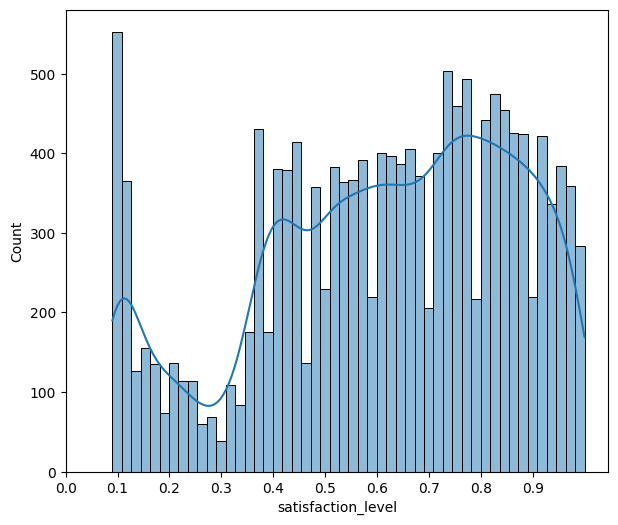

In [20]:
#Seeing the histogram of satisfaction_level
#plt.figure(figsize=(10, 20))
sns.histplot(x=df["satisfaction_level"], bins=50,  kde=True)
plt.xticks(np.arange(0, 1, step=0.1))
plt.show()

### last_evaluation

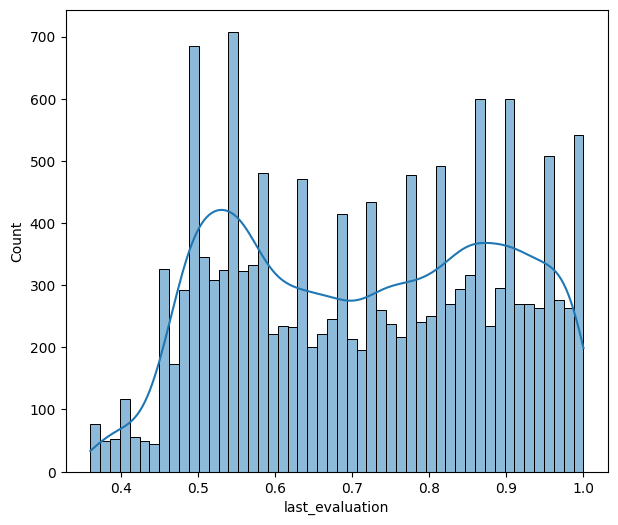

In [21]:
#Seeing the histplot of last_evaluation with the target
sns.histplot(df["last_evaluation"], bins=50, kde=True)
plt.show()

### number_project

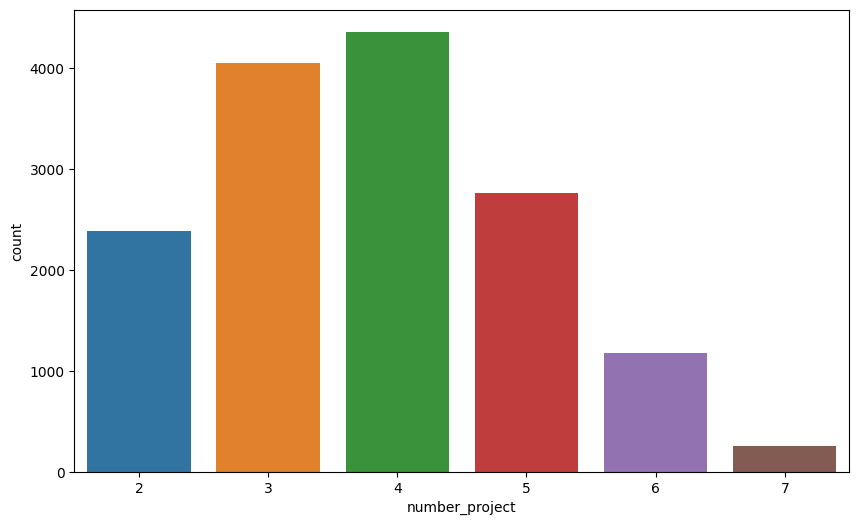

In [22]:
#Seeing the countplot of number_project
plt.figure(figsize=(10, 6))
sns.countplot(x=df["number_project"])
plt.show()

### average_montly_hours

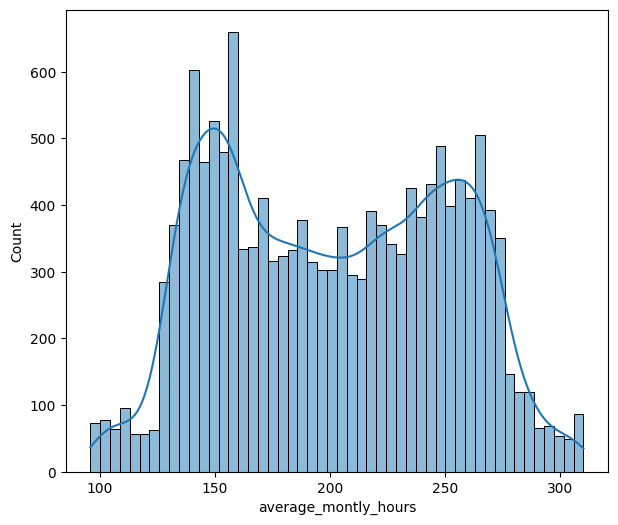

In [23]:
#Seeing the histplot of average_montly_hours with the target
sns.histplot(df["average_montly_hours"],  bins=50, kde=True)
plt.show()

### time_spend_company

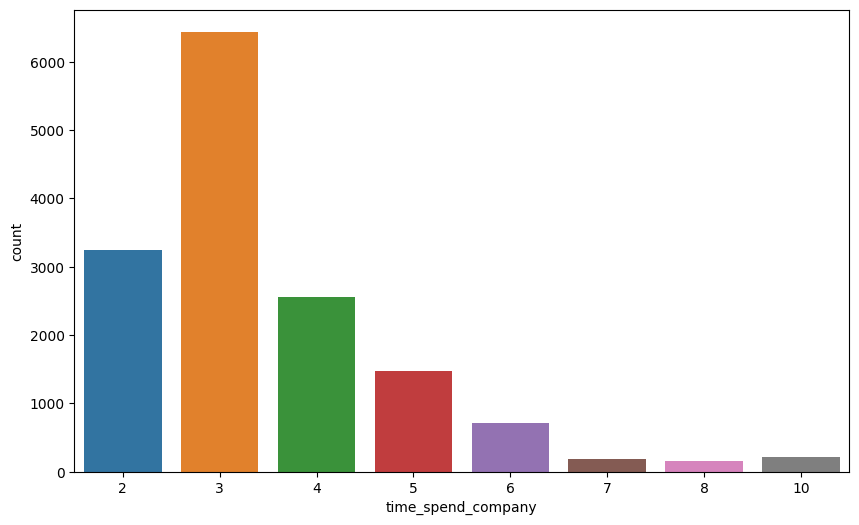

In [24]:
#Seeing the countplot of time_spend_company
plt.figure(figsize=(10, 6))
sns.countplot(x=df["time_spend_company"])
plt.show()
#From the graph, we can see that the majority spent about 3, however, 
#there are some insignificant values in 7, 8, 10, maybe they are outliers.

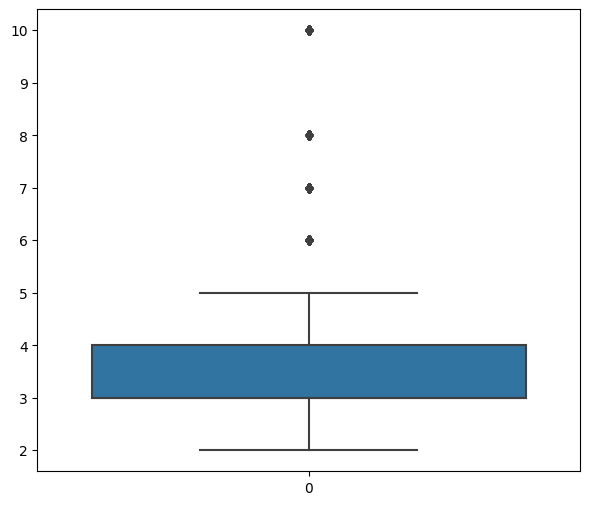

In [25]:
#Seeing the boxplot of time_spend_company
sns.boxplot(df['time_spend_company'])
plt.show()
#We can see, there is some outliers
#From this we can say that these are the tiny values.

### Work_accident

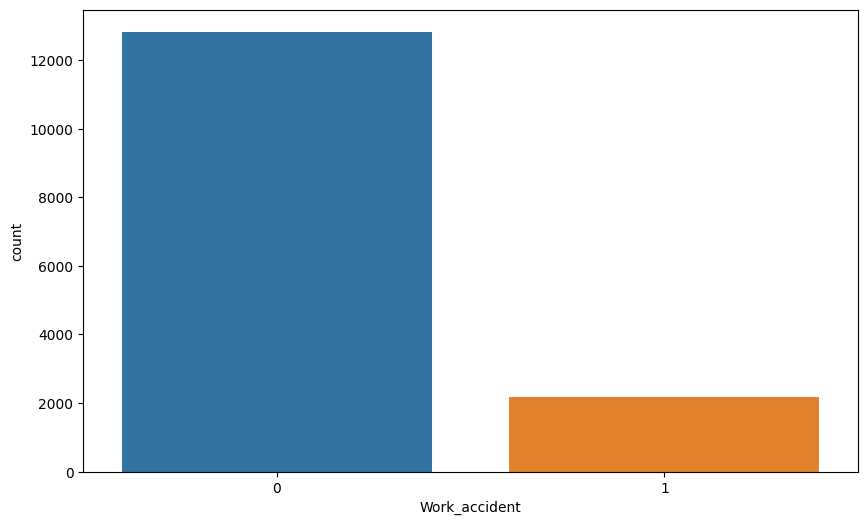

In [26]:
#Seeing the countplot of Work_accident
plt.figure(figsize=(10, 6))
sns.countplot(x=df["Work_accident"])
plt.show()

### left

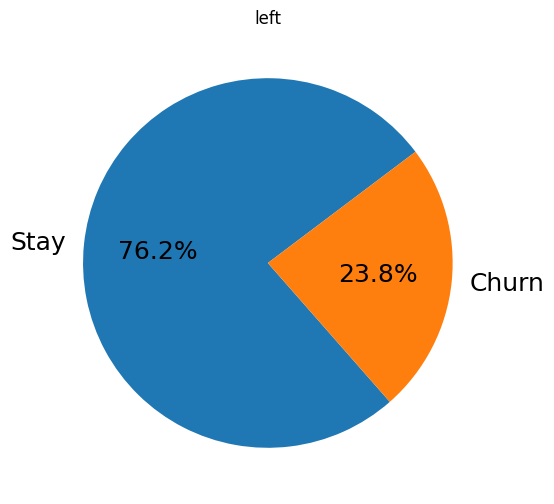

In [27]:
# Examine target column ("left")
df.left.value_counts().plot.pie(autopct='%1.1f%%',
                                  startangle=37,
                                  fontsize=18,
                                  labels=["Stay","Churn"],
                                  ylabel='',
                                  title='left');
#From here we can see that about 76.2% of them are 0 which is stayed.

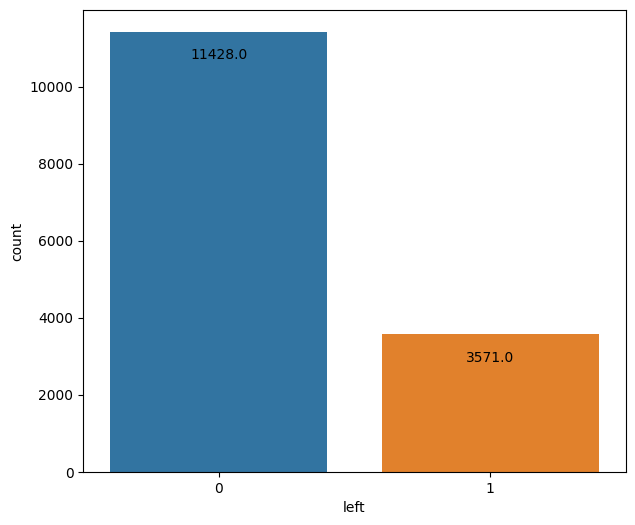

In [28]:
import seaborn as sns
import matplotlib.pyplot as plt

ax = sns.countplot(x="left", data=df)
for p in ax.patches:
    ax.annotate(f'\n{p.get_height()}', (p.get_x()+0.4, p.get_height()), ha='center', va='top', color='black')

plt.show()
#From here we can see that, the majority of the data is 0

It seems it is Imbalanced

### promotion_last_5years

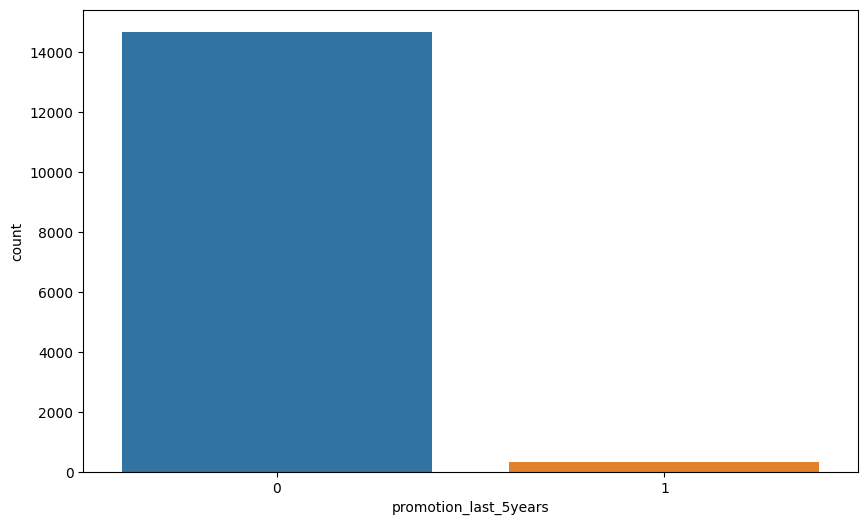

In [29]:
#Seeing the countplot of promotion_last_5years
plt.figure(figsize=(10, 6))
sns.countplot(x=df["promotion_last_5years"])
plt.show()
#From the graph, we can see that the percentage of 0 is much higher than 1. 

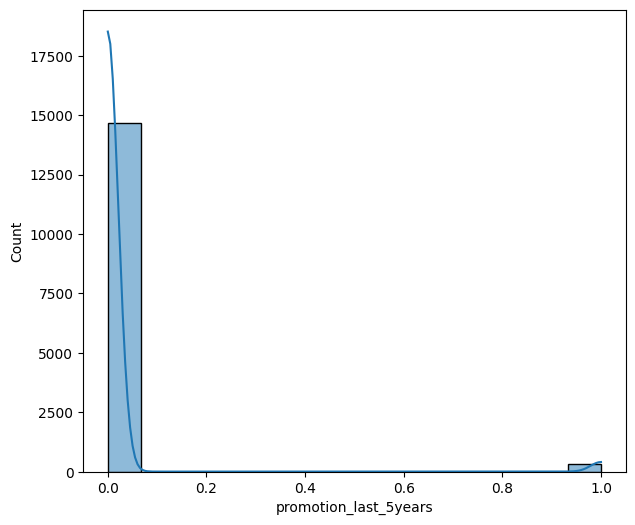

In [30]:
#Seeing the histplot of promotion_last_5years with the target
sns.histplot(df["promotion_last_5years"], kde=True)
plt.show()

In [31]:
# corr_left=pd.DataFrame(df.corr(numeric_only=True)['left'].drop('left').sort_values(ascending=False))
# corr_left

In [32]:
df.describe().iloc[:,:5].T

,count,mean,std,min,25%,50%,75%,max
satisfaction_level,14999.0,0.612834,0.248631,0.09,0.44,0.64,0.82,1.0
last_evaluation,14999.0,0.716102,0.171169,0.36,0.56,0.72,0.87,1.0
number_project,14999.0,3.803054,1.232592,2.00,3.00,4.00,5.00,7.0
average_montly_hours,14999.0,201.050337,49.943099,96.00,156.00,200.00,245.00,310.0
time_spend_company,14999.0,3.498233,1.460136,2.00,3.00,3.00,4.00,10.0


In [33]:
# select all categorical columns to graph piechart
cat_cols = df.select_dtypes(['object']).columns

cat_cols

Index(['Departments', 'salary'], dtype='object')

### Departments

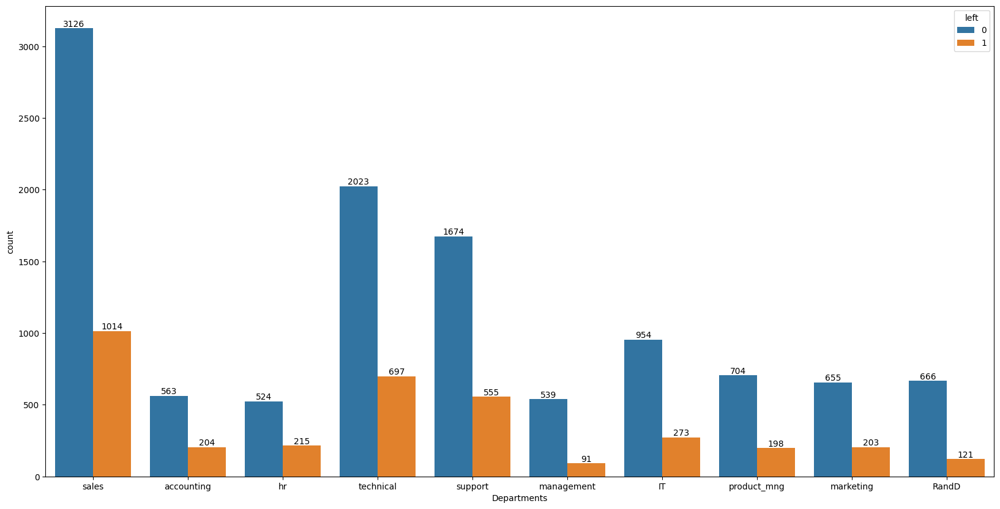

In [34]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(20,10))
ax = sns.countplot(x="Departments", data=df, hue="left", dodge=True)
for p in ax.containers:
    ax.bar_label(p, label_type='edge')

plt.show()


### salary

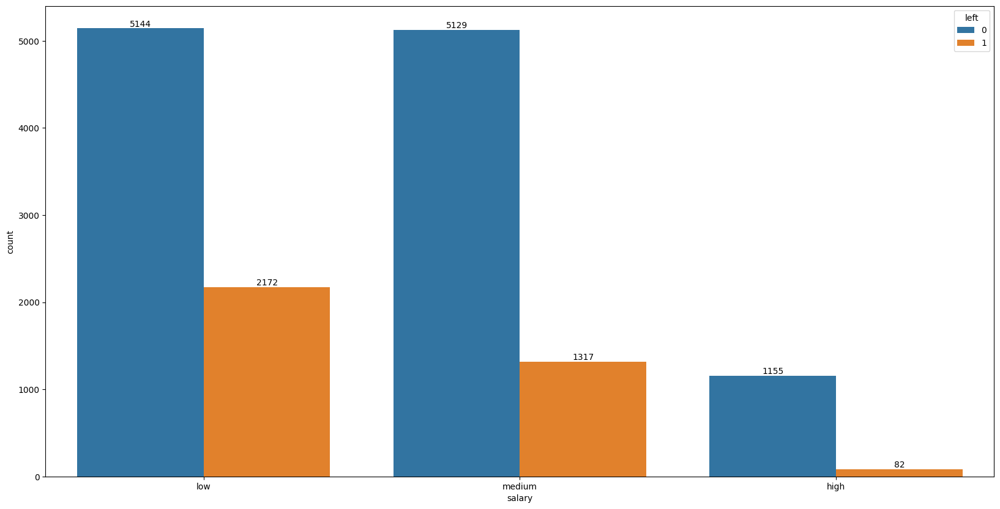

In [35]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(20,10))
ax = sns.countplot(x="salary", data=df, hue="left", dodge=True)

for p in ax.containers:
    ax.bar_label(p, label_type='edge')

plt.show()


------------------------

- The employees with high salary are by far less than the other two categories
- As much as the salary increases, the ratio of churn the company decreases 

- **42.2%** of low payed employees left
- **25.7%** of medium payed employees left
- **7%** of high payed employees left

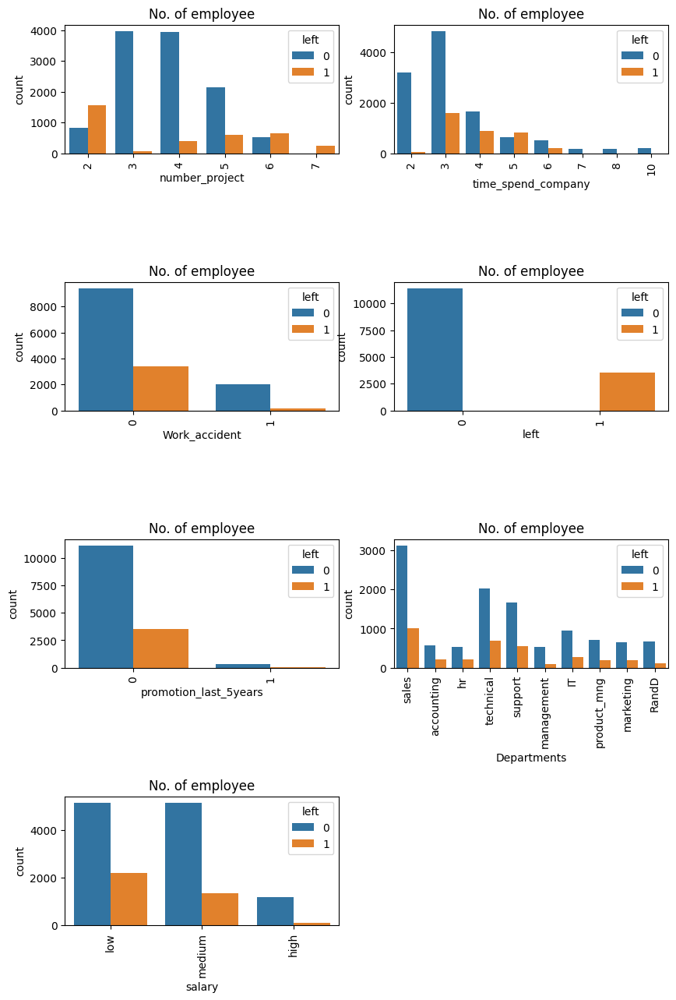

In [36]:
features=['number_project','time_spend_company','Work_accident','left', 'promotion_last_5years','Departments','salary']

fig=plt.subplots(figsize=(10,15))
for i, j in enumerate(features):
     plt.subplot(4, 2, i+1)
     plt.subplots_adjust(hspace = 1.0)
     sns.countplot(x=j,data = df, hue='left')
     plt.xticks(rotation=90)
     plt.title("No. of employee")

In [37]:
cont_col = df.describe().iloc[:,:5].columns.tolist()
cont_col = cont_col + ["left"]

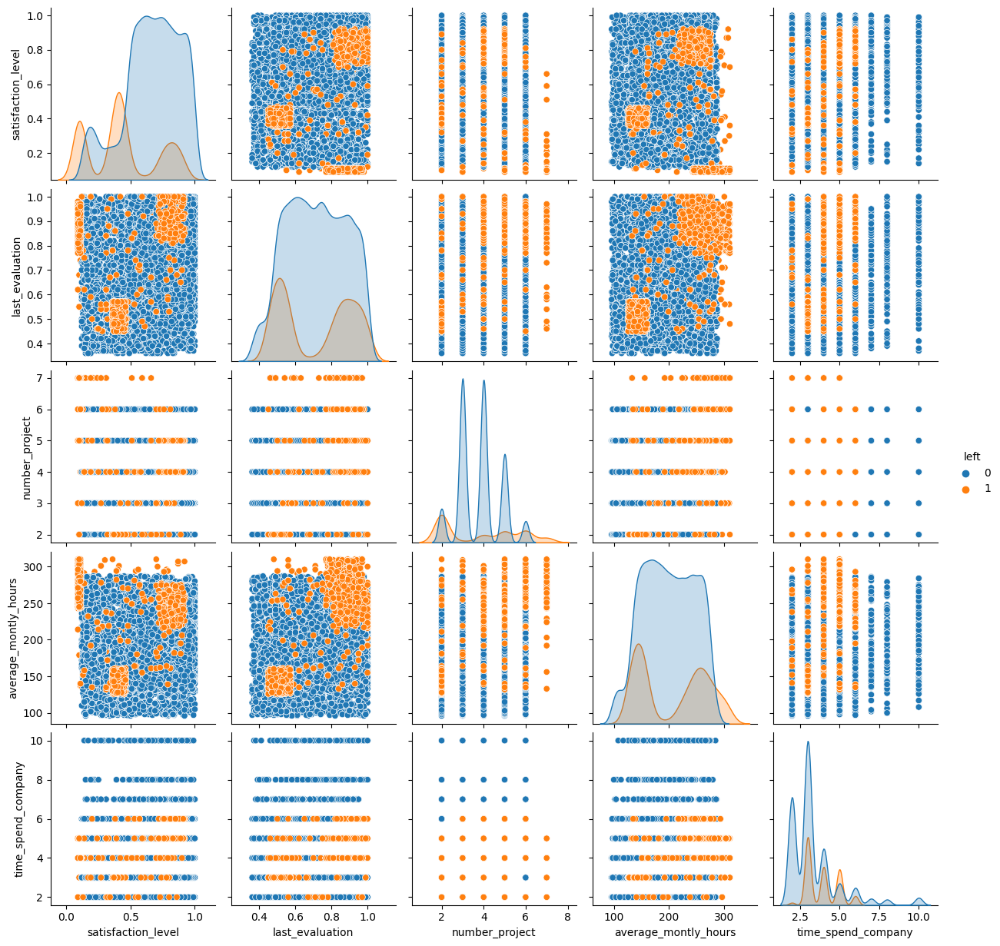

In [38]:
sns.pairplot(df.loc[:,cont_col], hue="left")
plt.show()

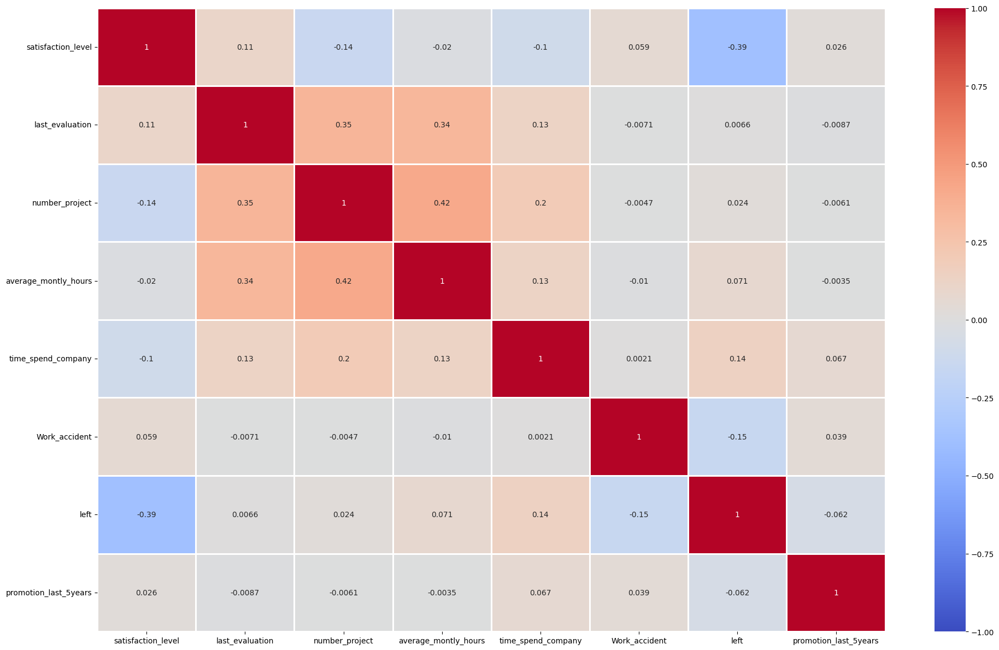

In [39]:
plt.figure(figsize=(20,12))
sns.heatmap(df.corr(numeric_only=True),annot=True,linewidth =2 ,   vmin=-1,  vmax=1, cmap="coolwarm")
plt.tight_layout()

- there is no strong (pair) relationship between any feature with the response
- there is no strong (pair) relationship between any feature with another feature
- The highest absolute coefficient of correlation is between the feature **satisfaction_level** & the response **left**

---------------
**Cramer’s V** is a measure of the strength of association between two nominal variables.


In [40]:

import scipy.stats as stats
import numpy as np

def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2 = stats.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))

In [41]:
# calculate Cramer's V
print(cramers_v(df['Work_accident'], df['promotion_last_5years']))
print(cramers_v(df['Work_accident'], df['left']))
print(cramers_v(df['promotion_last_5years'], df['left']))


0.03771591976828426
0.15418816281812223
0.06070086766300572


Very similar result to the absolute value of Pearson correlation.
<br>
so Correlation from heatmap can be used 

--------------------------

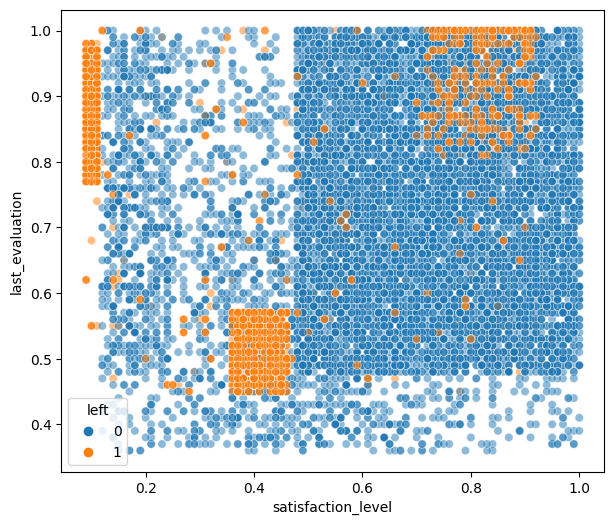

In [42]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.scatterplot(data=df, x='satisfaction_level', y='last_evaluation', hue='left', alpha= 0.5)

plt.show()


since the correlation shows just pair relationships, we went to investigate if there is a relationship between both satisfaction level & the last evaluation with the decision of churn the company, we found that:
- There are 3 different clusters of employees who churn the company. Ex:
    - employees with low satisfaction_level & high last_evaluation  maybe because they are over-qualified 

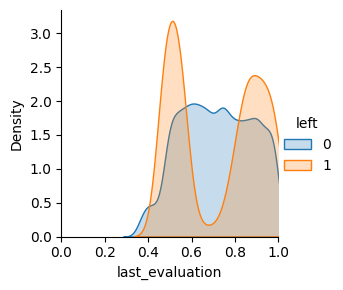

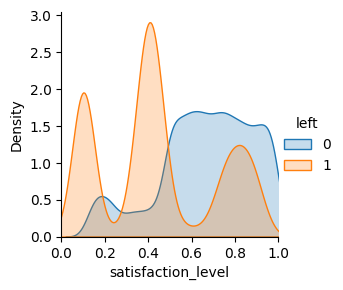

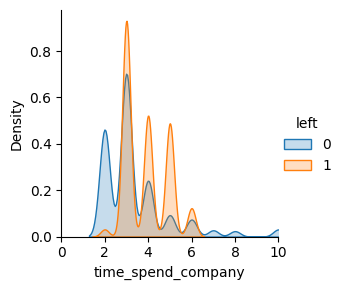

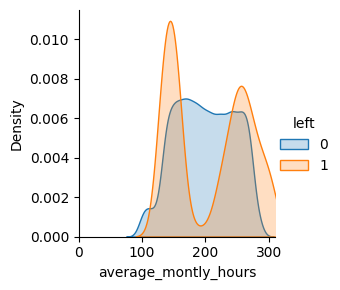

In [43]:
import seaborn as maps

plot_features = ['last_evaluation','satisfaction_level','time_spend_company','average_montly_hours']
for pf in plot_features:
    g = maps.FacetGrid(df, hue="left")
    g.map(maps.kdeplot,pf,shade= True)
    g.set(xlim=(0, df[pf].max()))
    g.add_legend()

We can notice that all of these have a unique (blue) & unique(orange) area which indicates that each feature of them can be used to distinguish between the two classes.

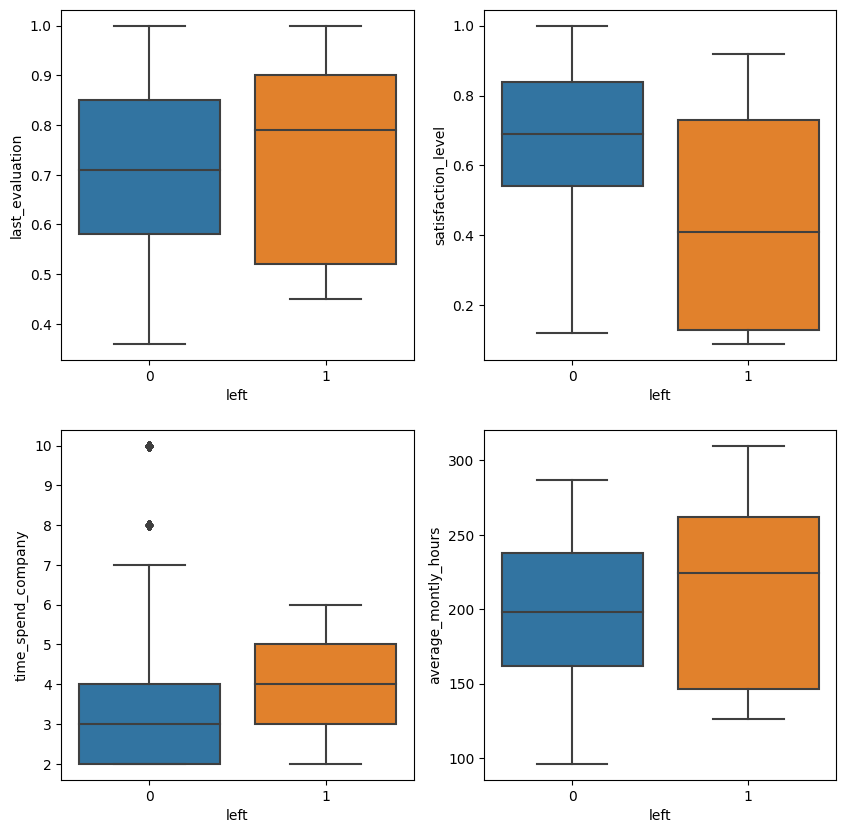

In [44]:
index = 0
plot_features = ['last_evaluation','satisfaction_level','time_spend_company','average_montly_hours']
plt.figure(figsize=(10,10))
for feature in plot_features:
        index += 1
        plt.subplot(2,2,index)
        sns.boxplot(x='left',y=feature,data=df)

In [45]:
from scipy import stats

index = 0
plot_features = ['last_evaluation','satisfaction_level','time_spend_company','average_montly_hours']
plt.figure(figsize=(10,10))
for feature in plot_features:

    # Calculate Z-scores
    z_scores = np.abs(stats.zscore(df[feature]))
    
    # Set a threshold for outlier detection
    threshold = 3.0
    
    # Identify outliers
    outliers = df[z_scores > threshold]
    
    print("Outliers in" ,feature, ":" , outliers, "\n\n\n")

Outliers in last_evaluation : Empty DataFrame
Columns: [satisfaction_level, last_evaluation, number_project, average_montly_hours, time_spend_company, Work_accident, left, promotion_last_5years, Departments, salary]
Index: [] 



Outliers in satisfaction_level : Empty DataFrame
Columns: [satisfaction_level, last_evaluation, number_project, average_montly_hours, time_spend_company, Work_accident, left, promotion_last_5years, Departments, salary]
Index: [] 



Outliers in time_spend_company :        satisfaction_level  last_evaluation  number_project  \
11007                0.49             0.67               2   
11008                0.92             0.99               3   
11009                0.81             0.55               4   
11010                0.62             0.91               3   
11011                0.21             0.70               3   
...                   ...              ...             ...   
14205                0.22             0.94               3   
14206   

<Figure size 1000x1000 with 0 Axes>

There are outliers just in time_spend_company features, we will keep them because they are not many. If needed, we may come back to delete them.

In [46]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   satisfaction_level     14999 non-null  float64
 1   last_evaluation        14999 non-null  float64
 2   number_project         14999 non-null  int64  
 3   average_montly_hours   14999 non-null  int64  
 4   time_spend_company     14999 non-null  int64  
 5   Work_accident          14999 non-null  int64  
 6   left                   14999 non-null  int64  
 7   promotion_last_5years  14999 non-null  int64  
 8   Departments            14999 non-null  object 
 9   salary                 14999 non-null  object 
dtypes: float64(2), int64(6), object(2)
memory usage: 1.1+ MB


## 4. Cluster Analysis

In [141]:
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, MinMaxScaler

cat_onehot = ["Departments"]  
cat_ordinal =["salary"]

cat_for_salary = ["low", "medium", "high"]

column_trans = make_column_transformer(
                        (OneHotEncoder(handle_unknown="ignore", sparse=False), cat_onehot),
                        (OrdinalEncoder(categories= [cat_for_salary],
                                       handle_unknown="use_encoded_value",
                                        unknown_value=-1) ,cat_ordinal),
                         remainder= MinMaxScaler(),
                         verbose_feature_names_out=False)

column_trans=column_trans.set_output(transform="pandas")

In [142]:
from sklearn.pipeline import Pipeline
operations = [("OneHot_Ordinal_Encoder", column_trans)]

CA_pipe = Pipeline(steps=operations).set_output(transform="pandas")

In [196]:
# Check pipeline
CA_pipe


Pipeline(steps=[('OneHot_Ordinal_Encoder',
                 ColumnTransformer(remainder=MinMaxScaler(),
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  ['Departments']),
                                                 ('ordinalencoder',
                                                  OrdinalEncoder(categories=[['low',
                                                                              'medium',
                                                                              'high']],
                                                                 handle_unknown='use_encoded_value',
                                                                 unknown_value=-1),
                                                  ['salary'])],
                                   verbose_feature_names_out=False))])

In [144]:
my_list = df.columns.tolist()
my_list.remove('left')
print(my_list) 

['satisfaction_level', 'last_evaluation', 'number_project', 'average_montly_hours', 'time_spend_company', 'Work_accident', 'promotion_last_5years', 'Departments', 'salary']


In [145]:
my_list

['satisfaction_level',
 'last_evaluation',
 'number_project',
 'average_montly_hours',
 'time_spend_company',
 'Work_accident',
 'promotion_last_5years',
 'Departments',
 'salary']

In [197]:
x_No_left = df.drop("left", axis=1)
x_No_left

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,Departments,salary
0,0.38,0.53,2,157,3,0,0,sales,low
1,0.80,0.86,5,262,6,0,0,sales,medium
2,0.11,0.88,7,272,4,0,0,sales,medium
3,0.72,0.87,5,223,5,0,0,sales,low
4,0.37,0.52,2,159,3,0,0,sales,low
...,...,...,...,...,...,...,...,...,...
14994,0.40,0.57,2,151,3,0,0,support,low
14995,0.37,0.48,2,160,3,0,0,support,low
14996,0.37,0.53,2,143,3,0,0,support,low
14997,0.11,0.96,6,280,4,0,0,support,low


In [199]:
x_No_left = CA_pipe.fit_transform(x_No_left)
x_No_left

,Departments_IT,Departments_RandD,Departments_accounting,Departments_hr,Departments_management,Departments_marketing,Departments_product_mng,Departments_sales,Departments_support,Departments_technical,salary,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.318681,0.265625,0.0,0.285047,0.125,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.780220,0.781250,0.6,0.775701,0.500,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.021978,0.812500,1.0,0.822430,0.250,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.692308,0.796875,0.6,0.593458,0.375,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.307692,0.250000,0.0,0.294393,0.125,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14994,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.340659,0.328125,0.0,0.257009,0.125,0.0,0.0
14995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.307692,0.187500,0.0,0.299065,0.125,0.0,0.0
14996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.307692,0.265625,0.0,0.219626,0.125,0.0,0.0
14997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.021978,0.937500,0.8,0.859813,0.250,0.0,0.0


**Tendacy for Clustering**

In [198]:
# function to compute hopkins's statistic for the dataframe X
from sklearn.neighbors import NearestNeighbors
from random import sample
from numpy.random import uniform
def hopkins(X, ratio=0.05):

    if not isinstance(X, np.ndarray):
      X=X.values  #convert dataframe to a numpy array
    sample_size = int(X.shape[0] * ratio) #0.05 (5%) based on paper by Lawson and Jures

    #a uniform random sample in the original data space
    X_uniform_random_sample = uniform(X.min(axis=0), X.max(axis=0) ,(sample_size , X.shape[1]))

    #a random sample of size sample_size from the original data X
    random_indices=sample(range(0, X.shape[0], 1), sample_size)
    X_sample = X[random_indices]

    #initialise unsupervised learner for implementing neighbor searches
    neigh = NearestNeighbors(n_neighbors=2)
    nbrs=neigh.fit(X)

    #u_distances = nearest neighbour distances from uniform random sample
    u_distances , u_indices = nbrs.kneighbors(X_uniform_random_sample , n_neighbors=2)
    u_distances = u_distances[: , 0] #distance to the first (nearest) neighbour

    #w_distances = nearest neighbour distances from a sample of points from original data X
    w_distances , w_indices = nbrs.kneighbors(X_sample , n_neighbors=2)
    #distance to the second nearest neighbour (as the first neighbour will be the point itself, with distance = 0)
    w_distances = w_distances[: , 1]

    u_sum = np.sum(u_distances)
    w_sum = np.sum(w_distances)

    #compute and return hopkins' statistic
    H = u_sum/ (u_sum + w_sum)
    return H

In [200]:
#Hopkins test which can be used for tendency of clustering, where >0.5 is support that idea
#We use the whole dataset for the test since its not big

# Whole dataset
print(hopkins(x_No_left,1)) 
# default ratio
print(hopkins(x_No_left,0.05)) 


0.9470945928934681
0.9477537839599319


**It is by far higher than 0.5 which indicates the dataset has tendecy to be clustered**

### i. Define the Optimal Number of Clusters

### inertia

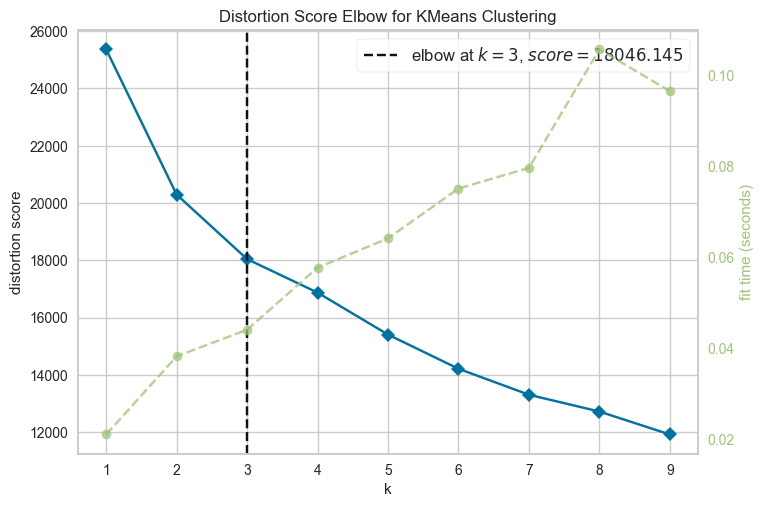

In [202]:
from yellowbrick.cluster import KElbowVisualizer
kmeans = KMeans()
visu = KElbowVisualizer(kmeans, k = (1,10))
visu.fit(x_No_left)
visu.show();

In [203]:
i = 0
per_reduction = []
while i < len(ssd) - 1 :
    per_reduction.append( (abs(ssd[i+1] - ssd[i])/ssd[i]) * 100 )
    i = i + 1
per_reduction

[19.9707137682791,
 11.089063308011928,
 6.375383755573308,
 10.098584297159137,
 7.530596436825504,
 4.2039592720782535,
 4.743459941757604,
 5.390357233240111,
 6.104143055679878]

----------------------
**Silhouette Score**

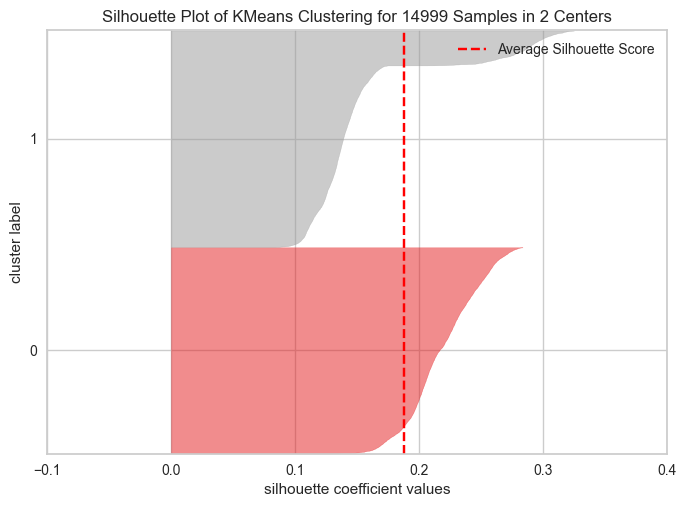

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 14999 Samples in 2 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [204]:
from sklearn.cluster import KMeans

from yellowbrick.cluster import SilhouetteVisualizer

model3 = KMeans(n_clusters=2, random_state=42)
visualizer = SilhouetteVisualizer(model3)

visualizer.fit(x_No_left)  # Fit the data to the visualizer
visualizer.poof()

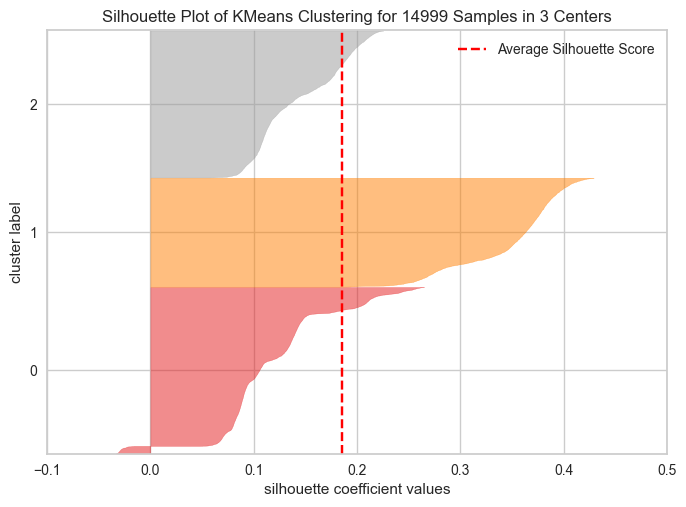

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 14999 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [205]:
from sklearn.cluster import KMeans

from yellowbrick.cluster import SilhouetteVisualizer

model3 = KMeans(n_clusters=3, random_state=42)
visualizer = SilhouetteVisualizer(model3)

visualizer.fit(x_No_left)  # Fit the data to the visualizer
visualizer.poof()

### ii. Model Fitting

In [207]:
kmeans1 = KMeans(n_clusters=2, random_state=42)

x_No_left['cluster_ID'] = kmeans1.fit_predict(x_No_left) 
x_No_left

,Departments_IT,Departments_RandD,Departments_accounting,Departments_hr,Departments_management,Departments_marketing,Departments_product_mng,Departments_sales,Departments_support,Departments_technical,salary,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,cluster_ID
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.318681,0.265625,0.0,0.285047,0.125,0.0,0.0,0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.780220,0.781250,0.6,0.775701,0.500,0.0,0.0,1
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.021978,0.812500,1.0,0.822430,0.250,0.0,0.0,1
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.692308,0.796875,0.6,0.593458,0.375,0.0,0.0,0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.307692,0.250000,0.0,0.294393,0.125,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14994,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.340659,0.328125,0.0,0.257009,0.125,0.0,0.0,0
14995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.307692,0.187500,0.0,0.299065,0.125,0.0,0.0,0
14996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.307692,0.265625,0.0,0.219626,0.125,0.0,0.0,0
14997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.021978,0.937500,0.8,0.859813,0.250,0.0,0.0,0


### iii. Visualize the Clusters

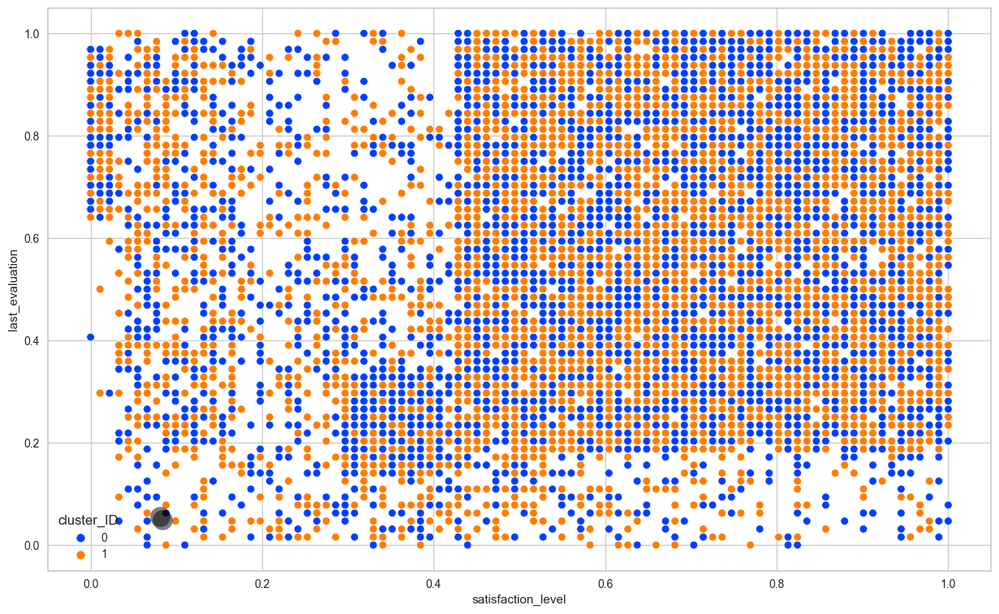

In [208]:
plt.figure(figsize=(15, 9))
import seaborn as sns
import matplotlib.pyplot as plt

sns.scatterplot(data=x_No_left, x='satisfaction_level', y='last_evaluation', hue='cluster_ID',  palette="bright")

centers = kmeans1.cluster_centers_
plt.scatter(centers[:, 0],
            centers[:, 1],
            c='black',
            s=300,
            alpha=0.5)

# We look at the clusters and centroids formed according to ##########

In [209]:
from sklearn.metrics import adjusted_rand_score
# adjusted_rand_score is not accuracy,
# adjusted_rand_score penalizes errors.
# In order to calculate the adjusted_rand_score, we somehow need to have
# at least some of the actual labels at our disposal.

In [211]:
ct = pd.crosstab(x_No_left['cluster_ID'] , y)
ct

left,0,1
cluster_ID,,
0,5144,2172
1,6284,1399


In [215]:
print("ARI:",adjusted_rand_score(x_No_left['cluster_ID'] , y) * 100,"%")
# the closer this score was to 1, predicted clusters are not smmilar and well separated.

ARI: 1.6057699340299447 %


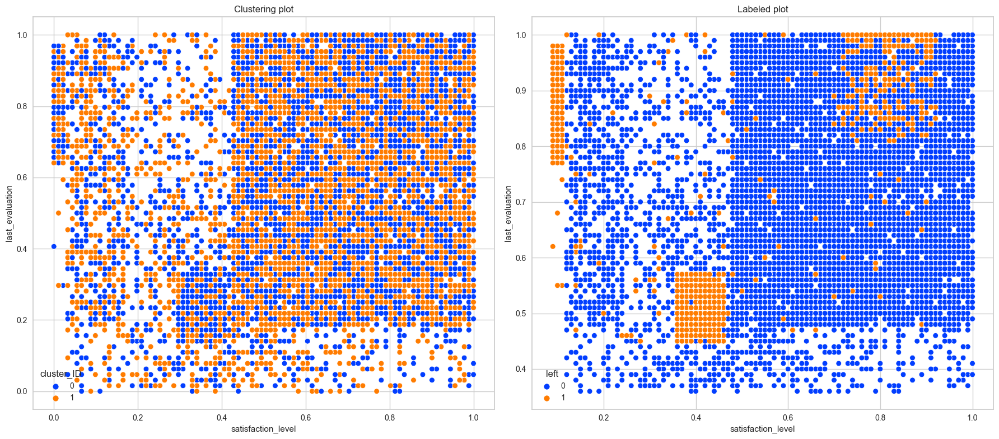

In [216]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

# Create the figure and grid
fig = plt.figure(figsize=(18, 8))
gs = GridSpec(1, 2, width_ratios=[2, 2])

#---------------------------------------

# Create the first plot
ax1 = plt.subplot(gs[0])
sns.scatterplot(data=x_No_left, x="satisfaction_level", y="last_evaluation", hue="cluster_ID", palette="bright", ax=ax1)

# Add the title to the first plot
ax1.set_title("Clustering plot")
#---------------------------------------

# Create the second plot
ax2 = plt.subplot(gs[1])
sns.scatterplot(data=df, x="satisfaction_level", y="last_evaluation", hue="left", palette="bright", ax=ax2)
# Add thetitle to the second plot
ax2.set_title("Labeled plot")

#---------------------------------------

# Adjust spacing and show the plot
plt.tight_layout()
plt.show()




## 4B. Cluster Analysis (FAMD)

### What is FAMD?

**FAMD** *(Factor Analysis of Mixed Data)* is a multivariate statistical technique that is specifically designed to analyze datasets containing both quantitative and qualitative variables (which is the case of our dataset). It aims to uncover underlying patterns and relationships within the data by projecting the mixed data onto a lower-dimensional space while preserving as much information as possible.
<br>

**FAMD** can be viewed as a hybrid of PCA and MCA. It incorporates the strengths of both techniques, allowing for the exploration of both quantitative and qualitative dimensions simultaneously.

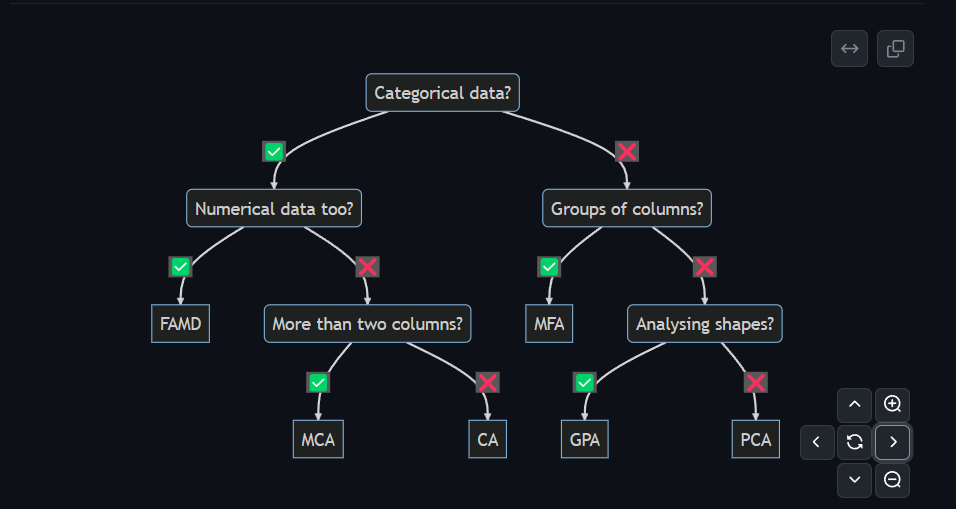

https://github.com/MaxHalford/prince

### Extract the Factors

In [219]:
# # install the needed library
# !pip install prince


In [220]:
import prince

# re-definde X using the whole features
X_famd = df.drop("left", axis=1)

#Instantiate the FAMD class:
famd = prince.FAMD(n_components=10, random_state=101)



In [221]:
# fit it into our data
famd.fit(X_famd)


FAMD(n_components=10, random_state=101)

In [222]:
# col: factors number
# row: observation

famd.row_coordinates(X_famd)

# this is what will be used for clustering

component,0,1,2,3,4,5,6,7,8,9
0,-1.969610,-4.669134,0.397934,-0.276969,1.766414,0.062949,-0.271847,-1.216755,0.385973,3.003890
1,0.498599,2.790505,-3.086218,-5.150498,1.107608,-0.304437,-4.018656,3.346446,1.022220,-1.020632
2,7.594927,-2.231974,2.894274,4.554478,1.942186,-2.106823,-1.572975,-1.250262,-1.350001,-2.260652
3,1.527767,2.693244,-3.340375,-1.758088,1.387211,-0.248526,0.306141,-1.933943,-0.499628,0.364546
4,-2.833245,-5.101666,-0.673363,0.198732,-0.354979,-0.281112,0.495244,-1.084418,-0.058082,-1.837000
...,...,...,...,...,...,...,...,...,...,...
14994,-2.419572,-4.877446,-1.059783,0.276795,-0.556333,-1.263498,1.484683,0.349726,0.776781,2.161968
14995,-2.434059,-5.342308,0.495662,1.315127,0.792435,-2.054557,-0.126930,3.505682,1.228596,-1.819351
14996,-2.780910,-5.067358,-0.884851,0.009809,-2.213003,1.197039,1.127116,1.220053,0.973782,0.823747
14997,6.552841,-1.427956,0.756980,-3.078952,-1.188908,3.546052,-1.479559,2.545452,-1.400314,-4.566226


In [223]:
# # coordinations of each factor
# famd.column_coordinates_

-----------------------

In [224]:
# Check dataframe before the loop
X_famd

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,Departments,salary
0,0.38,0.53,2,157,3,0,0,sales,low
1,0.80,0.86,5,262,6,0,0,sales,medium
2,0.11,0.88,7,272,4,0,0,sales,medium
3,0.72,0.87,5,223,5,0,0,sales,low
4,0.37,0.52,2,159,3,0,0,sales,low
...,...,...,...,...,...,...,...,...,...
14994,0.40,0.57,2,151,3,0,0,support,low
14995,0.37,0.48,2,160,3,0,0,support,low
14996,0.37,0.53,2,143,3,0,0,support,low
14997,0.11,0.96,6,280,4,0,0,support,low


In [226]:
import prince

# re-definde X using the whole features
X_famd = df.drop("left", axis=1)

component_num = []
ARI_score = []


ssd = []
  # distances from each observation to each cluster centroid


for component  in range(1, 200, 3):                                 # [1, 200] with step=3
    famd = prince.FAMD(n_components=component, random_state=101)

    # fit to get the factors 
    famd.fit(X_famd)

    # fit the clustering on the factors
    model = KMeans(n_clusters=2, random_state=42).fit(famd.row_coordinates(X_famd))
    pred = model.labels_

    # Append the factor number with its corresponding score 
    ARI_score.append(adjusted_rand_score(y, pred))
    component_num.append(component)


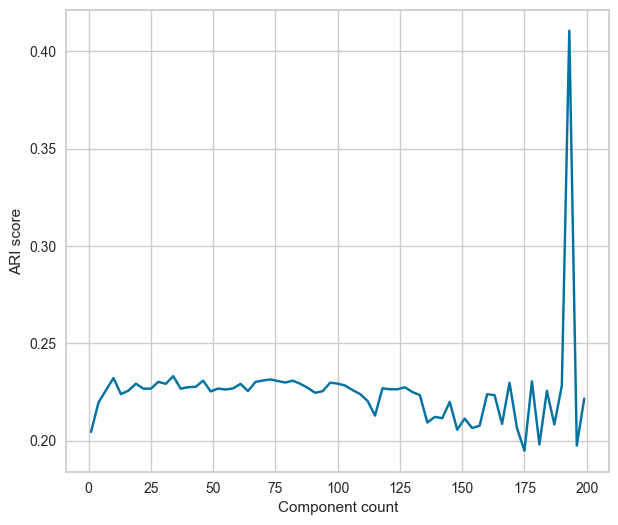

In [460]:
plt.plot(component_num, ARI_score)
plt.xlabel("Component count")
plt.ylabel("ARI score");

In [461]:
ARI_score[-3]

0.41052278731149355

In [462]:
component_num[-3]

193

In [227]:
X_famd = df.drop("left", axis=1)

famd = prince.FAMD(n_components=193, random_state=101)

# fit to get the factors 
famd.fit(X_famd)

# fit the clustering on the factors
model = KMeans(n_clusters=2, random_state=42).fit(famd.row_coordinates(X_famd))
pred = model.labels_

# Append the factor number with its corresponding score 
print(adjusted_rand_score(y, pred ))

ct = pd.crosstab(pred , y)
display(ct)

0.41052278731149355


left,0,1
row_0,,
0,1444,2526
1,9984,1045


In [228]:
famd = prince.FAMD(n_components=193, random_state=101)

# fit to get the factors 
X_famd_ready = famd.fit(X_famd)


In [229]:
# the new dataset
X_famd_ready.row_coordinates(X_famd).sample(3)


component,0,1,2,3,4,5,6,7,8,9,...,183,184,185,186,187,188,189,190,191,192
9241,-1.170974,-2.685602,0.372218,-2.229777,-0.221306,0.651256,2.549406,2.707540,-0.402632,-0.164153,...,-1.716280,-1.259985,0.032308,-0.761103,-2.181194,-1.805971,-1.980869,-2.778607,-0.635164,0.736493
467,10.085343,2.614001,4.326350,2.828214,-10.565988,5.158868,-1.229707,1.645605,2.202667,10.087235,...,-2.123891,-6.252133,4.140865,-1.647117,1.635995,-1.672511,1.054098,-4.557156,4.335646,0.697714
5016,0.024751,-1.884519,-2.294423,1.499473,-1.119068,-0.516642,1.013033,-0.967910,-1.376643,-1.138875,...,-1.492898,0.571962,-1.657073,-0.247941,2.235244,-1.768710,1.590046,0.450441,-1.120288,1.202496


In [230]:
# initialized  the kmean
kmeans1 = KMeans(n_clusters=2, random_state=42)

# add clusters to dataset
X_famd['cluster_ID'] = kmeans1.fit_predict(X_famd_ready.row_coordinates(X_famd)) 
X_famd.sample(3)

X_famd['cluster_ID']

0        0
1        1
2        0
3        1
4        0
        ..
14994    0
14995    0
14996    0
14997    0
14998    0
Name: cluster_ID, Length: 14999, dtype: int32

<Axes: xlabel='satisfaction_level', ylabel='last_evaluation'>

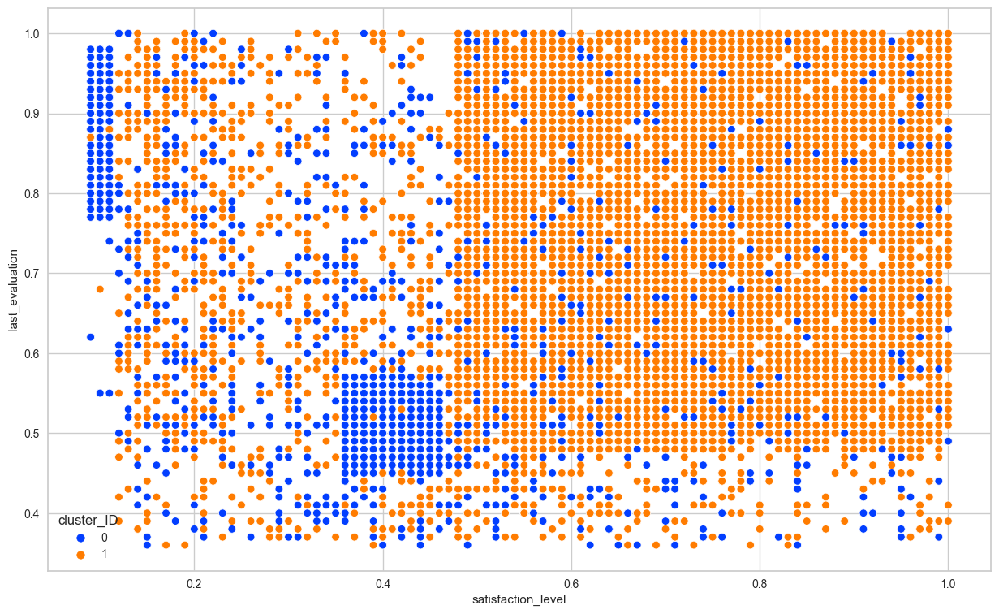

In [231]:
plt.figure(figsize=(15, 9))
import seaborn as sns
import matplotlib.pyplot as plt

sns.scatterplot(data=X_famd, x='satisfaction_level', y='last_evaluation', hue='cluster_ID',  palette="bright")

# centers = kmeans1.cluster_centers_
# plt.scatter(c='black',
#             s=300,
#             alpha=0.5)

# We look at the clusters and centroids formed according to ##########

Here the employees left given 0 not 1
so we will do mapping to fix this

In [232]:
X_famd['cluster_ID'] = X_famd['cluster_ID'].map({0:1, 1:0}) 

<Axes: xlabel='satisfaction_level', ylabel='last_evaluation'>

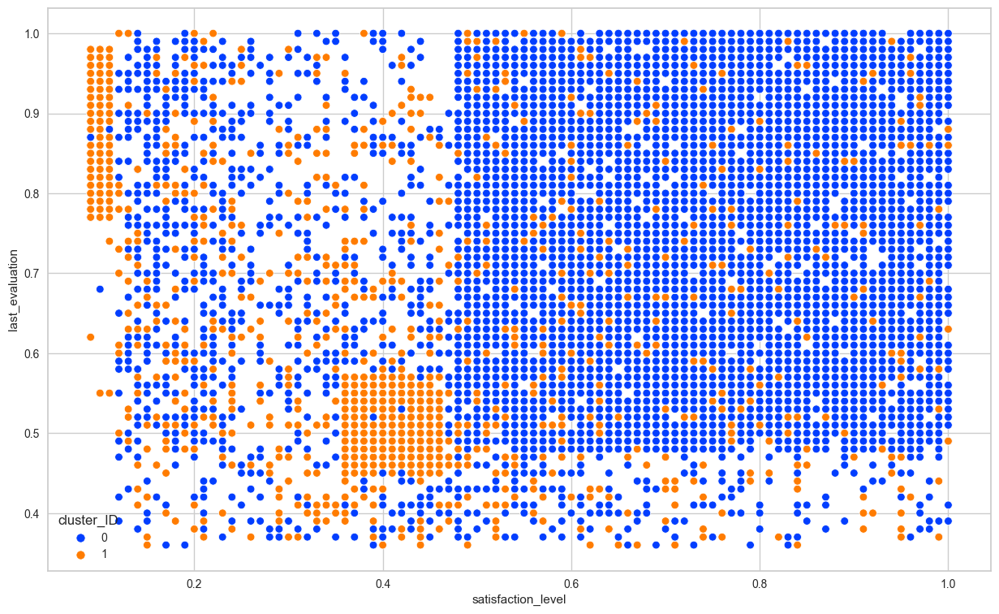

In [233]:
plt.figure(figsize=(15, 9))
import seaborn as sns
import matplotlib.pyplot as plt

sns.scatterplot(data=X_famd, x='satisfaction_level', y='last_evaluation', hue='cluster_ID',  palette="bright")


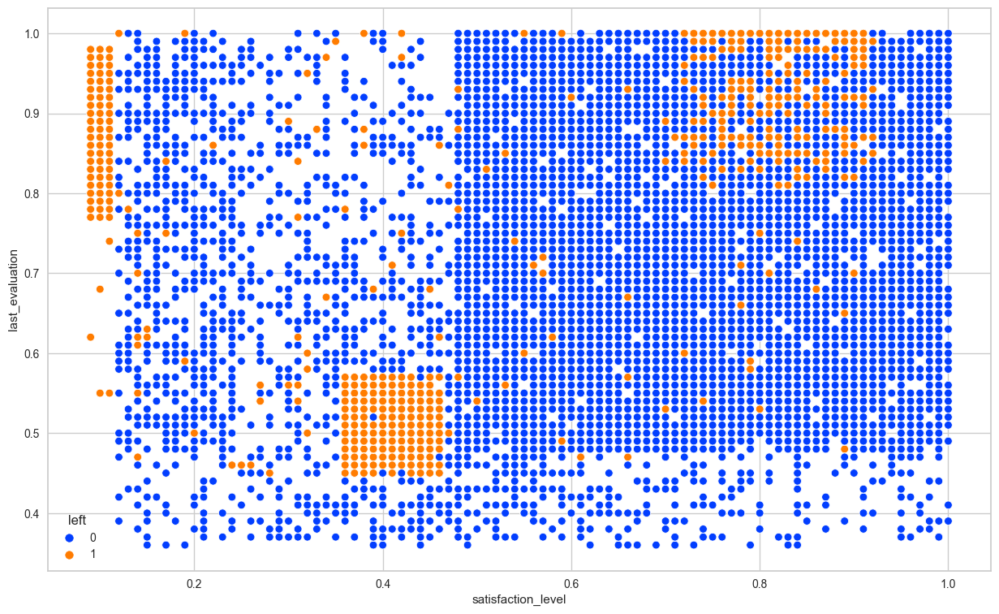

In [234]:
plt.figure(figsize=(15, 9))

import seaborn as sns
import matplotlib.pyplot as plt

sns.scatterplot(data=df, x='satisfaction_level', y='last_evaluation', hue='left',   palette="bright")

plt.show()


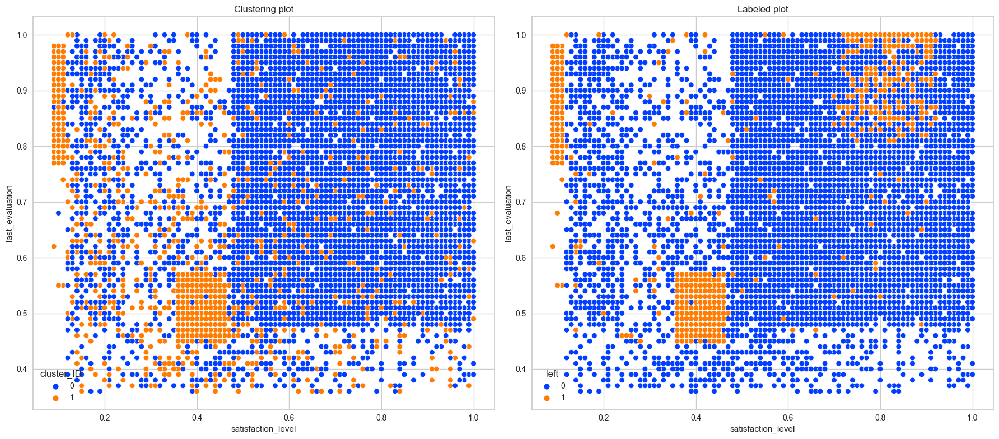

In [235]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

# Create the figure and grid
fig = plt.figure(figsize=(18, 8))
gs = GridSpec(1, 2, width_ratios=[2, 2])

#---------------------------------------

# Create the first plot
ax1 = plt.subplot(gs[0])
sns.scatterplot(data=X_famd, x="satisfaction_level", y="last_evaluation", hue="cluster_ID", palette="bright", ax=ax1)

# Add the title to the first plot
ax1.set_title("Clustering plot")
#---------------------------------------

# Create the second plot
ax2 = plt.subplot(gs[1])
sns.scatterplot(data=df, x="satisfaction_level", y="last_evaluation", hue="left", palette="bright", ax=ax2)
# Add thetitle to the second plot
ax2.set_title("Labeled plot")

#---------------------------------------

# Adjust spacing and show the plot
plt.tight_layout()
plt.show()




In [236]:
df.sample(3)

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,Departments,salary
8604,0.99,0.73,4,224,2,0,0,0,support,low
2343,0.82,0.97,3,115,2,1,0,0,support,low
7876,0.16,0.76,6,218,6,0,0,0,sales,medium


In [237]:
X_famd_L1 = df.query("left==1")[['satisfaction_level',
 'last_evaluation',
 'number_project',
 'average_montly_hours',
 'time_spend_company',
 'Work_accident',
 'promotion_last_5years',
 'Departments',
 'salary']]
X_famd_L1

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,Departments,salary
0,0.38,0.53,2,157,3,0,0,sales,low
1,0.80,0.86,5,262,6,0,0,sales,medium
2,0.11,0.88,7,272,4,0,0,sales,medium
3,0.72,0.87,5,223,5,0,0,sales,low
4,0.37,0.52,2,159,3,0,0,sales,low
...,...,...,...,...,...,...,...,...,...
14994,0.40,0.57,2,151,3,0,0,support,low
14995,0.37,0.48,2,160,3,0,0,support,low
14996,0.37,0.53,2,143,3,0,0,support,low
14997,0.11,0.96,6,280,4,0,0,support,low


In [238]:
famd= prince.FAMD(n_components=170,n_iter=3,copy=True,check_input=True,random_state=42)
famd = famd.fit(X_famd_L1)
famd.eigenvalues_summary

,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,11.036,1.70%,1.70%
1,9.077,1.40%,3.10%
2,5.989,0.92%,4.02%
3,5.212,0.80%,4.82%
4,5.138,0.79%,5.61%
...,...,...,...
165,2.636,0.41%,94.30%
166,2.567,0.40%,94.70%
167,2.545,0.39%,95.09%


In [239]:
famd.row_coordinates(X_famd_L1).shape

(3571, 170)

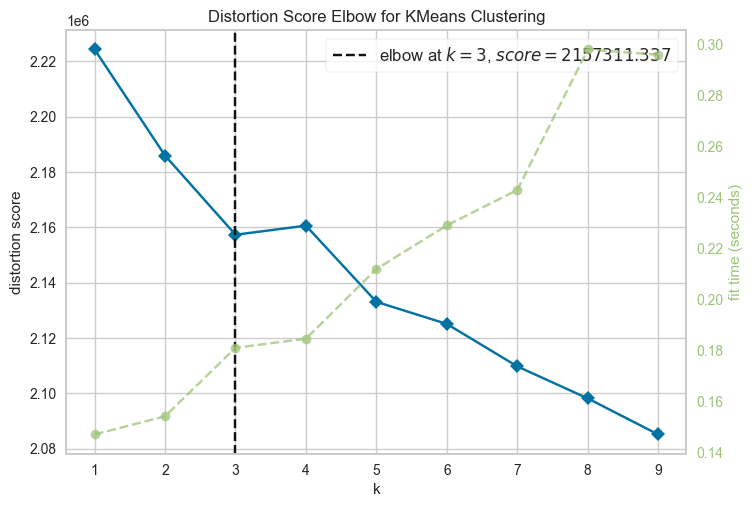

In [240]:
from yellowbrick.cluster import KElbowVisualizer
kmeans = KMeans( random_state=42)
visu = KElbowVisualizer(kmeans, k = (1,10))
visu.fit(famd.row_coordinates(X_famd_L1))
visu.show();

In [241]:
kmeans1 = KMeans(n_clusters=3, random_state=42)

X_famd_L1['cluster_ID'] = kmeans1.fit_predict(famd.row_coordinates(X_famd_L1)) 
X_famd_L1

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,Departments,salary,cluster_ID
0,0.38,0.53,2,157,3,0,0,sales,low,2
1,0.80,0.86,5,262,6,0,0,sales,medium,0
2,0.11,0.88,7,272,4,0,0,sales,medium,1
3,0.72,0.87,5,223,5,0,0,sales,low,0
4,0.37,0.52,2,159,3,0,0,sales,low,2
...,...,...,...,...,...,...,...,...,...,...
14994,0.40,0.57,2,151,3,0,0,support,low,2
14995,0.37,0.48,2,160,3,0,0,support,low,2
14996,0.37,0.53,2,143,3,0,0,support,low,2
14997,0.11,0.96,6,280,4,0,0,support,low,1


### iii. Visualize the Clusters

Text(0.5, 1.0, "Clusters of employees who left ('left' = 0)")

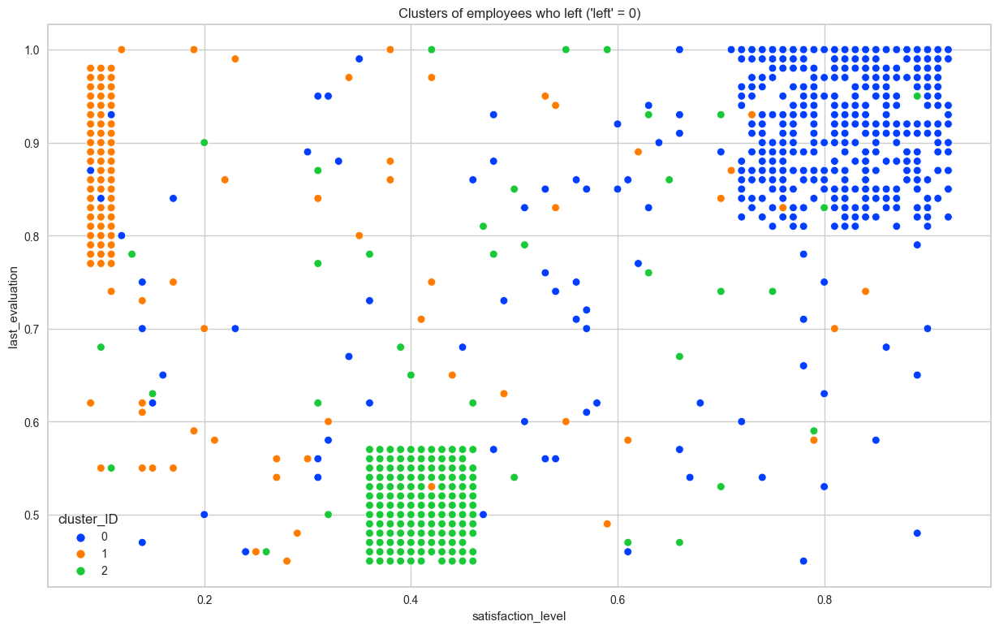

In [256]:
plt.figure(figsize=(15, 9))
import seaborn as sns
import matplotlib.pyplot as plt

sns.scatterplot(data=X_famd_L1, x='satisfaction_level', y='last_evaluation', hue='cluster_ID',  palette="bright")
plt.title("Clusters of employees who left ('left' = 0)")
# centers = kmeans1.cluster_centers_
# plt.scatter(centers[:, 0],
#             centers[:, 1],
#             c='black',
#             s=300,
#             alpha=0.5)

# We look at the clusters and centroids formed according to ##########

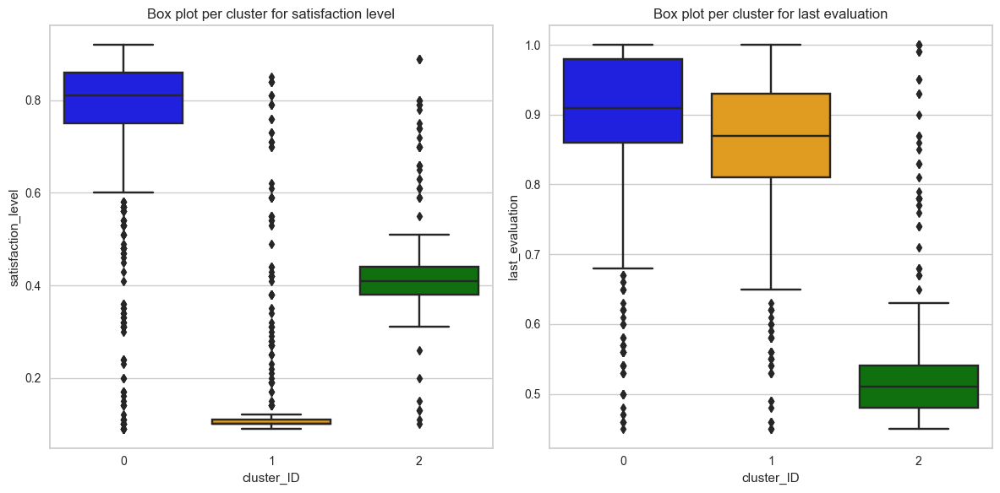

In [258]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.boxplot(x='cluster_ID', y='satisfaction_level', data=X_famd_L1, palette=['blue', 'orange', 'green'])
plt.title('Box plot per cluster for satisfaction level')

plt.subplot(1, 2, 2)
sns.boxplot(x='cluster_ID', y='last_evaluation', data=X_famd_L1, palette=['blue', 'orange', 'green'])
plt.title('Box plot per cluster for last evaluation')

plt.tight_layout()
plt.show()


| Cluster_ID | Satisfaction_level                           | Last_evaluation | Cluster |
|------------|-----------------------------------|-----------|---------|
| 0          | High                      | High         |    Find better opportunity because of their quality |
| 1          | Low                     |High                   |   Overqualified or want salary raise                     | 
| 2          | Moderate                     | Low     | Maybe need courses or get rid of them|


In [130]:
# from sklearn.metrics import adjusted_rand_score
# # adjusted_rand_score is not accuracy,
# # adjusted_rand_score penalizes errors.
# # In order to calculate the adjusted_rand_score, we somehow need to have
# # at least some of the actual labels at our disposal.

In [131]:
# ct = pd.crosstab(X_encoded_scaled['cluster_ID'] , y)
# ct

left,1
cluster_ID,
0,1630
1,1167
2,774


In [ ]:
# adjusted_rand_score(X_encoded_scaled['cluster_ID'] , y)
# # the closer this score was to 1, predicted clusters are not smmilar and well separated.

## 4C. Clustering Summary

- We did encoding & scaling to the dataset
- Delete the label column *left*
- Check if 2 clusters is even reasonable using Elbow method & Silhouette score
- We use to comparison, two things, if 2 clusters: ARI, & evaluation-satisfaction plot (*left* as hue)
- Then, we tried the following:
    - tried to get better results by using FAMD to prepare the dataset before clustering
    - Check the clusters result for 2 clusters
    - Do clustering for people who left 


## 5. Predictive Model Building

### Preprocessing

In [113]:
X = df.drop("left", axis=1)
display(X)
y = df.left
print(y)

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,Departments,salary
0,0.38,0.53,2,157,3,0,0,sales,low
1,0.80,0.86,5,262,6,0,0,sales,medium
2,0.11,0.88,7,272,4,0,0,sales,medium
3,0.72,0.87,5,223,5,0,0,sales,low
4,0.37,0.52,2,159,3,0,0,sales,low
...,...,...,...,...,...,...,...,...,...
14994,0.40,0.57,2,151,3,0,0,support,low
14995,0.37,0.48,2,160,3,0,0,support,low
14996,0.37,0.53,2,143,3,0,0,support,low
14997,0.11,0.96,6,280,4,0,0,support,low


0        1
1        1
2        1
3        1
4        1
        ..
14994    1
14995    1
14996    1
14997    1
14998    1
Name: left, Length: 14999, dtype: int64


In [114]:
CA_pipe

Pipeline(steps=[('OneHot_Ordinal_Encoder',
                 ColumnTransformer(remainder=MinMaxScaler(),
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  ['Departments']),
                                                 ('ordinalencoder',
                                                  OrdinalEncoder(categories=[['low',
                                                                              'medium',
                                                                              'high']],
                                                                 handle_unknown='use_encoded_value',
                                                                 unknown_value=-1),
                                                  ['salary'])],
                                   verbose_feature_names_out=False))])

Split the dataframe into train & test

In [115]:
# define seed fro models & split for a fair comparison

seed = 101

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=seed)
# stratify since it is imbalance


In [116]:
# Check
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)


(11999, 9)
(3000, 9)
(11999,)
(3000,)


-------
**Define Function**

In [117]:
def eval_metric(model, X_train, y_train, X_test, y_test):
    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)

    print("Test_Set")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set")
    print(confusion_matrix(y_train, y_train_pred))
    print(classification_report(y_train, y_train_pred))

---------
**Define scorer**

In [118]:

f1_churn = make_scorer(f1_score, average=None, labels=[1])
precision_churn = make_scorer(precision_score, average=None, labels=[1])
recall_churn = make_scorer(recall_score, average=None, labels=[1])


scoring = {
    "f1_churn": f1_churn,
    "precision_churn": precision_churn,
    "recall_churn": recall_churn,
}

### Classification Algorithms
 - Try at least 4 ML/DL algorithms.
 - ...
 - We will try:
     - Support Vector Machine (SVM)
     - Random Forest (Bagging)
     - XGBoost  (Boosting)
     - Multi Layer perceptrons (MLP)

In [119]:
# The Null accuracy [all models should be above it]

# most frequent_class / (Total)
y.value_counts()[0] / (y.value_counts()[0]+y.value_counts()[1]) * 100


76.19174611640777

#### SVM

##### Vanilla SVM

In [120]:
from sklearn.svm import SVC
operations = [('OneHot_Ordinal_Encoder', column_trans), ('svc', SVC(random_state=seed, class_weight='balanced' ))]

pipe_model = Pipeline(steps=operations).set_output(transform="pandas")

pipe_model.fit(X_train, y_train)



Pipeline(steps=[('OneHot_Ordinal_Encoder',
                 ColumnTransformer(remainder=MinMaxScaler(),
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  ['Departments']),
                                                 ('ordinalencoder',
                                                  OrdinalEncoder(categories=[['low',
                                                                              'medium',
                                                                              'high']],
                                                                 handle_unknown='use_encoded_value',
                                                                 unknown_value=-1),
                                                  ['salary'])],
                                   verbose_feature_names_out=False)),
                ('svc', SVC(class_weight='balanced', random_state=101))])

In [121]:
eval_metric(pipe_model, X_train, y_train, X_test, y_test)

Test_Set
[[2119  167]
 [  52  662]]
              precision    recall  f1-score   support

           0       0.98      0.93      0.95      2286
           1       0.80      0.93      0.86       714

    accuracy                           0.93      3000
   macro avg       0.89      0.93      0.90      3000
weighted avg       0.93      0.93      0.93      3000


Train_Set
[[8608  534]
 [ 232 2625]]
              precision    recall  f1-score   support

           0       0.97      0.94      0.96      9142
           1       0.83      0.92      0.87      2857

    accuracy                           0.94     11999
   macro avg       0.90      0.93      0.92     11999
weighted avg       0.94      0.94      0.94     11999



##### Cross Validation SVM

In [122]:
operations = [('OneHot_Ordinal_Encoder', column_trans), ('svc', SVC(random_state=seed, class_weight='balanced' ))]

CV_SVM  = Pipeline(steps=operations).set_output(transform="pandas")


scores = cross_validate(
    CV_SVM, X_train, y_train, scoring=scoring, cv=10, return_train_score=True
)
df_scores = pd.DataFrame(scores, index=range(1, 11))
df_scores.mean()

fit_time                 1.814776
score_time               0.378848
test_f1_churn            0.863415
train_f1_churn           0.871681
test_precision_churn     0.822309
train_precision_churn    0.829227
test_recall_churn        0.908999
train_recall_churn       0.918718
dtype: float64

No overfitting

##### Grid/Random Search SVM

In [123]:
param_grid = {"svc__C": [0.01,0.1,1,10,1000],
              "svc__gamma": ["scale", "auto", 0.01],
              'svc__kernel':['linear','rbf','sigmoid','poly'],
              'svc__degree':[2,3]}

operations = [('OneHot_Ordinal_Encoder', column_trans), ('svc', SVC(random_state=seed, class_weight='balanced' ))]

GS_SVM = Pipeline(steps=operations)

grid_model_svc = GridSearchCV(estimator=GS_SVM, param_grid= param_grid, scoring=recall_churn, cv=10, n_jobs=-1, return_train_score=True)

grid_model_svc.fit(X_train, y_train)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('OneHot_Ordinal_Encoder',
                                        ColumnTransformer(remainder=MinMaxScaler(),
                                                          transformers=[('onehotencoder',
                                                                         OneHotEncoder(handle_unknown='ignore',
                                                                                       sparse=False),
                                                                         ['Departments']),
                                                                        ('ordinalencoder',
                                                                         OrdinalEncoder(categories=[['low',
                                                                                                     'medium',
                                                                                                     'high']],
                                                                                        handle_unknown='use_encoded_value',
                                                                                        unknown_value=-1),
                                                                         ['salary'])],
                                                          verbose_feature_names_out=False)),
                                       ('svc',
                                        SVC(class_weight='balanced',
                                            random_state=101))]),
             n_jobs=-1,
             param_grid={'svc__C': [0.01, 0.1, 1, 10, 1000],
                         'svc__degree': [2, 3],
                         'svc__gamma': ['scale', 'auto', 0.01],
                         'svc__kernel': ['linear', 'rbf', 'sigmoid', 'poly']},
             return_train_score=True,
             scoring=make_scorer(recall_score, average=None, labels=[1]))

In [124]:
eval_metric(grid_model_svc, X_train, y_train, X_test, y_test)

Test_Set
[[ 203 2083]
 [   2  712]]
              precision    recall  f1-score   support

           0       0.99      0.09      0.16      2286
           1       0.25      1.00      0.41       714

    accuracy                           0.30      3000
   macro avg       0.62      0.54      0.28      3000
weighted avg       0.82      0.30      0.22      3000


Train_Set
[[ 788 8354]
 [  21 2836]]
              precision    recall  f1-score   support

           0       0.97      0.09      0.16      9142
           1       0.25      0.99      0.40      2857

    accuracy                           0.30     11999
   macro avg       0.61      0.54      0.28     11999
weighted avg       0.80      0.30      0.22     11999



In [125]:
# Create the table that has all folds results
overfit = pd.DataFrame(grid_model_svc.cv_results_)

# create a new column that has the difference between mean training and testing scores of a combination
# Then, round it to 3 digits
overfit["diff"] = round(abs(overfit["mean_test_score"] -  overfit["mean_train_score"]),3)

# We don't want time or std or a spicific fold score, so wi will filter our columns
# Then, we will sort the values based on the best scores
df_overfit = overfit.loc[
   :,["params","mean_test_score", "mean_train_score", "diff", "rank_test_score"]
].sort_values("diff")


In [126]:
# 
df_overfit.to_csv('df_overfit_svm.csv', index=False)

In [127]:
df_overfit.query('mean_test_score< 0.93').sort_values("rank_test_score").head(10)

,params,mean_test_score,mean_train_score,diff,rank_test_score
87,"{'svc__C': 10, 'svc__degree': 3, 'svc__gamma':...",0.928599,0.941819,0.013,9
103,"{'svc__C': 1000, 'svc__degree': 2, 'svc__gamma...",0.927549,0.930308,0.003,10
101,"{'svc__C': 1000, 'svc__degree': 2, 'svc__gamma...",0.926849,0.938786,0.012,11
113,"{'svc__C': 1000, 'svc__degree': 3, 'svc__gamma...",0.926849,0.938786,0.012,11
99,"{'svc__C': 1000, 'svc__degree': 2, 'svc__gamma...",0.926846,0.932291,0.005,13
75,"{'svc__C': 10, 'svc__degree': 2, 'svc__gamma':...",0.926497,0.928985,0.002,14
115,"{'svc__C': 1000, 'svc__degree': 3, 'svc__gamma...",0.925104,0.931630,0.007,15
63,"{'svc__C': 1, 'svc__degree': 3, 'svc__gamma': ...",0.923353,0.931085,0.008,16
51,"{'svc__C': 1, 'svc__degree': 2, 'svc__gamma': ...",0.922300,0.926963,0.005,17
91,"{'svc__C': 10, 'svc__degree': 3, 'svc__gamma':...",0.920909,0.927235,0.006,18


In [128]:
df_overfit.query("rank_test_score ==9 ").values

array([[{'svc__C': 10, 'svc__degree': 3, 'svc__gamma': 'scale', 'svc__kernel': 'poly'},
        0.9285989449147344, 0.9418193446099666, 0.013, 9]], dtype=object)

In [129]:
from sklearn.model_selection import cross_validate

operations = [("Ordinal_Encoder", column_trans),
             ("svc", SVC(random_state=seed,
                         class_weight='balanced',
                         C= 10,
                         degree= 3, 
                         gamma= 'scale',
                         kernel= 'poly',
                        probability=True))]


my_pipline_2 = Pipeline(steps=operations).set_output(transform="pandas")

scores = cross_validate(
    my_pipline_2, X_train, y_train, scoring=scoring, cv=10, return_train_score=True
)
df_scores = pd.DataFrame(scores, index=range(1, 11))
df_scores.mean()

fit_time                 7.840151
score_time               0.063383
test_f1_churn            0.879694
train_f1_churn           0.896744
test_precision_churn     0.835852
train_precision_churn    0.855794
test_recall_churn        0.928599
train_recall_churn       0.941819
dtype: float64

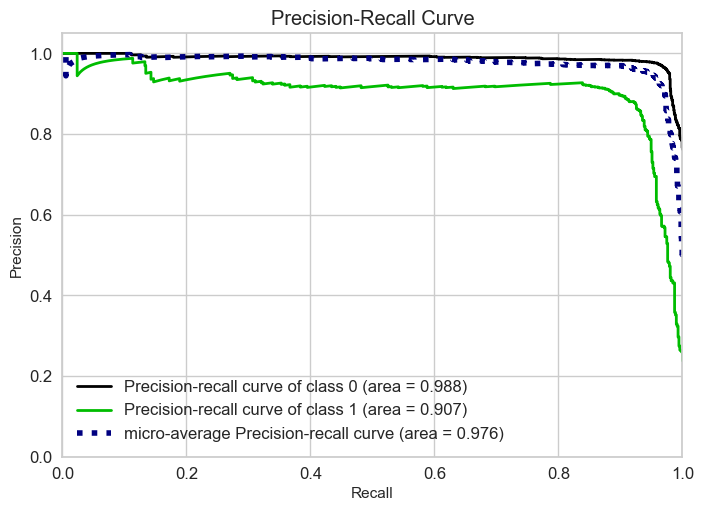

In [130]:
from scikitplot.metrics import plot_roc, plot_precision_recall



operations = [("Ordinal_Encoder", column_trans),
             ("svc", SVC(random_state=seed,
                         class_weight='balanced',
                         C= 10,
                         degree= 3, 
                         gamma= 'scale',
                         kernel= 'poly',
                        probability=True))]


my_pipline_2 = Pipeline(steps=operations).set_output(transform="pandas")

my_pipline_2.fit(X_train, y_train)

# Get the predicted probabilities for the test data
y_proba = my_pipline_2.predict_proba(X_test)
plot_precision_recall(y_test, y_proba)
plt.show();



In [131]:
eval_metric(my_pipline_2, X_train, y_train, X_test, y_test)

Test_Set
[[2132  154]
 [  43  671]]
              precision    recall  f1-score   support

           0       0.98      0.93      0.96      2286
           1       0.81      0.94      0.87       714

    accuracy                           0.93      3000
   macro avg       0.90      0.94      0.91      3000
weighted avg       0.94      0.93      0.94      3000


Train_Set
[[8690  452]
 [ 168 2689]]
              precision    recall  f1-score   support

           0       0.98      0.95      0.97      9142
           1       0.86      0.94      0.90      2857

    accuracy                           0.95     11999
   macro avg       0.92      0.95      0.93     11999
weighted avg       0.95      0.95      0.95     11999



In [132]:
# the model results for later comparison
from sklearn.metrics import average_precision_score

y_pred = my_pipline_2.predict(X_test)
y_pred_proba = my_pipline_2.predict_proba(X_test)
# y_test_dummies = pd.get_dummies(y_test)
  # 0 (the 0ve review class)

rec_svm = recall_score(y_test, y_pred, labels = [1], average = None)
f1_svm = f1_score(y_test, y_pred, labels = [1], average = None)
AP_svm = average_precision_score(y_test, y_pred_proba[:, 1], pos_label=1)
# AP_svm = average_precision_score(y_test_dummies[1], y_pred_proba[:, 0])

In [133]:
print(rec_svm, f1_svm, AP_svm)

[0.93977591] [0.8719948] 0.9071682357079847


In [134]:
# save the pipeline with the model
import pickle
pickle.dump(my_pipline_2, open('SVM', 'wb'))

#### Random Forest
For RF since it is a tree-based algorithm, we will use Ordinal encoding for **ALL** categorical features

#### Random Forest

##### Vanilla RF

In [135]:
X_train

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,Departments,salary
9355,0.70,0.66,4,168,3,0,0,technical,low
8808,0.33,0.95,4,280,3,0,0,accounting,medium
11737,0.69,0.66,3,215,6,0,0,sales,high
8741,0.50,0.67,2,142,3,0,0,technical,low
2143,0.88,0.68,5,157,4,1,0,marketing,medium
...,...,...,...,...,...,...,...,...,...
7920,0.50,0.65,5,285,6,0,0,management,high
8142,0.90,0.74,3,260,2,0,0,support,medium
11178,0.61,0.96,3,214,2,0,0,IT,medium
14877,0.84,1.00,5,242,5,0,0,sales,low


In [136]:
cat_features = X_train.select_dtypes("object").columns
cat_features 

Index(['Departments', 'salary'], dtype='object')

In [137]:
ord_enc = OrdinalEncoder()
trans_ord = make_column_transformer((ord_enc, cat_features), remainder='passthrough', verbose_feature_names_out=False).set_output(transform="pandas")


In [138]:
X_train.Departments

9355      technical
8808     accounting
11737         sales
8741      technical
2143      marketing
            ...    
7920     management
8142        support
11178            IT
14877         sales
6111     management
Name: Departments, Length: 11999, dtype: object

### RF Model without class weight

In [139]:
from sklearn.ensemble import RandomForestClassifier


# trans_ord = make_column_transformer(
#                         (OrdinalEncoder(handle_unknown="use_encoded_value", unknown_value=-1), cat_features ),
#                             remainder="passthrough", verbose_feature_names_out=False)

# trans_ord = trans_ord.set_output(transform="pandas")

operations = [('Ordinal', trans_ord), ('rf', RandomForestClassifier(random_state=seed))]

rf_m = Pipeline(steps=operations).set_output(transform="pandas")

rf_m.fit(X_train, y_train)


Pipeline(steps=[('Ordinal',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ordinalencoder',
                                                  OrdinalEncoder(),
                                                  Index(['Departments', 'salary'], dtype='object'))],
                                   verbose_feature_names_out=False)),
                ('rf', RandomForestClassifier(random_state=101))])

In [140]:
eval_metric(rf_m, X_train, y_train, X_test, y_test)

Test_Set
[[2281    5]
 [  23  691]]
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2286
           1       0.99      0.97      0.98       714

    accuracy                           0.99      3000
   macro avg       0.99      0.98      0.99      3000
weighted avg       0.99      0.99      0.99      3000


Train_Set
[[9142    0]
 [   0 2857]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      9142
           1       1.00      1.00      1.00      2857

    accuracy                           1.00     11999
   macro avg       1.00      1.00      1.00     11999
weighted avg       1.00      1.00      1.00     11999



##### Cross Validation RF

In [141]:
operations = [('Ordinal', trans_ord), ('rf', RandomForestClassifier(random_state=seed))]

CV_RF  = Pipeline(steps=operations).set_output(transform="pandas")


scores = cross_validate(
    CV_RF, X_train, y_train, scoring=scoring, cv=10, return_train_score=True
)
df_scores = pd.DataFrame(scores, index=range(1, 11))
df_scores.mean()

fit_time                 0.841318
score_time               0.031779
test_f1_churn            0.982804
train_f1_churn           1.000000
test_precision_churn     0.994276
train_precision_churn    1.000000
test_recall_churn        0.971651
train_recall_churn       1.000000
dtype: float64

##### Grid/Random Search RF

In [142]:
param_grid = {'rf__n_estimators':[50, 64, 128, 100, 128],
             'rf__max_features':[2, 4, 'sqrt'],
             'rf__max_depth':[3, 5, 7, 8],
             'rf__min_samples_split':[2, 3, 4],
             'rf__min_samples_leaf': [2, 3, 4],
#            'rf__class_weight': [None, 'balanced', {0: 1, 1: 2}]
              
             #'RF_model__max_samples':[0.4, 0.8 , 1]
             }

operations = [('Ordinal', trans_ord), ('rf', RandomForestClassifier(random_state=seed))]

GS_RF2 = Pipeline(steps=operations)

grid_model_RF2 = GridSearchCV(estimator=GS_RF2, param_grid= param_grid, scoring=recall_churn, cv=10, n_jobs=-1, return_train_score=True)

grid_model_RF2.fit(X_train, y_train)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('Ordinal',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('ordinalencoder',
                                                                         OrdinalEncoder(),
                                                                         Index(['Departments', 'salary'], dtype='object'))],
                                                          verbose_feature_names_out=False)),
                                       ('rf',
                                        RandomForestClassifier(random_state=101))]),
             n_jobs=-1,
             param_grid={'rf__max_depth': [3, 5, 7, 8],
                         'rf__max_features': [2, 4, 'sqrt'],
                         'rf__min_samples_leaf': [2, 3, 4],
                         'rf__min_samples_split': [2, 3, 4],
                         'rf__n_estimators': [50, 64, 128, 100, 128]},
             return_train_score=True,
             scoring=make_scorer(recall_score, average=None, labels=[1]))

In [143]:
eval_metric(grid_model_RF2, X_train, y_train, X_test, y_test)

Test_Set
[[2279    7]
 [  45  669]]
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      2286
           1       0.99      0.94      0.96       714

    accuracy                           0.98      3000
   macro avg       0.99      0.97      0.98      3000
weighted avg       0.98      0.98      0.98      3000


Train_Set
[[9122   20]
 [ 209 2648]]
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      9142
           1       0.99      0.93      0.96      2857

    accuracy                           0.98     11999
   macro avg       0.99      0.96      0.97     11999
weighted avg       0.98      0.98      0.98     11999



In [144]:
grid_model_RF2.best_params_

{'rf__max_depth': 8,
 'rf__max_features': 4,
 'rf__min_samples_leaf': 2,
 'rf__min_samples_split': 2,
 'rf__n_estimators': 100}

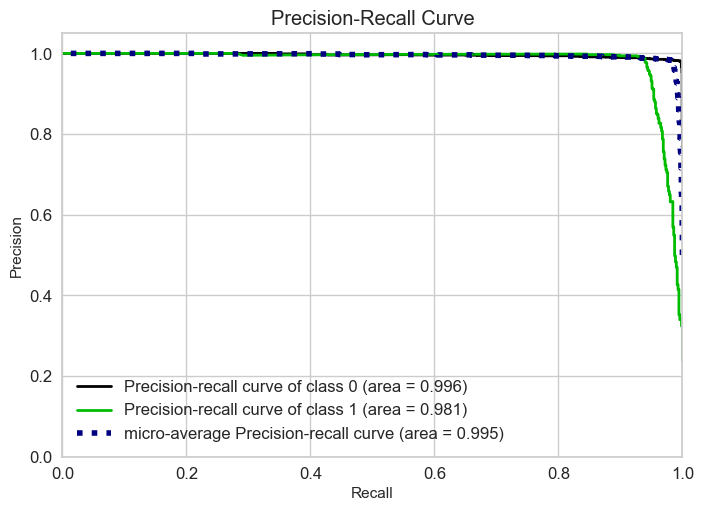

In [145]:
#Creating the model with the values of best params we got it from the grid search, and then creat the graph to see the result
operations = [('Ordinal', trans_ord), ('rf', RandomForestClassifier(random_state=seed, max_depth=8, max_features=4,  min_samples_leaf=2, min_samples_split=2, n_estimators=100))]


rf_pipline_3 = Pipeline(steps=operations).set_output(transform="pandas")

rf_pipline_3.fit(X_train, y_train)

# Get the predicted probabilities for the test data
y_proba = rf_pipline_3.predict_proba(X_test)
plot_precision_recall(y_test, y_proba)
plt.show();

In [146]:
# the model results for later comparison
from sklearn.metrics import average_precision_score

y_pred = rf_pipline_3.predict(X_test)
y_pred_proba = rf_pipline_3.predict_proba(X_test)
# y_test_dummies = pd.get_dummies(y_test)

rec_rf = recall_score(y_test, y_pred, labels = [1], average = None)
f1_rf = f1_score(y_test, y_pred, labels = [1], average = None)
# AP_svm = average_precision_score(y_test_dummies[1], y_pred_proba[:, 0])
# y_pred_proba[:, 0]
AP_rf = average_precision_score(y_test, y_pred_proba[:, 1], pos_label=1)


In [147]:
#Seeing the result
print(rec_rf, f1_rf, AP_rf)

[0.93697479] [0.96258993] 0.9811969866978556


In [148]:
# save the pipeline with the model
import pickle
pickle.dump(rf_pipline_3, open('RF_model', 'wb'))

### RF Model with class weight

In [149]:
from sklearn.ensemble import RandomForestClassifier


# trans_ord = make_column_transformer(
#                         (OrdinalEncoder(handle_unknown="use_encoded_value", unknown_value=-1), cat_features ),
#                             remainder="passthrough", verbose_feature_names_out=False)

# trans_ord = trans_ord.set_output(transform="pandas")

operations = [('Ordinal', trans_ord), ('rf', RandomForestClassifier(random_state=seed, class_weight='balanced'))]

rf_m_b = Pipeline(steps=operations).set_output(transform="pandas")

rf_m_b.fit(X_train, y_train)


Pipeline(steps=[('Ordinal',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ordinalencoder',
                                                  OrdinalEncoder(),
                                                  Index(['Departments', 'salary'], dtype='object'))],
                                   verbose_feature_names_out=False)),
                ('rf',
                 RandomForestClassifier(class_weight='balanced',
                                        random_state=101))])

In [150]:
eval_metric(rf_m_b, X_train, y_train, X_test, y_test)

Test_Set
[[2282    4]
 [  23  691]]
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2286
           1       0.99      0.97      0.98       714

    accuracy                           0.99      3000
   macro avg       0.99      0.98      0.99      3000
weighted avg       0.99      0.99      0.99      3000


Train_Set
[[9142    0]
 [   0 2857]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      9142
           1       1.00      1.00      1.00      2857

    accuracy                           1.00     11999
   macro avg       1.00      1.00      1.00     11999
weighted avg       1.00      1.00      1.00     11999



##### Cross Validation RF

In [151]:
operations = [('Ordinal', trans_ord), ('rf', RandomForestClassifier(random_state=seed, class_weight='balanced'))]

CV_RF_b  = Pipeline(steps=operations).set_output(transform="pandas")


scores = cross_validate(
    CV_RF_b, X_train, y_train, scoring=scoring, cv=10, return_train_score=True
)
df_scores = pd.DataFrame(scores, index=range(1, 11))
df_scores.mean()

fit_time                 0.844156
score_time               0.032153
test_f1_churn            0.981714
train_f1_churn           1.000000
test_precision_churn     0.994276
train_precision_churn    1.000000
test_recall_churn        0.969549
train_recall_churn       1.000000
dtype: float64

##### Grid/Random Search RF

In [152]:
param_grid = {'rf__n_estimators':[50, 64, 128, 100, 128],
             'rf__max_features':[2, 4, 'sqrt'],
             'rf__max_depth':[3, 5, 7, 8],
             'rf__min_samples_split':[2, 3, 4],
             'rf__min_samples_leaf': [2, 3, 4],
             'rf__class_weight': [None, 'balanced', {0: 1, 1: 2}]
              
             #'RF_model__max_samples':[0.4, 0.8 , 1]
             }

operations = [('Ordinal', trans_ord), ('rf', RandomForestClassifier(random_state=seed, class_weight='balanced'))]

GS_RF_b = Pipeline(steps=operations)

grid_model_RF_b = GridSearchCV(estimator=GS_RF_b, param_grid= param_grid, scoring=recall_churn, cv=10, n_jobs=-1, return_train_score=True)

grid_model_RF_b.fit(X_train, y_train)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('Ordinal',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('ordinalencoder',
                                                                         OrdinalEncoder(),
                                                                         Index(['Departments', 'salary'], dtype='object'))],
                                                          verbose_feature_names_out=False)),
                                       ('rf',
                                        RandomForestClassifier(class_weight='balanced',
                                                               random_state=101))]),
             n_jobs=-1,
             param_grid={'rf__class_weight': [None, 'balanced', {0: 1, 1: 2}],
                         'rf__max_depth': [3, 5, 7, 8],
                         'rf__max_features': [2, 4, 'sqrt'],
                         'rf__min_samples_leaf': [2, 3, 4],
                         'rf__min_samples_split': [2, 3, 4],
                         'rf__n_estimators': [50, 64, 128, 100, 128]},
             return_train_score=True,
             scoring=make_scorer(recall_score, average=None, labels=[1]))

In [153]:
eval_metric(grid_model_RF_b, X_train, y_train, X_test, y_test)

Test_Set
[[2112  174]
 [  30  684]]
              precision    recall  f1-score   support

           0       0.99      0.92      0.95      2286
           1       0.80      0.96      0.87       714

    accuracy                           0.93      3000
   macro avg       0.89      0.94      0.91      3000
weighted avg       0.94      0.93      0.93      3000


Train_Set
[[8427  715]
 [ 184 2673]]
              precision    recall  f1-score   support

           0       0.98      0.92      0.95      9142
           1       0.79      0.94      0.86      2857

    accuracy                           0.93     11999
   macro avg       0.88      0.93      0.90     11999
weighted avg       0.93      0.93      0.93     11999



In [154]:
grid_model_RF_b.best_params_

{'rf__class_weight': 'balanced',
 'rf__max_depth': 3,
 'rf__max_features': 'sqrt',
 'rf__min_samples_leaf': 4,
 'rf__min_samples_split': 2,
 'rf__n_estimators': 50}

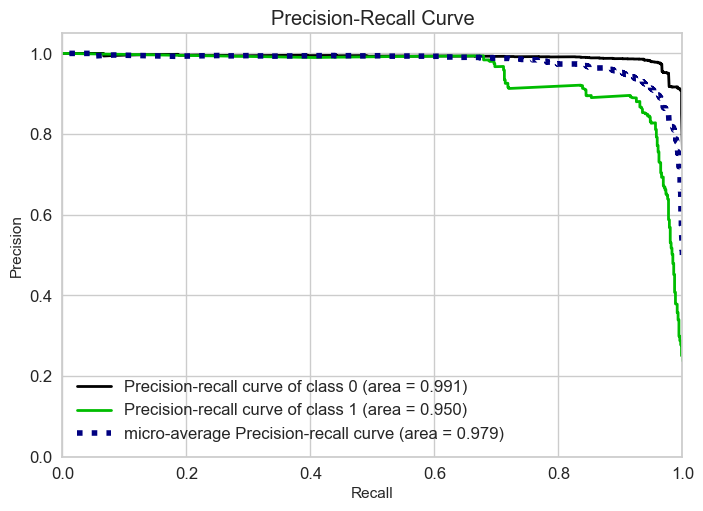

In [155]:
#Creating the model with the values of best params we got it from the grid search, and then creat the graph to see the result
operations = [('Ordinal', trans_ord), ('rf', RandomForestClassifier(random_state=seed, max_depth=3, max_features='sqrt',  min_samples_leaf=4, min_samples_split=2, n_estimators=50, class_weight='balanced'))]


rf_pipline_ba = Pipeline(steps=operations).set_output(transform="pandas")

rf_pipline_ba.fit(X_train, y_train)

# Get the predicted probabilities for the test data
y_proba = rf_pipline_ba.predict_proba(X_test)
plot_precision_recall(y_test, y_proba)
plt.show();

In [156]:
# the model results for later comparison
from sklearn.metrics import average_precision_score

y_pred = rf_pipline_ba.predict(X_test)
y_pred_proba = rf_pipline_ba.predict_proba(X_test)
# y_test_dummies = pd.get_dummies(y_test)

rec_rf_b = recall_score(y_test, y_pred, labels = [1], average = None)
f1_rf_b = f1_score(y_test, y_pred, labels = [1], average = None)
# AP_svm = average_precision_score(y_test_dummies[1], y_pred_proba[:, 0])
# y_pred_proba[:, 0]
AP_rf_b = average_precision_score(y_test, y_pred_proba[:, 1], pos_label=1)


In [158]:
# save the pipeline with the model
import pickle
pickle.dump(rf_pipline_ba, open('RF_model', 'wb'))

#### XGBoost

For XGboost, since it is a tree-based algorithm, we will use ordinal encoding for **ALL** categorical features

##### Vanilla XGB

### XG without class weight

In [159]:
from xgboost import XGBClassifier
#Creating the operation of xg boost
operations = [('Ordinal', trans_ord), ('xgb', XGBClassifier(random_state=seed ))]

#Creating the pipeline of xg
pipe_model_xg = Pipeline(steps=operations).set_output(transform="pandas")
#Fitting the model with the train data
pipe_model_xg.fit(X_train, y_train)



Pipeline(steps=[('Ordinal',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ordinalencoder',
                                                  OrdinalEncoder(),
                                                  Index(['Departments', 'salary'], dtype='object'))],
                                   verbose_feature_names_out=False)),
                ('xgb',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_ro...
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, n_estimators=100,
                               n_jobs=None, num_parallel_tree=None,
                               predictor=None, random_state=101, ...))])

In [160]:
#Seeing the evaluation of the xg model 
eval_metric(pipe_model_xg, X_train, y_train, X_test, y_test)
#From here we can see that the results are good, and no huge difference between the train and test data

Test_Set
[[2275   11]
 [  25  689]]
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2286
           1       0.98      0.96      0.97       714

    accuracy                           0.99      3000
   macro avg       0.99      0.98      0.98      3000
weighted avg       0.99      0.99      0.99      3000


Train_Set
[[9135    7]
 [  28 2829]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      9142
           1       1.00      0.99      0.99      2857

    accuracy                           1.00     11999
   macro avg       1.00      0.99      1.00     11999
weighted avg       1.00      1.00      1.00     11999



##### Cross Validation XGB

In [161]:
#Creating the cross validation of xg
operations = [('Ordinal', trans_ord), ('xgb', XGBClassifier(random_state=seed ))]

CV_XGB  = Pipeline(steps=operations).set_output(transform="pandas")


scores = cross_validate(
    CV_XGB, X_train, y_train, scoring=scoring, cv=10, return_train_score=True
)
df_scores = pd.DataFrame(scores, index=range(1, 11))
df_scores.mean()

fit_time                 0.289432
score_time               0.011768
test_f1_churn            0.976036
train_f1_churn           0.994694
test_precision_churn     0.983132
train_precision_churn    0.997770
test_recall_churn        0.969199
train_recall_churn       0.991638
dtype: float64

##### Grid/Random Search XGB

In [162]:
param_grid = {
    "xgb__n_estimators":np.arange(3,201, step=1),           # Integer
    "xgb__max_depth":np.arange(3,11, step=1),               # Integer
    "xgb__learning_rate": np.arange(0.001,3, step=0.05),    # float
    "xgb__subsample":np.arange(0.5,1, step=0.1),            # float
    "xgb__colsample_bytree": np.arange(0.3, 1, step=0.05),  # float
    "xgb__reg_alpha": np.arange(0, 1, step=0.1),            # float
    "xgb__gamma": np.arange(0, 11,step=0.5),                # float
}

operations = [('Ordinal', trans_ord), ('xgb', XGBClassifier(random_state=seed ))]

pipeline_XGB = Pipeline(steps=operations)

# Create the random search object
random_search_XGB = RandomizedSearchCV(
    estimator=pipeline_XGB,
    param_distributions=param_grid,
    n_iter=200,
    cv=5,
    verbose=2,
    return_train_score=True,
    scoring=recall_churn
)

random_search_XGB.fit(X_train, y_train)





Fitting 5 folds for each of 200 candidates, totalling 1000 fits
[CV] END xgb__colsample_bytree=0.95, xgb__gamma=2.5, xgb__learning_rate=0.9510000000000001, xgb__max_depth=8, xgb__n_estimators=81, xgb__reg_alpha=0.6000000000000001, xgb__subsample=0.7999999999999999; total time=   0.2s
[CV] END xgb__colsample_bytree=0.95, xgb__gamma=2.5, xgb__learning_rate=0.9510000000000001, xgb__max_depth=8, xgb__n_estimators=81, xgb__reg_alpha=0.6000000000000001, xgb__subsample=0.7999999999999999; total time=   0.3s
[CV] END xgb__colsample_bytree=0.95, xgb__gamma=2.5, xgb__learning_rate=0.9510000000000001, xgb__max_depth=8, xgb__n_estimators=81, xgb__reg_alpha=0.6000000000000001, xgb__subsample=0.7999999999999999; total time=   0.3s
[CV] END xgb__colsample_bytree=0.95, xgb__gamma=2.5, xgb__learning_rate=0.9510000000000001, xgb__max_depth=8, xgb__n_estimators=81, xgb__reg_alpha=0.6000000000000001, xgb__subsample=0.7999999999999999; total time=   0.2s
[CV] END xgb__colsample_bytree=0.95, xgb__gamma=2.5,

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('Ordinal',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('ordinalencoder',
                                                                               OrdinalEncoder(),
                                                                               Index(['Departments', 'salary'], dtype='object'))],
                                                                verbose_feature_names_out=False)),
                                             ('xgb',
                                              XGBClassifier(base_score=None,
                                                            booster=None,
                                                            callbacks=None,
                                                            colsample_bylevel=None,
                                                            colsample_bynode=None,
                                                            colsa...
       159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171,
       172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184,
       185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197,
       198, 199, 200]),
                                        'xgb__reg_alpha': array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
                                        'xgb__subsample': array([0.5, 0.6, 0.7, 0.8, 0.9])},
                   return_train_score=True,
                   scoring=make_scorer(recall_score, average=None, labels=[1]),
                   verbose=2)

[CV] END xgb__colsample_bytree=0.7499999999999999, xgb__gamma=4.5, xgb__learning_rate=2.9010000000000002, xgb__max_depth=4, xgb__n_estimators=195, xgb__reg_alpha=0.0, xgb__subsample=0.7; total time=   0.2s
[CV] END xgb__colsample_bytree=0.7499999999999999, xgb__gamma=4.5, xgb__learning_rate=2.9010000000000002, xgb__max_depth=4, xgb__n_estimators=195, xgb__reg_alpha=0.0, xgb__subsample=0.7; total time=   0.2s
[CV] END xgb__colsample_bytree=0.7999999999999998, xgb__gamma=2.5, xgb__learning_rate=0.9510000000000001, xgb__max_depth=6, xgb__n_estimators=149, xgb__reg_alpha=0.2, xgb__subsample=0.7; total time=   0.1s
[CV] END xgb__colsample_bytree=0.7999999999999998, xgb__gamma=2.5, xgb__learning_rate=0.9510000000000001, xgb__max_depth=6, xgb__n_estimators=149, xgb__reg_alpha=0.2, xgb__subsample=0.7; total time=   0.1s
[CV] END xgb__colsample_bytree=0.7999999999999998, xgb__gamma=2.5, xgb__learning_rate=0.9510000000000001, xgb__max_depth=6, xgb__n_estimators=149, xgb__reg_alpha=0.2, xgb__subs

[CV] END xgb__colsample_bytree=0.6499999999999999, xgb__gamma=5.0, xgb__learning_rate=2.9010000000000002, xgb__max_depth=6, xgb__n_estimators=136, xgb__reg_alpha=0.4, xgb__subsample=0.7; total time=   0.2s
[CV] END xgb__colsample_bytree=0.6499999999999999, xgb__gamma=5.0, xgb__learning_rate=2.9010000000000002, xgb__max_depth=6, xgb__n_estimators=136, xgb__reg_alpha=0.4, xgb__subsample=0.7; total time=   0.2s
[CV] END xgb__colsample_bytree=0.7499999999999999, xgb__gamma=9.5, xgb__learning_rate=0.901, xgb__max_depth=4, xgb__n_estimators=183, xgb__reg_alpha=0.5, xgb__subsample=0.8999999999999999; total time=   0.1s
[CV] END xgb__colsample_bytree=0.7499999999999999, xgb__gamma=9.5, xgb__learning_rate=0.901, xgb__max_depth=4, xgb__n_estimators=183, xgb__reg_alpha=0.5, xgb__subsample=0.8999999999999999; total time=   0.1s
[CV] END xgb__colsample_bytree=0.7499999999999999, xgb__gamma=9.5, xgb__learning_rate=0.901, xgb__max_depth=4, xgb__n_estimators=183, xgb__reg_alpha=0.5, xgb__subsample=0.8

[CV] END xgb__colsample_bytree=0.35, xgb__gamma=3.5, xgb__learning_rate=1.501, xgb__max_depth=5, xgb__n_estimators=16, xgb__reg_alpha=0.0, xgb__subsample=0.6; total time=   0.0s
[CV] END xgb__colsample_bytree=0.35, xgb__gamma=3.5, xgb__learning_rate=1.501, xgb__max_depth=5, xgb__n_estimators=16, xgb__reg_alpha=0.0, xgb__subsample=0.6; total time=   0.0s
[CV] END xgb__colsample_bytree=0.35, xgb__gamma=3.5, xgb__learning_rate=1.501, xgb__max_depth=5, xgb__n_estimators=16, xgb__reg_alpha=0.0, xgb__subsample=0.6; total time=   0.0s
[CV] END xgb__colsample_bytree=0.35, xgb__gamma=5.5, xgb__learning_rate=2.9010000000000002, xgb__max_depth=7, xgb__n_estimators=73, xgb__reg_alpha=0.6000000000000001, xgb__subsample=0.8999999999999999; total time=   0.0s
[CV] END xgb__colsample_bytree=0.35, xgb__gamma=5.5, xgb__learning_rate=2.9010000000000002, xgb__max_depth=7, xgb__n_estimators=73, xgb__reg_alpha=0.6000000000000001, xgb__subsample=0.8999999999999999; total time=   0.0s
[CV] END xgb__colsample_

[CV] END xgb__colsample_bytree=0.35, xgb__gamma=2.0, xgb__learning_rate=1.901, xgb__max_depth=7, xgb__n_estimators=181, xgb__reg_alpha=0.6000000000000001, xgb__subsample=0.7999999999999999; total time=   0.2s
[CV] END xgb__colsample_bytree=0.35, xgb__gamma=2.0, xgb__learning_rate=1.901, xgb__max_depth=7, xgb__n_estimators=181, xgb__reg_alpha=0.6000000000000001, xgb__subsample=0.7999999999999999; total time=   0.3s
[CV] END xgb__colsample_bytree=0.39999999999999997, xgb__gamma=9.0, xgb__learning_rate=1.501, xgb__max_depth=7, xgb__n_estimators=78, xgb__reg_alpha=0.2, xgb__subsample=0.6; total time=   0.1s
[CV] END xgb__colsample_bytree=0.39999999999999997, xgb__gamma=9.0, xgb__learning_rate=1.501, xgb__max_depth=7, xgb__n_estimators=78, xgb__reg_alpha=0.2, xgb__subsample=0.6; total time=   0.1s
[CV] END xgb__colsample_bytree=0.39999999999999997, xgb__gamma=9.0, xgb__learning_rate=1.501, xgb__max_depth=7, xgb__n_estimators=78, xgb__reg_alpha=0.2, xgb__subsample=0.6; total time=   0.0s
[CV

[CV] END xgb__colsample_bytree=0.44999999999999996, xgb__gamma=2.5, xgb__learning_rate=0.001, xgb__max_depth=5, xgb__n_estimators=129, xgb__reg_alpha=0.2, xgb__subsample=0.7999999999999999; total time=   0.2s
[CV] END xgb__colsample_bytree=0.8999999999999999, xgb__gamma=8.0, xgb__learning_rate=0.551, xgb__max_depth=9, xgb__n_estimators=119, xgb__reg_alpha=0.9, xgb__subsample=0.7999999999999999; total time=   0.1s
[CV] END xgb__colsample_bytree=0.8999999999999999, xgb__gamma=8.0, xgb__learning_rate=0.551, xgb__max_depth=9, xgb__n_estimators=119, xgb__reg_alpha=0.9, xgb__subsample=0.7999999999999999; total time=   0.1s
[CV] END xgb__colsample_bytree=0.8999999999999999, xgb__gamma=8.0, xgb__learning_rate=0.551, xgb__max_depth=9, xgb__n_estimators=119, xgb__reg_alpha=0.9, xgb__subsample=0.7999999999999999; total time=   0.1s
[CV] END xgb__colsample_bytree=0.8999999999999999, xgb__gamma=8.0, xgb__learning_rate=0.551, xgb__max_depth=9, xgb__n_estimators=119, xgb__reg_alpha=0.9, xgb__subsampl

[CV] END xgb__colsample_bytree=0.7999999999999998, xgb__gamma=9.0, xgb__learning_rate=2.101, xgb__max_depth=7, xgb__n_estimators=12, xgb__reg_alpha=0.6000000000000001, xgb__subsample=0.7; total time=   0.0s
[CV] END xgb__colsample_bytree=0.7999999999999998, xgb__gamma=9.0, xgb__learning_rate=2.101, xgb__max_depth=7, xgb__n_estimators=12, xgb__reg_alpha=0.6000000000000001, xgb__subsample=0.7; total time=   0.0s
[CV] END xgb__colsample_bytree=0.7999999999999998, xgb__gamma=9.0, xgb__learning_rate=2.101, xgb__max_depth=7, xgb__n_estimators=12, xgb__reg_alpha=0.6000000000000001, xgb__subsample=0.7; total time=   0.0s
[CV] END xgb__colsample_bytree=0.7999999999999998, xgb__gamma=9.0, xgb__learning_rate=2.101, xgb__max_depth=7, xgb__n_estimators=12, xgb__reg_alpha=0.6000000000000001, xgb__subsample=0.7; total time=   0.0s
[CV] END xgb__colsample_bytree=0.7999999999999998, xgb__gamma=9.0, xgb__learning_rate=2.101, xgb__max_depth=7, xgb__n_estimators=12, xgb__reg_alpha=0.6000000000000001, xgb_

[CV] END xgb__colsample_bytree=0.35, xgb__gamma=3.5, xgb__learning_rate=1.701, xgb__max_depth=3, xgb__n_estimators=166, xgb__reg_alpha=0.30000000000000004, xgb__subsample=0.7; total time=   0.2s
[CV] END xgb__colsample_bytree=0.35, xgb__gamma=3.5, xgb__learning_rate=1.701, xgb__max_depth=3, xgb__n_estimators=166, xgb__reg_alpha=0.30000000000000004, xgb__subsample=0.7; total time=   0.2s
[CV] END xgb__colsample_bytree=0.35, xgb__gamma=3.5, xgb__learning_rate=1.701, xgb__max_depth=3, xgb__n_estimators=166, xgb__reg_alpha=0.30000000000000004, xgb__subsample=0.7; total time=   0.2s
[CV] END xgb__colsample_bytree=0.39999999999999997, xgb__gamma=9.5, xgb__learning_rate=0.9510000000000001, xgb__max_depth=3, xgb__n_estimators=157, xgb__reg_alpha=0.0, xgb__subsample=0.7999999999999999; total time=   0.1s
[CV] END xgb__colsample_bytree=0.39999999999999997, xgb__gamma=9.5, xgb__learning_rate=0.9510000000000001, xgb__max_depth=3, xgb__n_estimators=157, xgb__reg_alpha=0.0, xgb__subsample=0.79999999

[CV] END xgb__colsample_bytree=0.8999999999999999, xgb__gamma=2.5, xgb__learning_rate=2.001, xgb__max_depth=7, xgb__n_estimators=63, xgb__reg_alpha=0.1, xgb__subsample=0.7999999999999999; total time=   0.2s
[CV] END xgb__colsample_bytree=0.8999999999999999, xgb__gamma=2.5, xgb__learning_rate=2.001, xgb__max_depth=7, xgb__n_estimators=63, xgb__reg_alpha=0.1, xgb__subsample=0.7999999999999999; total time=   0.1s
[CV] END xgb__colsample_bytree=0.7, xgb__gamma=5.5, xgb__learning_rate=2.4010000000000002, xgb__max_depth=8, xgb__n_estimators=171, xgb__reg_alpha=0.5, xgb__subsample=0.6; total time=   0.2s
[CV] END xgb__colsample_bytree=0.7, xgb__gamma=5.5, xgb__learning_rate=2.4010000000000002, xgb__max_depth=8, xgb__n_estimators=171, xgb__reg_alpha=0.5, xgb__subsample=0.6; total time=   0.1s
[CV] END xgb__colsample_bytree=0.7, xgb__gamma=5.5, xgb__learning_rate=2.4010000000000002, xgb__max_depth=8, xgb__n_estimators=171, xgb__reg_alpha=0.5, xgb__subsample=0.6; total time=   0.2s
[CV] END xgb_

[CV] END xgb__colsample_bytree=0.7999999999999998, xgb__gamma=0.5, xgb__learning_rate=2.051, xgb__max_depth=9, xgb__n_estimators=87, xgb__reg_alpha=0.7000000000000001, xgb__subsample=0.7999999999999999; total time=   0.1s
[CV] END xgb__colsample_bytree=0.7999999999999998, xgb__gamma=0.5, xgb__learning_rate=2.051, xgb__max_depth=9, xgb__n_estimators=87, xgb__reg_alpha=0.7000000000000001, xgb__subsample=0.7999999999999999; total time=   0.1s
[CV] END xgb__colsample_bytree=0.7999999999999998, xgb__gamma=0.5, xgb__learning_rate=2.051, xgb__max_depth=9, xgb__n_estimators=87, xgb__reg_alpha=0.7000000000000001, xgb__subsample=0.7999999999999999; total time=   0.1s
[CV] END xgb__colsample_bytree=0.7999999999999998, xgb__gamma=0.5, xgb__learning_rate=2.051, xgb__max_depth=9, xgb__n_estimators=87, xgb__reg_alpha=0.7000000000000001, xgb__subsample=0.7999999999999999; total time=   0.1s
[CV] END xgb__colsample_bytree=0.7999999999999998, xgb__gamma=0.5, xgb__learning_rate=2.051, xgb__max_depth=9, x

[CV] END xgb__colsample_bytree=0.5999999999999999, xgb__gamma=10.0, xgb__learning_rate=1.551, xgb__max_depth=10, xgb__n_estimators=197, xgb__reg_alpha=0.4, xgb__subsample=0.7; total time=   0.2s
[CV] END xgb__colsample_bytree=0.5999999999999999, xgb__gamma=10.0, xgb__learning_rate=1.551, xgb__max_depth=10, xgb__n_estimators=197, xgb__reg_alpha=0.4, xgb__subsample=0.7; total time=   0.2s
[CV] END xgb__colsample_bytree=0.5999999999999999, xgb__gamma=10.0, xgb__learning_rate=1.551, xgb__max_depth=10, xgb__n_estimators=197, xgb__reg_alpha=0.4, xgb__subsample=0.7; total time=   0.1s
[CV] END xgb__colsample_bytree=0.5999999999999999, xgb__gamma=10.0, xgb__learning_rate=1.551, xgb__max_depth=10, xgb__n_estimators=197, xgb__reg_alpha=0.4, xgb__subsample=0.7; total time=   0.1s
[CV] END xgb__colsample_bytree=0.39999999999999997, xgb__gamma=9.5, xgb__learning_rate=0.801, xgb__max_depth=6, xgb__n_estimators=154, xgb__reg_alpha=0.6000000000000001, xgb__subsample=0.7999999999999999; total time=   0

[CV] END xgb__colsample_bytree=0.8999999999999999, xgb__gamma=7.0, xgb__learning_rate=2.701, xgb__max_depth=6, xgb__n_estimators=133, xgb__reg_alpha=0.4, xgb__subsample=0.6; total time=   0.2s
[CV] END xgb__colsample_bytree=0.8999999999999999, xgb__gamma=7.0, xgb__learning_rate=2.701, xgb__max_depth=6, xgb__n_estimators=133, xgb__reg_alpha=0.4, xgb__subsample=0.6; total time=   0.2s
[CV] END xgb__colsample_bytree=0.8999999999999999, xgb__gamma=7.0, xgb__learning_rate=2.701, xgb__max_depth=6, xgb__n_estimators=133, xgb__reg_alpha=0.4, xgb__subsample=0.6; total time=   0.1s
[CV] END xgb__colsample_bytree=0.5499999999999999, xgb__gamma=7.0, xgb__learning_rate=1.551, xgb__max_depth=10, xgb__n_estimators=10, xgb__reg_alpha=0.9, xgb__subsample=0.7; total time=   0.0s
[CV] END xgb__colsample_bytree=0.5499999999999999, xgb__gamma=7.0, xgb__learning_rate=1.551, xgb__max_depth=10, xgb__n_estimators=10, xgb__reg_alpha=0.9, xgb__subsample=0.7; total time=   0.0s
[CV] END xgb__colsample_bytree=0.54

[CV] END xgb__colsample_bytree=0.39999999999999997, xgb__gamma=2.5, xgb__learning_rate=0.901, xgb__max_depth=4, xgb__n_estimators=137, xgb__reg_alpha=0.7000000000000001, xgb__subsample=0.7; total time=   0.1s
[CV] END xgb__colsample_bytree=0.39999999999999997, xgb__gamma=2.5, xgb__learning_rate=0.901, xgb__max_depth=4, xgb__n_estimators=137, xgb__reg_alpha=0.7000000000000001, xgb__subsample=0.7; total time=   0.1s
[CV] END xgb__colsample_bytree=0.7999999999999998, xgb__gamma=4.0, xgb__learning_rate=2.801, xgb__max_depth=9, xgb__n_estimators=37, xgb__reg_alpha=0.1, xgb__subsample=0.5; total time=   0.0s
[CV] END xgb__colsample_bytree=0.7999999999999998, xgb__gamma=4.0, xgb__learning_rate=2.801, xgb__max_depth=9, xgb__n_estimators=37, xgb__reg_alpha=0.1, xgb__subsample=0.5; total time=   0.0s
[CV] END xgb__colsample_bytree=0.7999999999999998, xgb__gamma=4.0, xgb__learning_rate=2.801, xgb__max_depth=9, xgb__n_estimators=37, xgb__reg_alpha=0.1, xgb__subsample=0.5; total time=   0.0s
[CV] E

[CV] END xgb__colsample_bytree=0.5499999999999999, xgb__gamma=1.5, xgb__learning_rate=0.801, xgb__max_depth=4, xgb__n_estimators=135, xgb__reg_alpha=0.5, xgb__subsample=0.7; total time=   0.1s
[CV] END xgb__colsample_bytree=0.49999999999999994, xgb__gamma=10.0, xgb__learning_rate=0.451, xgb__max_depth=3, xgb__n_estimators=53, xgb__reg_alpha=0.0, xgb__subsample=0.5; total time=   0.0s
[CV] END xgb__colsample_bytree=0.49999999999999994, xgb__gamma=10.0, xgb__learning_rate=0.451, xgb__max_depth=3, xgb__n_estimators=53, xgb__reg_alpha=0.0, xgb__subsample=0.5; total time=   0.0s
[CV] END xgb__colsample_bytree=0.49999999999999994, xgb__gamma=10.0, xgb__learning_rate=0.451, xgb__max_depth=3, xgb__n_estimators=53, xgb__reg_alpha=0.0, xgb__subsample=0.5; total time=   0.0s
[CV] END xgb__colsample_bytree=0.49999999999999994, xgb__gamma=10.0, xgb__learning_rate=0.451, xgb__max_depth=3, xgb__n_estimators=53, xgb__reg_alpha=0.0, xgb__subsample=0.5; total time=   0.0s
[CV] END xgb__colsample_bytree=

[CV] END xgb__colsample_bytree=0.5499999999999999, xgb__gamma=6.0, xgb__learning_rate=0.8510000000000001, xgb__max_depth=6, xgb__n_estimators=190, xgb__reg_alpha=0.8, xgb__subsample=0.5; total time=   0.1s
[CV] END xgb__colsample_bytree=0.5499999999999999, xgb__gamma=6.0, xgb__learning_rate=0.8510000000000001, xgb__max_depth=6, xgb__n_estimators=190, xgb__reg_alpha=0.8, xgb__subsample=0.5; total time=   0.1s
[CV] END xgb__colsample_bytree=0.5499999999999999, xgb__gamma=6.0, xgb__learning_rate=0.8510000000000001, xgb__max_depth=6, xgb__n_estimators=190, xgb__reg_alpha=0.8, xgb__subsample=0.5; total time=   0.1s
[CV] END xgb__colsample_bytree=0.5499999999999999, xgb__gamma=6.0, xgb__learning_rate=0.8510000000000001, xgb__max_depth=6, xgb__n_estimators=190, xgb__reg_alpha=0.8, xgb__subsample=0.5; total time=   0.2s
[CV] END xgb__colsample_bytree=0.5499999999999999, xgb__gamma=6.0, xgb__learning_rate=0.8510000000000001, xgb__max_depth=6, xgb__n_estimators=190, xgb__reg_alpha=0.8, xgb__subs

[CV] END xgb__colsample_bytree=0.35, xgb__gamma=7.0, xgb__learning_rate=0.401, xgb__max_depth=6, xgb__n_estimators=52, xgb__reg_alpha=0.7000000000000001, xgb__subsample=0.7; total time=   0.0s
[CV] END xgb__colsample_bytree=0.35, xgb__gamma=7.0, xgb__learning_rate=0.401, xgb__max_depth=6, xgb__n_estimators=52, xgb__reg_alpha=0.7000000000000001, xgb__subsample=0.7; total time=   0.0s
[CV] END xgb__colsample_bytree=0.35, xgb__gamma=7.0, xgb__learning_rate=0.401, xgb__max_depth=6, xgb__n_estimators=52, xgb__reg_alpha=0.7000000000000001, xgb__subsample=0.7; total time=   0.0s
[CV] END xgb__colsample_bytree=0.35, xgb__gamma=7.0, xgb__learning_rate=0.401, xgb__max_depth=6, xgb__n_estimators=52, xgb__reg_alpha=0.7000000000000001, xgb__subsample=0.7; total time=   0.1s
[CV] END xgb__colsample_bytree=0.44999999999999996, xgb__gamma=4.5, xgb__learning_rate=1.501, xgb__max_depth=5, xgb__n_estimators=123, xgb__reg_alpha=0.6000000000000001, xgb__subsample=0.5; total time=   0.2s
[CV] END xgb__colsa

[CV] END xgb__colsample_bytree=0.5499999999999999, xgb__gamma=2.5, xgb__learning_rate=2.951, xgb__max_depth=8, xgb__n_estimators=155, xgb__reg_alpha=0.5, xgb__subsample=0.7; total time=   0.3s
[CV] END xgb__colsample_bytree=0.5499999999999999, xgb__gamma=2.5, xgb__learning_rate=2.951, xgb__max_depth=8, xgb__n_estimators=155, xgb__reg_alpha=0.5, xgb__subsample=0.7; total time=   0.2s
[CV] END xgb__colsample_bytree=0.35, xgb__gamma=5.0, xgb__learning_rate=0.801, xgb__max_depth=3, xgb__n_estimators=63, xgb__reg_alpha=0.30000000000000004, xgb__subsample=0.7; total time=   0.0s
[CV] END xgb__colsample_bytree=0.35, xgb__gamma=5.0, xgb__learning_rate=0.801, xgb__max_depth=3, xgb__n_estimators=63, xgb__reg_alpha=0.30000000000000004, xgb__subsample=0.7; total time=   0.0s
[CV] END xgb__colsample_bytree=0.35, xgb__gamma=5.0, xgb__learning_rate=0.801, xgb__max_depth=3, xgb__n_estimators=63, xgb__reg_alpha=0.30000000000000004, xgb__subsample=0.7; total time=   0.0s
[CV] END xgb__colsample_bytree=0

[CV] END xgb__colsample_bytree=0.7, xgb__gamma=4.5, xgb__learning_rate=2.051, xgb__max_depth=10, xgb__n_estimators=81, xgb__reg_alpha=0.4, xgb__subsample=0.8999999999999999; total time=   0.2s
[CV] END xgb__colsample_bytree=0.49999999999999994, xgb__gamma=4.5, xgb__learning_rate=0.35100000000000003, xgb__max_depth=4, xgb__n_estimators=189, xgb__reg_alpha=0.1, xgb__subsample=0.8999999999999999; total time=   0.1s
[CV] END xgb__colsample_bytree=0.49999999999999994, xgb__gamma=4.5, xgb__learning_rate=0.35100000000000003, xgb__max_depth=4, xgb__n_estimators=189, xgb__reg_alpha=0.1, xgb__subsample=0.8999999999999999; total time=   0.1s
[CV] END xgb__colsample_bytree=0.49999999999999994, xgb__gamma=4.5, xgb__learning_rate=0.35100000000000003, xgb__max_depth=4, xgb__n_estimators=189, xgb__reg_alpha=0.1, xgb__subsample=0.8999999999999999; total time=   0.2s
[CV] END xgb__colsample_bytree=0.49999999999999994, xgb__gamma=4.5, xgb__learning_rate=0.35100000000000003, xgb__max_depth=4, xgb__n_estim

[CV] END xgb__colsample_bytree=0.7499999999999999, xgb__gamma=7.5, xgb__learning_rate=0.9510000000000001, xgb__max_depth=7, xgb__n_estimators=118, xgb__reg_alpha=0.1, xgb__subsample=0.5; total time=   0.1s
[CV] END xgb__colsample_bytree=0.7499999999999999, xgb__gamma=7.5, xgb__learning_rate=0.9510000000000001, xgb__max_depth=7, xgb__n_estimators=118, xgb__reg_alpha=0.1, xgb__subsample=0.5; total time=   0.3s
[CV] END xgb__colsample_bytree=0.6499999999999999, xgb__gamma=9.5, xgb__learning_rate=2.101, xgb__max_depth=7, xgb__n_estimators=41, xgb__reg_alpha=0.30000000000000004, xgb__subsample=0.6; total time=   0.0s
[CV] END xgb__colsample_bytree=0.6499999999999999, xgb__gamma=9.5, xgb__learning_rate=2.101, xgb__max_depth=7, xgb__n_estimators=41, xgb__reg_alpha=0.30000000000000004, xgb__subsample=0.6; total time=   0.1s
[CV] END xgb__colsample_bytree=0.6499999999999999, xgb__gamma=9.5, xgb__learning_rate=2.101, xgb__max_depth=7, xgb__n_estimators=41, xgb__reg_alpha=0.30000000000000004, xgb

[CV] END xgb__colsample_bytree=0.8499999999999999, xgb__gamma=3.5, xgb__learning_rate=0.15100000000000002, xgb__max_depth=7, xgb__n_estimators=130, xgb__reg_alpha=0.8, xgb__subsample=0.7; total time=   0.1s
[CV] END xgb__colsample_bytree=0.8499999999999999, xgb__gamma=1.5, xgb__learning_rate=2.9010000000000002, xgb__max_depth=6, xgb__n_estimators=179, xgb__reg_alpha=0.0, xgb__subsample=0.6; total time=   0.2s
[CV] END xgb__colsample_bytree=0.8499999999999999, xgb__gamma=1.5, xgb__learning_rate=2.9010000000000002, xgb__max_depth=6, xgb__n_estimators=179, xgb__reg_alpha=0.0, xgb__subsample=0.6; total time=   0.2s
[CV] END xgb__colsample_bytree=0.8499999999999999, xgb__gamma=1.5, xgb__learning_rate=2.9010000000000002, xgb__max_depth=6, xgb__n_estimators=179, xgb__reg_alpha=0.0, xgb__subsample=0.6; total time=   0.3s
[CV] END xgb__colsample_bytree=0.8499999999999999, xgb__gamma=1.5, xgb__learning_rate=2.9010000000000002, xgb__max_depth=6, xgb__n_estimators=179, xgb__reg_alpha=0.0, xgb__sub

[CV] END xgb__colsample_bytree=0.8499999999999999, xgb__gamma=2.0, xgb__learning_rate=0.551, xgb__max_depth=6, xgb__n_estimators=60, xgb__reg_alpha=0.9, xgb__subsample=0.6; total time=   0.1s
[CV] END xgb__colsample_bytree=0.8499999999999999, xgb__gamma=2.0, xgb__learning_rate=0.551, xgb__max_depth=6, xgb__n_estimators=60, xgb__reg_alpha=0.9, xgb__subsample=0.6; total time=   0.1s
[CV] END xgb__colsample_bytree=0.8499999999999999, xgb__gamma=2.0, xgb__learning_rate=0.551, xgb__max_depth=6, xgb__n_estimators=60, xgb__reg_alpha=0.9, xgb__subsample=0.6; total time=   0.1s
[CV] END xgb__colsample_bytree=0.8499999999999999, xgb__gamma=2.0, xgb__learning_rate=0.551, xgb__max_depth=6, xgb__n_estimators=60, xgb__reg_alpha=0.9, xgb__subsample=0.6; total time=   0.0s
[CV] END xgb__colsample_bytree=0.5999999999999999, xgb__gamma=0.5, xgb__learning_rate=1.851, xgb__max_depth=9, xgb__n_estimators=22, xgb__reg_alpha=0.4, xgb__subsample=0.5; total time=   0.0s
[CV] END xgb__colsample_bytree=0.5999999

[CV] END xgb__colsample_bytree=0.95, xgb__gamma=3.5, xgb__learning_rate=2.151, xgb__max_depth=4, xgb__n_estimators=23, xgb__reg_alpha=0.2, xgb__subsample=0.5; total time=   0.0s
[CV] END xgb__colsample_bytree=0.95, xgb__gamma=3.5, xgb__learning_rate=2.151, xgb__max_depth=4, xgb__n_estimators=23, xgb__reg_alpha=0.2, xgb__subsample=0.5; total time=   0.0s
[CV] END xgb__colsample_bytree=0.95, xgb__gamma=3.5, xgb__learning_rate=2.151, xgb__max_depth=4, xgb__n_estimators=23, xgb__reg_alpha=0.2, xgb__subsample=0.5; total time=   0.0s
[CV] END xgb__colsample_bytree=0.8499999999999999, xgb__gamma=5.5, xgb__learning_rate=0.901, xgb__max_depth=7, xgb__n_estimators=96, xgb__reg_alpha=0.5, xgb__subsample=0.6; total time=   0.0s
[CV] END xgb__colsample_bytree=0.8499999999999999, xgb__gamma=5.5, xgb__learning_rate=0.901, xgb__max_depth=7, xgb__n_estimators=96, xgb__reg_alpha=0.5, xgb__subsample=0.6; total time=   0.0s
[CV] END xgb__colsample_bytree=0.8499999999999999, xgb__gamma=5.5, xgb__learning_r

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('Ordinal',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('ordinalencoder',
                                                                               OrdinalEncoder(),
                                                                               Index(['Departments', 'salary'], dtype='object'))],
                                                                verbose_feature_names_out=False)),
                                             ('xgb',
                                              XGBClassifier(base_score=None,
                                                            booster=None,
                                                            callbacks=None,
                                                            colsample_bylevel=None,
                                                            colsample_bynode=None,
                                                            colsa...
       159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171,
       172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184,
       185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197,
       198, 199, 200]),
                                        'xgb__reg_alpha': array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
                                        'xgb__subsample': array([0.5, 0.6, 0.7, 0.8, 0.9])},
                   return_train_score=True,
                   scoring=make_scorer(recall_score, average=None, labels=[1]),
                   verbose=2)

In [163]:
eval_metric(random_search_XGB, X_train, y_train, X_test, y_test)

Test_Set
[[2262   24]
 [  23  691]]
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2286
           1       0.97      0.97      0.97       714

    accuracy                           0.98      3000
   macro avg       0.98      0.98      0.98      3000
weighted avg       0.98      0.98      0.98      3000


Train_Set
[[9142    0]
 [   0 2857]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      9142
           1       1.00      1.00      1.00      2857

    accuracy                           1.00     11999
   macro avg       1.00      1.00      1.00     11999
weighted avg       1.00      1.00      1.00     11999



In [164]:
random_search_XGB.best_params_

{'xgb__subsample': 0.8999999999999999,
 'xgb__reg_alpha': 0.30000000000000004,
 'xgb__n_estimators': 86,
 'xgb__max_depth': 10,
 'xgb__learning_rate': 1.201,
 'xgb__gamma': 0.0,
 'xgb__colsample_bytree': 0.35}

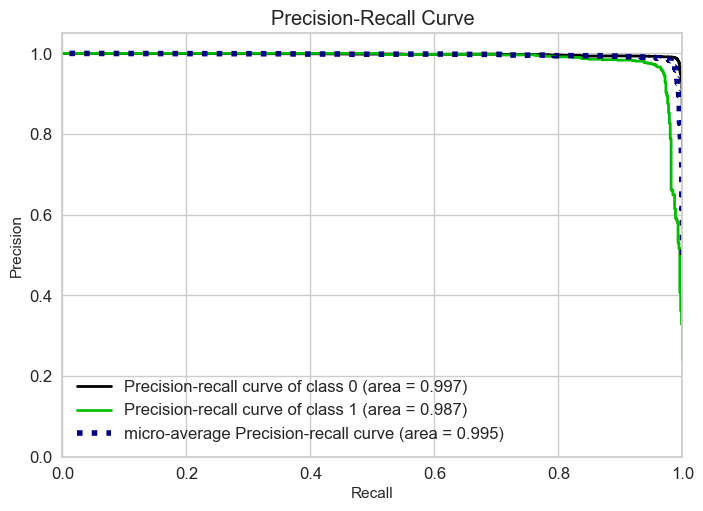

In [165]:
#Now, let's see the graph of it

#We will create the model of xg with the best params and graph the result
operations = [('Ordinal', trans_ord), ('xgb', XGBClassifier(random_state=seed, subsample= 0.7, reg_alpha=0.1, n_estimators=102, max_depth=8, learning_rate=1.701, gamma=0.0, colsample_bytree=0.49999999999999994))]


xg_model = Pipeline(steps=operations).set_output(transform="pandas")

xg_model.fit(X_train, y_train)

# Get the predicted probabilities for the test data
y_proba = xg_model.predict_proba(X_test)
plot_precision_recall(y_test, y_proba)
plt.show();

In [166]:
# the model results for later comparison
from sklearn.metrics import average_precision_score

y_pred = xg_model.predict(X_test)
y_pred_proba = xg_model.predict_proba(X_test)
# y_test_dummies = pd.get_dummies(y_test)

rec_xg = recall_score(y_test, y_pred, labels = [1], average = None)
f1_xg = f1_score(y_test, y_pred, labels = [1], average = None)
AP_xg = average_precision_score(y_test, y_pred_proba[:, 1], pos_label=1)
# AP_svm = average_precision_score(y_test_dummies[1], y_pred_proba[:, 0])

In [167]:
#Seeing the result
print(rec_xg, f1_xg, AP_xg)

[0.96918768] [0.96244784] 0.9865661846507325


In [168]:
# save the pipeline with the model
import pickle
pickle.dump(xg_model, open('xg_model', 'wb'))

### XG with class weight

In [169]:
from xgboost import XGBClassifier
#Creating the operation of xg boost
operations = [('Ordinal', trans_ord), ('xgb', XGBClassifier(random_state=seed, class_weight='balanced' ))]

#Creating the pipeline of xg
pipe_model_xgb = Pipeline(steps=operations).set_output(transform="pandas")
#Fitting the model with the train data
pipe_model_xgb.fit(X_train, y_train)



[08:37:55] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-08de971ced8a8cdc6-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "class_weight" } are not used.



Pipeline(steps=[('Ordinal',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ordinalencoder',
                                                  OrdinalEncoder(),
                                                  Index(['Departments', 'salary'], dtype='object'))],
                                   verbose_feature_names_out=False)),
                ('xgb',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               class_weight='balanced', colsample_bylevel=None,
                               colsample_bynode=None, colsample_bytre...
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, n_estimators=100,
                               n_jobs=None, num_parallel_tree=None,
                               predictor=None, ...))])

In [170]:
#Seeing the evaluation of the xg model 
eval_metric(pipe_model_xgb, X_train, y_train, X_test, y_test)
#From here we can see that the results are good, and no huge difference between the train and test data

Test_Set
[[2275   11]
 [  25  689]]
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2286
           1       0.98      0.96      0.97       714

    accuracy                           0.99      3000
   macro avg       0.99      0.98      0.98      3000
weighted avg       0.99      0.99      0.99      3000


Train_Set
[[9135    7]
 [  28 2829]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      9142
           1       1.00      0.99      0.99      2857

    accuracy                           1.00     11999
   macro avg       1.00      0.99      1.00     11999
weighted avg       1.00      1.00      1.00     11999



##### Cross Validation XGB

In [171]:
#Creating the cross validation of xg
operations = [('Ordinal', trans_ord), ('xgb', XGBClassifier(random_state=seed, class_weight='balanced' ))]

CV_XGB_b  = Pipeline(steps=operations).set_output(transform="pandas")


scores = cross_validate(
    CV_XGB_b, X_train, y_train, scoring=scoring, cv=10, return_train_score=True
)
df_scores = pd.DataFrame(scores, index=range(1, 11))
df_scores.mean()

[08:37:56] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-08de971ced8a8cdc6-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "class_weight" } are not used.

[08:37:56] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-08de971ced8a8cdc6-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "class_weight" } are not used.

[08:37:56] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-08de971ced8a8cdc6-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "class_weight" } are not used.

[08:37:57] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-08de971ced8a8cdc6-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "class_weight" } are not used.

[08:37:57] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-08de971ced8a8cdc6-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "class_weight" } are n

fit_time                 0.305590
score_time               0.012201
test_f1_churn            0.976036
train_f1_churn           0.994694
test_precision_churn     0.983132
train_precision_churn    0.997770
test_recall_churn        0.969199
train_recall_churn       0.991638
dtype: float64

##### Grid/Random Search XGB

In [172]:
param_grid = {
    "xgb__n_estimators":np.arange(3,201, step=1),           # Integer
    "xgb__max_depth":np.arange(3,11, step=1),               # Integer
    "xgb__learning_rate": np.arange(0.001,3, step=0.05),    # float
    "xgb__subsample":np.arange(0.5,1, step=0.1),            # float
    "xgb__colsample_bytree": np.arange(0.3, 1, step=0.05),  # float
    "xgb__reg_alpha": np.arange(0, 1, step=0.1),            # float
    "xgb__gamma": np.arange(0, 11,step=0.5),                # float
}

operations = [('Ordinal', trans_ord), ('xgb', XGBClassifier(random_state=seed, class_weight='balanced' ))]

pipeline_XGB_ba = Pipeline(steps=operations)

# Create the random search object
random_search_XGB_ba = RandomizedSearchCV(
    estimator=pipeline_XGB_ba,
    param_distributions=param_grid,
    n_iter=200,
    cv=5,
    verbose=2,
    return_train_score=True,
    scoring=recall_churn
)

random_search_XGB_ba.fit(X_train, y_train)





Fitting 5 folds for each of 200 candidates, totalling 1000 fits
[08:37:59] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-08de971ced8a8cdc6-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "class_weight" } are not used.

[CV] END xgb__colsample_bytree=0.8999999999999999, xgb__gamma=6.5, xgb__learning_rate=2.551, xgb__max_depth=9, xgb__n_estimators=179, xgb__reg_alpha=0.1, xgb__subsample=0.5; total time=   0.3s
[08:38:00] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-08de971ced8a8cdc6-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "class_weight" } are not used.

[CV] END xgb__colsample_bytree=0.8999999999999999, xgb__gamma=6.5, xgb__learning_rate=2.551, xgb__max_depth=9, xgb__n_estimators=179, xgb__reg_alpha=0.1, xgb__subsample=0.5; total time=   0.3s
[08:38:00] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-08de971ced8a8cdc6-1/xgboost/xgboost-ci-windows/src/learner

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('Ordinal',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('ordinalencoder',
                                                                               OrdinalEncoder(),
                                                                               Index(['Departments', 'salary'], dtype='object'))],
                                                                verbose_feature_names_out=False)),
                                             ('xgb',
                                              XGBClassifier(base_score=None,
                                                            booster=None,
                                                            callbacks=None,
                                                            class_weight='balanced',
                                                            colsample_bylevel=None,
                                                            col...
       159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171,
       172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184,
       185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197,
       198, 199, 200]),
                                        'xgb__reg_alpha': array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
                                        'xgb__subsample': array([0.5, 0.6, 0.7, 0.8, 0.9])},
                   return_train_score=True,
                   scoring=make_scorer(recall_score, average=None, labels=[1]),
                   verbose=2)

[CV] END xgb__colsample_bytree=0.49999999999999994, xgb__gamma=1.5, xgb__learning_rate=0.8510000000000001, xgb__max_depth=8, xgb__n_estimators=82, xgb__reg_alpha=0.5, xgb__subsample=0.8999999999999999; total time=   0.0s
[CV] END xgb__colsample_bytree=0.49999999999999994, xgb__gamma=1.5, xgb__learning_rate=0.8510000000000001, xgb__max_depth=8, xgb__n_estimators=82, xgb__reg_alpha=0.5, xgb__subsample=0.8999999999999999; total time=   0.0s
[CV] END xgb__colsample_bytree=0.8999999999999999, xgb__gamma=7.5, xgb__learning_rate=1.501, xgb__max_depth=6, xgb__n_estimators=158, xgb__reg_alpha=0.9, xgb__subsample=0.7999999999999999; total time=   0.1s
[CV] END xgb__colsample_bytree=0.8999999999999999, xgb__gamma=7.5, xgb__learning_rate=1.501, xgb__max_depth=6, xgb__n_estimators=158, xgb__reg_alpha=0.9, xgb__subsample=0.7999999999999999; total time=   0.1s
[CV] END xgb__colsample_bytree=0.8999999999999999, xgb__gamma=7.5, xgb__learning_rate=1.501, xgb__max_depth=6, xgb__n_estimators=158, xgb__reg

[CV] END xgb__colsample_bytree=0.7499999999999999, xgb__gamma=8.5, xgb__learning_rate=2.551, xgb__max_depth=6, xgb__n_estimators=56, xgb__reg_alpha=0.2, xgb__subsample=0.5; total time=   0.0s
[CV] END xgb__colsample_bytree=0.7499999999999999, xgb__gamma=8.5, xgb__learning_rate=2.551, xgb__max_depth=6, xgb__n_estimators=56, xgb__reg_alpha=0.2, xgb__subsample=0.5; total time=   0.0s
[CV] END xgb__colsample_bytree=0.95, xgb__gamma=8.0, xgb__learning_rate=0.9510000000000001, xgb__max_depth=10, xgb__n_estimators=44, xgb__reg_alpha=0.9, xgb__subsample=0.7; total time=   0.0s
[CV] END xgb__colsample_bytree=0.95, xgb__gamma=8.0, xgb__learning_rate=0.9510000000000001, xgb__max_depth=10, xgb__n_estimators=44, xgb__reg_alpha=0.9, xgb__subsample=0.7; total time=   0.0s
[CV] END xgb__colsample_bytree=0.95, xgb__gamma=8.0, xgb__learning_rate=0.9510000000000001, xgb__max_depth=10, xgb__n_estimators=44, xgb__reg_alpha=0.9, xgb__subsample=0.7; total time=   0.0s
[CV] END xgb__colsample_bytree=0.95, xgb

[CV] END xgb__colsample_bytree=0.7499999999999999, xgb__gamma=2.5, xgb__learning_rate=2.501, xgb__max_depth=7, xgb__n_estimators=56, xgb__reg_alpha=0.30000000000000004, xgb__subsample=0.6; total time=   0.0s
[CV] END xgb__colsample_bytree=0.7499999999999999, xgb__gamma=2.5, xgb__learning_rate=2.501, xgb__max_depth=7, xgb__n_estimators=56, xgb__reg_alpha=0.30000000000000004, xgb__subsample=0.6; total time=   0.0s
[CV] END xgb__colsample_bytree=0.7499999999999999, xgb__gamma=2.5, xgb__learning_rate=2.501, xgb__max_depth=7, xgb__n_estimators=56, xgb__reg_alpha=0.30000000000000004, xgb__subsample=0.6; total time=   0.0s
[CV] END xgb__colsample_bytree=0.7499999999999999, xgb__gamma=2.5, xgb__learning_rate=2.501, xgb__max_depth=7, xgb__n_estimators=56, xgb__reg_alpha=0.30000000000000004, xgb__subsample=0.6; total time=   0.0s
[CV] END xgb__colsample_bytree=0.39999999999999997, xgb__gamma=10.5, xgb__learning_rate=2.951, xgb__max_depth=5, xgb__n_estimators=44, xgb__reg_alpha=0.4, xgb__subsampl

[CV] END xgb__colsample_bytree=0.7499999999999999, xgb__gamma=4.0, xgb__learning_rate=2.501, xgb__max_depth=5, xgb__n_estimators=16, xgb__reg_alpha=0.8, xgb__subsample=0.6; total time=   0.0s
[CV] END xgb__colsample_bytree=0.7499999999999999, xgb__gamma=4.0, xgb__learning_rate=2.501, xgb__max_depth=5, xgb__n_estimators=16, xgb__reg_alpha=0.8, xgb__subsample=0.6; total time=   0.0s
[CV] END xgb__colsample_bytree=0.7499999999999999, xgb__gamma=4.0, xgb__learning_rate=2.501, xgb__max_depth=5, xgb__n_estimators=16, xgb__reg_alpha=0.8, xgb__subsample=0.6; total time=   0.0s
[CV] END xgb__colsample_bytree=0.49999999999999994, xgb__gamma=10.5, xgb__learning_rate=1.351, xgb__max_depth=9, xgb__n_estimators=178, xgb__reg_alpha=0.6000000000000001, xgb__subsample=0.7999999999999999; total time=   0.1s
[CV] END xgb__colsample_bytree=0.49999999999999994, xgb__gamma=10.5, xgb__learning_rate=1.351, xgb__max_depth=9, xgb__n_estimators=178, xgb__reg_alpha=0.6000000000000001, xgb__subsample=0.79999999999

[CV] END xgb__colsample_bytree=0.39999999999999997, xgb__gamma=8.5, xgb__learning_rate=0.7010000000000001, xgb__max_depth=7, xgb__n_estimators=102, xgb__reg_alpha=0.0, xgb__subsample=0.7; total time=   0.0s
[CV] END xgb__colsample_bytree=0.5999999999999999, xgb__gamma=0.5, xgb__learning_rate=2.051, xgb__max_depth=10, xgb__n_estimators=187, xgb__reg_alpha=0.2, xgb__subsample=0.8999999999999999; total time=   0.2s
[CV] END xgb__colsample_bytree=0.5999999999999999, xgb__gamma=0.5, xgb__learning_rate=2.051, xgb__max_depth=10, xgb__n_estimators=187, xgb__reg_alpha=0.2, xgb__subsample=0.8999999999999999; total time=   0.2s
[CV] END xgb__colsample_bytree=0.5999999999999999, xgb__gamma=0.5, xgb__learning_rate=2.051, xgb__max_depth=10, xgb__n_estimators=187, xgb__reg_alpha=0.2, xgb__subsample=0.8999999999999999; total time=   0.1s
[CV] END xgb__colsample_bytree=0.5999999999999999, xgb__gamma=0.5, xgb__learning_rate=2.051, xgb__max_depth=10, xgb__n_estimators=187, xgb__reg_alpha=0.2, xgb__subsam

[CV] END xgb__colsample_bytree=0.5499999999999999, xgb__gamma=1.0, xgb__learning_rate=1.651, xgb__max_depth=6, xgb__n_estimators=114, xgb__reg_alpha=0.5, xgb__subsample=0.6; total time=   0.1s
[CV] END xgb__colsample_bytree=0.5499999999999999, xgb__gamma=1.0, xgb__learning_rate=1.651, xgb__max_depth=6, xgb__n_estimators=114, xgb__reg_alpha=0.5, xgb__subsample=0.6; total time=   0.1s
[CV] END xgb__colsample_bytree=0.5499999999999999, xgb__gamma=1.0, xgb__learning_rate=1.651, xgb__max_depth=6, xgb__n_estimators=114, xgb__reg_alpha=0.5, xgb__subsample=0.6; total time=   0.1s
[CV] END xgb__colsample_bytree=0.5499999999999999, xgb__gamma=1.0, xgb__learning_rate=1.651, xgb__max_depth=6, xgb__n_estimators=114, xgb__reg_alpha=0.5, xgb__subsample=0.6; total time=   0.1s
[CV] END xgb__colsample_bytree=0.5499999999999999, xgb__gamma=1.0, xgb__learning_rate=1.651, xgb__max_depth=6, xgb__n_estimators=114, xgb__reg_alpha=0.5, xgb__subsample=0.6; total time=   0.1s
[CV] END xgb__colsample_bytree=0.39

[CV] END xgb__colsample_bytree=0.35, xgb__gamma=5.5, xgb__learning_rate=2.301, xgb__max_depth=4, xgb__n_estimators=39, xgb__reg_alpha=0.6000000000000001, xgb__subsample=0.6; total time=   0.0s
[CV] END xgb__colsample_bytree=0.35, xgb__gamma=5.5, xgb__learning_rate=2.301, xgb__max_depth=4, xgb__n_estimators=39, xgb__reg_alpha=0.6000000000000001, xgb__subsample=0.6; total time=   0.0s
[CV] END xgb__colsample_bytree=0.35, xgb__gamma=5.5, xgb__learning_rate=2.301, xgb__max_depth=4, xgb__n_estimators=39, xgb__reg_alpha=0.6000000000000001, xgb__subsample=0.6; total time=   0.0s
[CV] END xgb__colsample_bytree=0.35, xgb__gamma=5.5, xgb__learning_rate=2.301, xgb__max_depth=4, xgb__n_estimators=39, xgb__reg_alpha=0.6000000000000001, xgb__subsample=0.6; total time=   0.0s
[CV] END xgb__colsample_bytree=0.35, xgb__gamma=3.5, xgb__learning_rate=0.251, xgb__max_depth=4, xgb__n_estimators=59, xgb__reg_alpha=0.8, xgb__subsample=0.7999999999999999; total time=   0.0s
[CV] END xgb__colsample_bytree=0.35

[CV] END xgb__colsample_bytree=0.7499999999999999, xgb__gamma=10.0, xgb__learning_rate=0.30100000000000005, xgb__max_depth=10, xgb__n_estimators=142, xgb__reg_alpha=0.5, xgb__subsample=0.8999999999999999; total time=   0.1s
[CV] END xgb__colsample_bytree=0.7499999999999999, xgb__gamma=10.0, xgb__learning_rate=0.30100000000000005, xgb__max_depth=10, xgb__n_estimators=142, xgb__reg_alpha=0.5, xgb__subsample=0.8999999999999999; total time=   0.1s
[CV] END xgb__colsample_bytree=0.7999999999999998, xgb__gamma=10.0, xgb__learning_rate=2.301, xgb__max_depth=8, xgb__n_estimators=168, xgb__reg_alpha=0.5, xgb__subsample=0.6; total time=   0.2s
[CV] END xgb__colsample_bytree=0.7999999999999998, xgb__gamma=10.0, xgb__learning_rate=2.301, xgb__max_depth=8, xgb__n_estimators=168, xgb__reg_alpha=0.5, xgb__subsample=0.6; total time=   0.2s
[CV] END xgb__colsample_bytree=0.7999999999999998, xgb__gamma=10.0, xgb__learning_rate=2.301, xgb__max_depth=8, xgb__n_estimators=168, xgb__reg_alpha=0.5, xgb__subs

[CV] END xgb__colsample_bytree=0.8999999999999999, xgb__gamma=3.0, xgb__learning_rate=1.401, xgb__max_depth=6, xgb__n_estimators=139, xgb__reg_alpha=0.5, xgb__subsample=0.7999999999999999; total time=   0.1s
[CV] END xgb__colsample_bytree=0.7499999999999999, xgb__gamma=6.5, xgb__learning_rate=0.9510000000000001, xgb__max_depth=5, xgb__n_estimators=8, xgb__reg_alpha=0.4, xgb__subsample=0.6; total time=   0.0s
[CV] END xgb__colsample_bytree=0.7499999999999999, xgb__gamma=6.5, xgb__learning_rate=0.9510000000000001, xgb__max_depth=5, xgb__n_estimators=8, xgb__reg_alpha=0.4, xgb__subsample=0.6; total time=   0.0s
[CV] END xgb__colsample_bytree=0.7499999999999999, xgb__gamma=6.5, xgb__learning_rate=0.9510000000000001, xgb__max_depth=5, xgb__n_estimators=8, xgb__reg_alpha=0.4, xgb__subsample=0.6; total time=   0.0s
[CV] END xgb__colsample_bytree=0.7499999999999999, xgb__gamma=6.5, xgb__learning_rate=0.9510000000000001, xgb__max_depth=5, xgb__n_estimators=8, xgb__reg_alpha=0.4, xgb__subsample=

[CV] END xgb__colsample_bytree=0.5999999999999999, xgb__gamma=10.5, xgb__learning_rate=1.601, xgb__max_depth=8, xgb__n_estimators=50, xgb__reg_alpha=0.7000000000000001, xgb__subsample=0.8999999999999999; total time=   0.0s
[CV] END xgb__colsample_bytree=0.5999999999999999, xgb__gamma=10.5, xgb__learning_rate=1.601, xgb__max_depth=8, xgb__n_estimators=50, xgb__reg_alpha=0.7000000000000001, xgb__subsample=0.8999999999999999; total time=   0.0s
[CV] END xgb__colsample_bytree=0.5999999999999999, xgb__gamma=10.5, xgb__learning_rate=1.601, xgb__max_depth=8, xgb__n_estimators=50, xgb__reg_alpha=0.7000000000000001, xgb__subsample=0.8999999999999999; total time=   0.0s
[CV] END xgb__colsample_bytree=0.5999999999999999, xgb__gamma=10.5, xgb__learning_rate=1.601, xgb__max_depth=8, xgb__n_estimators=50, xgb__reg_alpha=0.7000000000000001, xgb__subsample=0.8999999999999999; total time=   0.0s
[CV] END xgb__colsample_bytree=0.5999999999999999, xgb__gamma=10.5, xgb__learning_rate=1.601, xgb__max_depth

[CV] END xgb__colsample_bytree=0.6499999999999999, xgb__gamma=9.5, xgb__learning_rate=1.301, xgb__max_depth=8, xgb__n_estimators=194, xgb__reg_alpha=0.2, xgb__subsample=0.5; total time=   0.1s
[CV] END xgb__colsample_bytree=0.6499999999999999, xgb__gamma=9.5, xgb__learning_rate=1.301, xgb__max_depth=8, xgb__n_estimators=194, xgb__reg_alpha=0.2, xgb__subsample=0.5; total time=   0.1s
[CV] END xgb__colsample_bytree=0.6499999999999999, xgb__gamma=9.5, xgb__learning_rate=1.301, xgb__max_depth=8, xgb__n_estimators=194, xgb__reg_alpha=0.2, xgb__subsample=0.5; total time=   0.1s
[CV] END xgb__colsample_bytree=0.95, xgb__gamma=1.0, xgb__learning_rate=2.301, xgb__max_depth=8, xgb__n_estimators=63, xgb__reg_alpha=0.8, xgb__subsample=0.8999999999999999; total time=   0.1s
[CV] END xgb__colsample_bytree=0.95, xgb__gamma=1.0, xgb__learning_rate=2.301, xgb__max_depth=8, xgb__n_estimators=63, xgb__reg_alpha=0.8, xgb__subsample=0.8999999999999999; total time=   0.0s
[CV] END xgb__colsample_bytree=0.95

[CV] END xgb__colsample_bytree=0.5499999999999999, xgb__gamma=4.5, xgb__learning_rate=1.951, xgb__max_depth=5, xgb__n_estimators=156, xgb__reg_alpha=0.4, xgb__subsample=0.7999999999999999; total time=   0.1s
[CV] END xgb__colsample_bytree=0.5499999999999999, xgb__gamma=4.5, xgb__learning_rate=1.951, xgb__max_depth=5, xgb__n_estimators=156, xgb__reg_alpha=0.4, xgb__subsample=0.7999999999999999; total time=   0.2s
[CV] END xgb__colsample_bytree=0.5999999999999999, xgb__gamma=0.5, xgb__learning_rate=2.801, xgb__max_depth=10, xgb__n_estimators=44, xgb__reg_alpha=0.2, xgb__subsample=0.5; total time=   0.0s
[CV] END xgb__colsample_bytree=0.5999999999999999, xgb__gamma=0.5, xgb__learning_rate=2.801, xgb__max_depth=10, xgb__n_estimators=44, xgb__reg_alpha=0.2, xgb__subsample=0.5; total time=   0.0s
[CV] END xgb__colsample_bytree=0.5999999999999999, xgb__gamma=0.5, xgb__learning_rate=2.801, xgb__max_depth=10, xgb__n_estimators=44, xgb__reg_alpha=0.2, xgb__subsample=0.5; total time=   0.0s
[CV] 

[CV] END xgb__colsample_bytree=0.44999999999999996, xgb__gamma=0.0, xgb__learning_rate=2.9010000000000002, xgb__max_depth=4, xgb__n_estimators=177, xgb__reg_alpha=0.8, xgb__subsample=0.7999999999999999; total time=   0.1s
[CV] END xgb__colsample_bytree=0.49999999999999994, xgb__gamma=1.0, xgb__learning_rate=0.001, xgb__max_depth=8, xgb__n_estimators=52, xgb__reg_alpha=0.30000000000000004, xgb__subsample=0.5; total time=   0.0s
[CV] END xgb__colsample_bytree=0.49999999999999994, xgb__gamma=1.0, xgb__learning_rate=0.001, xgb__max_depth=8, xgb__n_estimators=52, xgb__reg_alpha=0.30000000000000004, xgb__subsample=0.5; total time=   0.0s
[CV] END xgb__colsample_bytree=0.49999999999999994, xgb__gamma=1.0, xgb__learning_rate=0.001, xgb__max_depth=8, xgb__n_estimators=52, xgb__reg_alpha=0.30000000000000004, xgb__subsample=0.5; total time=   0.0s
[CV] END xgb__colsample_bytree=0.49999999999999994, xgb__gamma=1.0, xgb__learning_rate=0.001, xgb__max_depth=8, xgb__n_estimators=52, xgb__reg_alpha=0.

[CV] END xgb__colsample_bytree=0.49999999999999994, xgb__gamma=2.0, xgb__learning_rate=1.701, xgb__max_depth=4, xgb__n_estimators=54, xgb__reg_alpha=0.5, xgb__subsample=0.6; total time=   0.0s
[CV] END xgb__colsample_bytree=0.49999999999999994, xgb__gamma=2.0, xgb__learning_rate=1.701, xgb__max_depth=4, xgb__n_estimators=54, xgb__reg_alpha=0.5, xgb__subsample=0.6; total time=   0.0s
[CV] END xgb__colsample_bytree=0.49999999999999994, xgb__gamma=2.0, xgb__learning_rate=1.701, xgb__max_depth=4, xgb__n_estimators=54, xgb__reg_alpha=0.5, xgb__subsample=0.6; total time=   0.0s
[CV] END xgb__colsample_bytree=0.49999999999999994, xgb__gamma=4.0, xgb__learning_rate=2.601, xgb__max_depth=9, xgb__n_estimators=193, xgb__reg_alpha=0.2, xgb__subsample=0.6; total time=   0.2s
[CV] END xgb__colsample_bytree=0.49999999999999994, xgb__gamma=4.0, xgb__learning_rate=2.601, xgb__max_depth=9, xgb__n_estimators=193, xgb__reg_alpha=0.2, xgb__subsample=0.6; total time=   0.1s
[CV] END xgb__colsample_bytree=0.

[CV] END xgb__colsample_bytree=0.7, xgb__gamma=1.0, xgb__learning_rate=1.901, xgb__max_depth=10, xgb__n_estimators=36, xgb__reg_alpha=0.1, xgb__subsample=0.7999999999999999; total time=   0.0s
[CV] END xgb__colsample_bytree=0.7, xgb__gamma=1.0, xgb__learning_rate=1.901, xgb__max_depth=10, xgb__n_estimators=36, xgb__reg_alpha=0.1, xgb__subsample=0.7999999999999999; total time=   0.0s
[CV] END xgb__colsample_bytree=0.7, xgb__gamma=1.0, xgb__learning_rate=1.901, xgb__max_depth=10, xgb__n_estimators=36, xgb__reg_alpha=0.1, xgb__subsample=0.7999999999999999; total time=   0.0s
[CV] END xgb__colsample_bytree=0.7, xgb__gamma=1.0, xgb__learning_rate=1.901, xgb__max_depth=10, xgb__n_estimators=36, xgb__reg_alpha=0.1, xgb__subsample=0.7999999999999999; total time=   0.0s
[CV] END xgb__colsample_bytree=0.7, xgb__gamma=1.0, xgb__learning_rate=1.901, xgb__max_depth=10, xgb__n_estimators=36, xgb__reg_alpha=0.1, xgb__subsample=0.7999999999999999; total time=   0.0s
[CV] END xgb__colsample_bytree=0.59

[CV] END xgb__colsample_bytree=0.8499999999999999, xgb__gamma=1.5, xgb__learning_rate=1.601, xgb__max_depth=6, xgb__n_estimators=186, xgb__reg_alpha=0.7000000000000001, xgb__subsample=0.8999999999999999; total time=   0.1s
[CV] END xgb__colsample_bytree=0.8499999999999999, xgb__gamma=1.5, xgb__learning_rate=1.601, xgb__max_depth=6, xgb__n_estimators=186, xgb__reg_alpha=0.7000000000000001, xgb__subsample=0.8999999999999999; total time=   0.1s
[CV] END xgb__colsample_bytree=0.8499999999999999, xgb__gamma=1.5, xgb__learning_rate=1.601, xgb__max_depth=6, xgb__n_estimators=186, xgb__reg_alpha=0.7000000000000001, xgb__subsample=0.8999999999999999; total time=   0.1s
[CV] END xgb__colsample_bytree=0.7999999999999998, xgb__gamma=10.5, xgb__learning_rate=1.751, xgb__max_depth=3, xgb__n_estimators=35, xgb__reg_alpha=0.5, xgb__subsample=0.7; total time=   0.0s
[CV] END xgb__colsample_bytree=0.7999999999999998, xgb__gamma=10.5, xgb__learning_rate=1.751, xgb__max_depth=3, xgb__n_estimators=35, xgb_

[CV] END xgb__colsample_bytree=0.44999999999999996, xgb__gamma=9.0, xgb__learning_rate=1.601, xgb__max_depth=9, xgb__n_estimators=57, xgb__reg_alpha=0.9, xgb__subsample=0.7; total time=   0.0s
[CV] END xgb__colsample_bytree=0.3, xgb__gamma=6.0, xgb__learning_rate=1.051, xgb__max_depth=3, xgb__n_estimators=58, xgb__reg_alpha=0.30000000000000004, xgb__subsample=0.7999999999999999; total time=   0.0s
[CV] END xgb__colsample_bytree=0.3, xgb__gamma=6.0, xgb__learning_rate=1.051, xgb__max_depth=3, xgb__n_estimators=58, xgb__reg_alpha=0.30000000000000004, xgb__subsample=0.7999999999999999; total time=   0.0s
[CV] END xgb__colsample_bytree=0.3, xgb__gamma=6.0, xgb__learning_rate=1.051, xgb__max_depth=3, xgb__n_estimators=58, xgb__reg_alpha=0.30000000000000004, xgb__subsample=0.7999999999999999; total time=   0.0s
[CV] END xgb__colsample_bytree=0.3, xgb__gamma=6.0, xgb__learning_rate=1.051, xgb__max_depth=3, xgb__n_estimators=58, xgb__reg_alpha=0.30000000000000004, xgb__subsample=0.799999999999

[CV] END xgb__colsample_bytree=0.95, xgb__gamma=9.5, xgb__learning_rate=2.601, xgb__max_depth=6, xgb__n_estimators=93, xgb__reg_alpha=0.4, xgb__subsample=0.5; total time=   0.0s
[CV] END xgb__colsample_bytree=0.95, xgb__gamma=9.5, xgb__learning_rate=2.601, xgb__max_depth=6, xgb__n_estimators=93, xgb__reg_alpha=0.4, xgb__subsample=0.5; total time=   0.0s
[CV] END xgb__colsample_bytree=0.95, xgb__gamma=9.5, xgb__learning_rate=2.601, xgb__max_depth=6, xgb__n_estimators=93, xgb__reg_alpha=0.4, xgb__subsample=0.5; total time=   0.0s
[CV] END xgb__colsample_bytree=0.95, xgb__gamma=9.5, xgb__learning_rate=2.601, xgb__max_depth=6, xgb__n_estimators=93, xgb__reg_alpha=0.4, xgb__subsample=0.5; total time=   0.0s
[CV] END xgb__colsample_bytree=0.95, xgb__gamma=9.5, xgb__learning_rate=2.601, xgb__max_depth=6, xgb__n_estimators=93, xgb__reg_alpha=0.4, xgb__subsample=0.5; total time=   0.0s
[CV] END xgb__colsample_bytree=0.5499999999999999, xgb__gamma=5.0, xgb__learning_rate=1.401, xgb__max_depth=10

[CV] END xgb__colsample_bytree=0.3, xgb__gamma=6.5, xgb__learning_rate=2.551, xgb__max_depth=5, xgb__n_estimators=77, xgb__reg_alpha=0.8, xgb__subsample=0.7999999999999999; total time=   0.0s
[CV] END xgb__colsample_bytree=0.3, xgb__gamma=6.5, xgb__learning_rate=2.551, xgb__max_depth=5, xgb__n_estimators=77, xgb__reg_alpha=0.8, xgb__subsample=0.7999999999999999; total time=   0.0s
[CV] END xgb__colsample_bytree=0.3, xgb__gamma=6.5, xgb__learning_rate=2.551, xgb__max_depth=5, xgb__n_estimators=77, xgb__reg_alpha=0.8, xgb__subsample=0.7999999999999999; total time=   0.0s
[CV] END xgb__colsample_bytree=0.3, xgb__gamma=6.5, xgb__learning_rate=2.551, xgb__max_depth=5, xgb__n_estimators=77, xgb__reg_alpha=0.8, xgb__subsample=0.7999999999999999; total time=   0.0s
[CV] END xgb__colsample_bytree=0.7499999999999999, xgb__gamma=2.5, xgb__learning_rate=2.951, xgb__max_depth=6, xgb__n_estimators=166, xgb__reg_alpha=0.30000000000000004, xgb__subsample=0.6; total time=   0.1s
[CV] END xgb__colsample

[CV] END xgb__colsample_bytree=0.8499999999999999, xgb__gamma=3.5, xgb__learning_rate=1.451, xgb__max_depth=10, xgb__n_estimators=73, xgb__reg_alpha=0.6000000000000001, xgb__subsample=0.6; total time=   0.0s
[CV] END xgb__colsample_bytree=0.8999999999999999, xgb__gamma=10.0, xgb__learning_rate=2.101, xgb__max_depth=7, xgb__n_estimators=77, xgb__reg_alpha=0.9, xgb__subsample=0.5; total time=   0.0s
[CV] END xgb__colsample_bytree=0.8999999999999999, xgb__gamma=10.0, xgb__learning_rate=2.101, xgb__max_depth=7, xgb__n_estimators=77, xgb__reg_alpha=0.9, xgb__subsample=0.5; total time=   0.1s
[CV] END xgb__colsample_bytree=0.8999999999999999, xgb__gamma=10.0, xgb__learning_rate=2.101, xgb__max_depth=7, xgb__n_estimators=77, xgb__reg_alpha=0.9, xgb__subsample=0.5; total time=   0.1s
[CV] END xgb__colsample_bytree=0.8999999999999999, xgb__gamma=10.0, xgb__learning_rate=2.101, xgb__max_depth=7, xgb__n_estimators=77, xgb__reg_alpha=0.9, xgb__subsample=0.5; total time=   0.1s
[CV] END xgb__colsam

[CV] END xgb__colsample_bytree=0.95, xgb__gamma=7.0, xgb__learning_rate=2.501, xgb__max_depth=7, xgb__n_estimators=176, xgb__reg_alpha=0.8, xgb__subsample=0.8999999999999999; total time=   0.1s
[CV] END xgb__colsample_bytree=0.95, xgb__gamma=7.0, xgb__learning_rate=2.501, xgb__max_depth=7, xgb__n_estimators=176, xgb__reg_alpha=0.8, xgb__subsample=0.8999999999999999; total time=   0.1s
[CV] END xgb__colsample_bytree=0.95, xgb__gamma=7.0, xgb__learning_rate=2.501, xgb__max_depth=7, xgb__n_estimators=176, xgb__reg_alpha=0.8, xgb__subsample=0.8999999999999999; total time=   0.1s
[CV] END xgb__colsample_bytree=0.95, xgb__gamma=7.0, xgb__learning_rate=2.501, xgb__max_depth=7, xgb__n_estimators=176, xgb__reg_alpha=0.8, xgb__subsample=0.8999999999999999; total time=   0.1s


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('Ordinal',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('ordinalencoder',
                                                                               OrdinalEncoder(),
                                                                               Index(['Departments', 'salary'], dtype='object'))],
                                                                verbose_feature_names_out=False)),
                                             ('xgb',
                                              XGBClassifier(base_score=None,
                                                            booster=None,
                                                            callbacks=None,
                                                            class_weight='balanced',
                                                            colsample_bylevel=None,
                                                            col...
       159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171,
       172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184,
       185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197,
       198, 199, 200]),
                                        'xgb__reg_alpha': array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
                                        'xgb__subsample': array([0.5, 0.6, 0.7, 0.8, 0.9])},
                   return_train_score=True,
                   scoring=make_scorer(recall_score, average=None, labels=[1]),
                   verbose=2)

In [173]:
eval_metric(random_search_XGB_ba, X_train, y_train, X_test, y_test)

Test_Set
[[2268   18]
 [  21  693]]
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2286
           1       0.97      0.97      0.97       714

    accuracy                           0.99      3000
   macro avg       0.98      0.98      0.98      3000
weighted avg       0.99      0.99      0.99      3000


Train_Set
[[9141    1]
 [   0 2857]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      9142
           1       1.00      1.00      1.00      2857

    accuracy                           1.00     11999
   macro avg       1.00      1.00      1.00     11999
weighted avg       1.00      1.00      1.00     11999



In [174]:
random_search_XGB_ba.best_params_

{'xgb__subsample': 0.7,
 'xgb__reg_alpha': 0.9,
 'xgb__n_estimators': 154,
 'xgb__max_depth': 9,
 'xgb__learning_rate': 1.301,
 'xgb__gamma': 0.0,
 'xgb__colsample_bytree': 0.5999999999999999}

[08:42:53] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-08de971ced8a8cdc6-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "class_weight" } are not used.



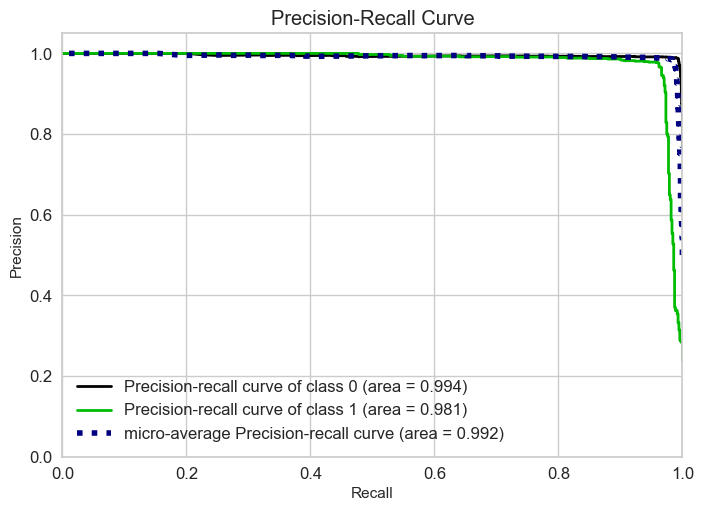

In [175]:
#Now, let's see the graph of it

#We will create the model of xg with the best params and graph the result
operations = [('Ordinal', trans_ord), ('xgb', XGBClassifier(random_state=seed, subsample= 0.89999999999999999, reg_alpha=0.2, n_estimators=56, max_depth=10, learning_rate=1.701, gamma=0.0, colsample_bytree=0.7, class_weight='balanced'))]


xg_model_ba = Pipeline(steps=operations).set_output(transform="pandas")

xg_model_ba.fit(X_train, y_train)

# Get the predicted probabilities for the test data
y_proba = xg_model_ba.predict_proba(X_test)
plot_precision_recall(y_test, y_proba)
plt.show();

In [176]:
# the model results for later comparison
from sklearn.metrics import average_precision_score

y_pred = xg_model_ba.predict(X_test)
y_pred_proba = xg_model_ba.predict_proba(X_test)
# y_test_dummies = pd.get_dummies(y_test)

rec_xg_ba = recall_score(y_test, y_pred, labels = [1], average = None)
f1_xg_ba = f1_score(y_test, y_pred, labels = [1], average = None)
AP_xg_ba = average_precision_score(y_test, y_pred_proba[:, 1], pos_label=1)
# AP_svm = average_precision_score(y_test_dummies[1], y_pred_proba[:, 0])

In [177]:
#Seeing the result
print(rec_xg_ba, f1_xg_ba, AP_xg_ba)

[0.96218487] [0.96556571] 0.9813734511364767


In [178]:
# save the pipeline with the model
import pickle
pickle.dump(xg_model_ba, open('xg_model_ba', 'wb'))

#### MLP

In [179]:
#splitting the data to valuation to use it in the dl model
X_train_v, X_val, y_train_v, y_val = train_test_split(X_train,
                                                  y_train,
                                                  stratify=y_train,
                                                  test_size=0.1,
                                                  random_state=seed)

In [180]:
#Seeing the shape of val and train after splitting
print(X_val.shape, y_val.shape)
print(X_train_v.shape, y_train_v.shape)

(1200, 9) (1200,)
(10799, 9) (10799,)


In [181]:
X_train_v.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,Departments,salary
13559,0.14,0.76,4,142,10,0,0,management,high
2316,0.60,0.98,3,262,2,0,0,accounting,low
416,0.82,1.00,4,229,6,0,0,hr,medium
14299,0.37,0.57,2,130,3,0,0,sales,low
9889,0.59,0.76,3,264,3,0,0,technical,medium


In [182]:
y_train_v

13559    0
2316     0
416      1
14299    1
9889     0
        ..
2797     0
8877     0
13874    0
12346    1
684      1
Name: left, Length: 10799, dtype: int64

In [183]:
X_val.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,Departments,salary
3487,0.14,0.46,2,267,6,1,0,support,low
11864,0.77,0.55,3,217,3,0,0,support,medium
550,0.11,0.96,6,298,4,0,0,sales,low
12301,0.12,1.00,3,278,4,0,0,RandD,medium
5466,1.00,0.93,3,264,4,0,0,support,medium


In [184]:
y_val

3487     0
11864    0
550      1
12301    1
5466     0
        ..
354      1
6824     0
12014    1
763      1
6485     0
Name: left, Length: 1200, dtype: int64

In [185]:
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, MinMaxScaler
#Creating OneHotEncoder and OrdinalEncoder to convert the objects
#In our data we have two objects (Departments, salary)
cat_onehot = ["Departments"]  
cat_ordinal =["salary"]

cat_for_salary = ["low", "medium", "high"]

column_trans = make_column_transformer(
                        (OneHotEncoder(handle_unknown="ignore", sparse=False), cat_onehot),
                        (OrdinalEncoder(categories= [cat_for_salary],
                                       handle_unknown="use_encoded_value",
                                        unknown_value=-1) ,cat_ordinal),
                         remainder= MinMaxScaler(),
                         verbose_feature_names_out=False)

column_trans=column_trans.set_output(transform="pandas")

In [186]:
from sklearn.pipeline import Pipeline
operations = [("OneHot_Ordinal_Encoder", column_trans)]

#Creating a pipeline to use it in fitting the oneHot and Ordinal
CA_pipe2 = Pipeline(steps=operations).set_output(transform="pandas")

In [187]:
X_train_v.shape

(10799, 9)

In [188]:
#Fitting and transforming the data of val and train
X_train_v = CA_pipe2.fit_transform(X_train_v)
X_val = CA_pipe2.transform(X_val)
X_test = CA_pipe2.transform(X_test)

In [189]:
X_train_v.shape

(10799, 18)

In [190]:
X_train_v.head()

,Departments_IT,Departments_RandD,Departments_accounting,Departments_hr,Departments_management,Departments_marketing,Departments_product_mng,Departments_sales,Departments_support,Departments_technical,salary,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years
13559,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,0.054945,0.625000,0.4,0.214953,1.000,0.0,0.0
2316,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.560440,0.968750,0.2,0.775701,0.000,0.0,0.0
416,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.802198,1.000000,0.4,0.621495,0.500,0.0,0.0
14299,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.307692,0.328125,0.0,0.158879,0.125,0.0,0.0
9889,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.549451,0.625000,0.2,0.785047,0.125,0.0,0.0


In [191]:
model_seq = Sequential()

model_seq.add(Dense(24, activation="relu"))
model_seq.add(Dense(16, activation="relu"))
model_seq.add(Dense(8, activation="relu"))
model_seq.add(Dense(1, activation="sigmoid"))

opt = Adam(learning_rate=0.001)
model_seq.compile(optimizer=opt,
              loss="binary_crossentropy",
              metrics=["Recall"])

In [192]:
early_stop = EarlyStopping(monitor="val_loss",
                           mode="min",
                           verbose=1,
                           patience=10,
                           restore_best_weights = True)

In [193]:
from sklearn.utils import class_weight

class_weights = class_weight.compute_class_weight('balanced',
                                                  classes=np.unique(y_train_v),
                                                  y=y_train_v)

class_weights = {0: class_weights[0], 1: class_weights[1]}
class_weights

{0: 0.6562348079727759, 1: 2.100155581485803}

In [229]:
#pip install livelossplot

In [195]:
from livelossplot import PlotLossesKerasTF

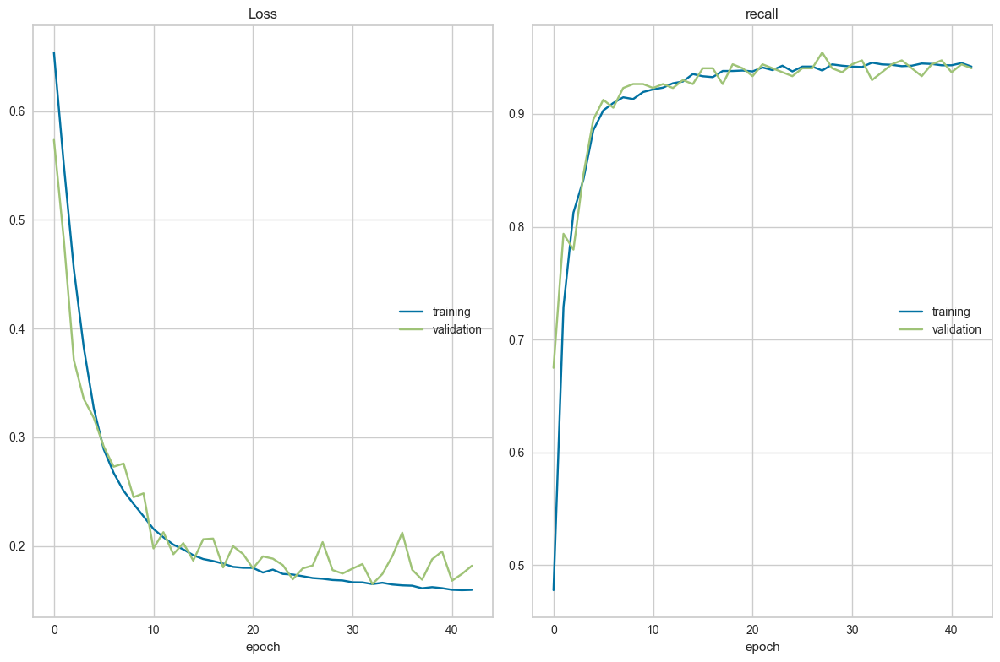

Loss
	training         	 (min:    0.159, max:    0.654, cur:    0.160)
	validation       	 (min:    0.165, max:    0.574, cur:    0.182)
recall
	training         	 (min:    0.478, max:    0.946, cur:    0.942)
	validation       	 (min:    0.675, max:    0.955, cur:    0.941)
85/85 [==============================] - 1s 7ms/step - loss: 0.1597 - recall: 0.9420 - val_loss: 0.1818 - val_recall: 0.9406
Epoch 43: early stopping


In [196]:
model_seq.fit(x=X_train_v,
          y=y_train_v,
          validation_data=[X_val, y_val],
          batch_size=128,
          epochs=200,
          verbose=1,
          callbacks=[early_stop, PlotLossesKerasTF()],
          class_weight=class_weights)

#### Evaluating Model Performance and Tuning
- Compare model performances according to metrics you choose for the problem.

In [197]:
y_t = model_seq.predict(X_train_v)
y_t

338/338 [==============================] - 0s 887us/step


array([[2.96151611e-05],
       [1.39120575e-02],
       [8.75644624e-01],
       ...,
       [2.27558687e-02],
       [9.26232874e-01],
       [6.46367893e-02]], dtype=float32)

In [198]:
print('----------------------------')
print('Test')
print('----------------------------')
y_pred = (model_seq.predict(X_test) > .5).astype("int32")
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

print('----------------------------')
print('Train')
print('----------------------------')
y_pred_train = (model_seq.predict(X_train_v) > .5).astype("int32")
print(confusion_matrix(y_train_v, y_pred_train))
print(classification_report(y_train_v, y_pred_train))

----------------------------
Test
----------------------------
94/94 [==============================] - 0s 973us/step
[[2156  130]
 [  47  667]]
              precision    recall  f1-score   support

           0       0.98      0.94      0.96      2286
           1       0.84      0.93      0.88       714

    accuracy                           0.94      3000
   macro avg       0.91      0.94      0.92      3000
weighted avg       0.94      0.94      0.94      3000

----------------------------
Train
----------------------------
338/338 [==============================] - 0s 925us/step
[[7892  336]
 [ 163 2408]]
              precision    recall  f1-score   support

           0       0.98      0.96      0.97      8228
           1       0.88      0.94      0.91      2571

    accuracy                           0.95     10799
   macro avg       0.93      0.95      0.94     10799
weighted avg       0.96      0.95      0.95     10799



94/94 [==============================] - 0s 892us/step


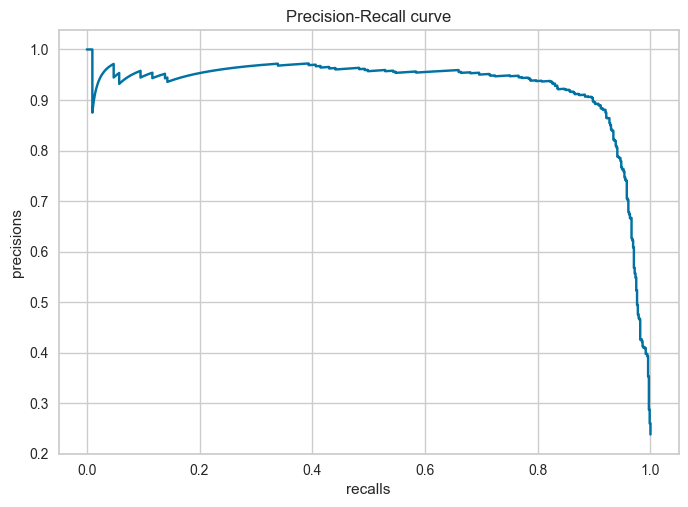

In [199]:
y_pred_proba = model_seq.predict(X_test)
precisions, recalls, thresholds = precision_recall_curve(y_test, y_pred_proba)
plt.plot(recalls, precisions, label='ANN')
plt.xlabel('recalls')
plt.ylabel('precisions')
plt.title('Precision-Recall curve')
plt.show()

In [200]:
DLModel_pre_score = average_precision_score(y_test, y_pred_proba)
DLModel_f1 = f1_score(y_test, y_pred)
DLModel_recall = recall_score(y_test, y_pred)

In [239]:
print(DLModel_pre_score, DLModel_f1, DLModel_recall)

0.9270889497280386 0.8828590337524819 0.9341736694677871


In [238]:
# DLModel_pre_score = 0.9270889497280386
# DLModel_f1 = 0.8828590337524819
# DLModel_recall = 0.9341736694677871

In [202]:
import pickle
pickle.dump(model_seq, open('Sequential_pre_score', 'wb'))

### optuna

In [206]:
#!pip install Optuna

In [207]:
import optuna
# optimizers for gradient descent to use in backpropagation
from tensorflow.keras.optimizers import Adam, Adadelta, RMSprop, Nadam

In [225]:
import optuna
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Activation
from keras.optimizers import Adam
from tensorflow.keras.layers import Dropout
from keras.callbacks import EarlyStopping
trial_metric = "accuracy"
batch_size = 64
def create_model(trial):
    # Some hyperparameters we want to optimize
    first_hidden_layer = trial.suggest_int("input_layer_units", 8, 420)
    first_hidden_layer_dropout = trial.suggest_float("input_layer_dropout", 0, 0.5)
    learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1.3e-1)
    optimizer = trial.suggest_categorical("optimizer", [Adam, Adadelta, RMSprop, Nadam])
    tf.random.set_seed(seed)
    model = Sequential()
    model.add(Dense(first_hidden_layer, input_dim=X_train_v.shape[1], activation="relu"))
    # you can add the hidden layers automatically, see the example below:
    hidden_layers = trial.suggest_int("hidden_layers", 2, 6, log=True)
    for i in range(hidden_layers):
      hidden_layer_units = "hidden_layer_units_" + str(i)
      hidden_layer_units = trial.suggest_int(hidden_layer_units, 4, 128, log=True)
      dropout= "dropout_" + str(i)
      dropout = trial.suggest_float(dropout, 0, 0.5)
      model.add(Dense(hidden_layer_units, activation="relu"))
      model.add(Dropout(dropout))
    # we decided to use one neuron with sigmoid func in the output layer
    model.add(Dense(1, activation="sigmoid"))
    model.compile(
      loss="binary_crossentropy",
      optimizer=optimizer(learning_rate=learning_rate),
      metrics=[trial_metric],
    )
    return model
def objective(trial):
    early_stop = EarlyStopping(
    monitor="val_loss", mode="min", verbose=1, patience=15, restore_best_weights=True)
    model = create_model(trial)
    w0 = trial.suggest_loguniform("w0", 0.00001, 100)
    w1 = trial.suggest_loguniform("w1", 0.001, 1000)
    model.fit(
        X_train_v,
        y_train_v,
        validation_split=0.1,
        batch_size=batch_size,
        epochs=1000,
        callbacks=[early_stop],
        class_weight={0: w0, 1: w1},
        verbose=0,
    )
    score = model.evaluate(X_test, y_test, verbose=0)[1]
    return score

In [226]:
study1 = optuna.create_study(direction="maximize")
study1.optimize(objective, n_trials=50)
study1.best_params

[I 2023-12-07 09:33:12,276] A new study created in memory with name: no-name-739f0e47-957d-4858-bc31-c3ce0a4f18b2


Restoring model weights from the end of the best epoch: 1.
Epoch 16: early stopping


[I 2023-12-07 09:33:26,491] Trial 0 finished with value: 0.7620000243186951 and parameters: {'input_layer_units': 255, 'input_layer_dropout': 0.19495316889805686, 'learning_rate': 0.00011045491788893474, 'optimizer': <class 'keras.src.optimizers.nadam.Nadam'>, 'hidden_layers': 6, 'hidden_layer_units_0': 24, 'dropout_0': 0.2812684086532131, 'hidden_layer_units_1': 59, 'dropout_1': 0.4201765766116685, 'hidden_layer_units_2': 23, 'dropout_2': 0.3980542795173122, 'hidden_layer_units_3': 10, 'dropout_3': 0.21692168805090078, 'hidden_layer_units_4': 19, 'dropout_4': 0.013273402967038994, 'hidden_layer_units_5': 97, 'dropout_5': 0.004389266540150094, 'w0': 67.30790607766833, 'w1': 0.0025663182909753334}. Best is trial 0 with value: 0.7620000243186951.


Restoring model weights from the end of the best epoch: 1.
Epoch 16: early stopping


[I 2023-12-07 09:33:35,709] Trial 1 finished with value: 0.4086666703224182 and parameters: {'input_layer_units': 402, 'input_layer_dropout': 0.4438771560247122, 'learning_rate': 2.9757536454848754e-05, 'optimizer': <class 'keras.src.optimizers.nadam.Nadam'>, 'hidden_layers': 2, 'hidden_layer_units_0': 17, 'dropout_0': 0.2573528065208521, 'hidden_layer_units_1': 13, 'dropout_1': 0.2234030889894959, 'w0': 0.0010971016503811112, 'w1': 10.250108512392195}. Best is trial 0 with value: 0.7620000243186951.


Restoring model weights from the end of the best epoch: 1.
Epoch 16: early stopping


[I 2023-12-07 09:33:46,353] Trial 2 finished with value: 0.476666659116745 and parameters: {'input_layer_units': 301, 'input_layer_dropout': 0.18667495785422855, 'learning_rate': 2.7721538413209613e-05, 'optimizer': <class 'keras.src.optimizers.adadelta.Adadelta'>, 'hidden_layers': 3, 'hidden_layer_units_0': 114, 'dropout_0': 0.029322448706151638, 'hidden_layer_units_1': 66, 'dropout_1': 0.05742572637890658, 'hidden_layer_units_2': 8, 'dropout_2': 0.39564650248498967, 'w0': 4.0835063722630435e-05, 'w1': 0.056720686122146695}. Best is trial 0 with value: 0.7620000243186951.


Restoring model weights from the end of the best epoch: 24.
Epoch 39: early stopping


[I 2023-12-07 09:34:01,449] Trial 3 finished with value: 0.23800000548362732 and parameters: {'input_layer_units': 415, 'input_layer_dropout': 0.39834328028977434, 'learning_rate': 0.005351296627414754, 'optimizer': <class 'keras.src.optimizers.adam.Adam'>, 'hidden_layers': 2, 'hidden_layer_units_0': 11, 'dropout_0': 0.37416993213558425, 'hidden_layer_units_1': 29, 'dropout_1': 0.17794713756477315, 'w0': 0.0028883667076024886, 'w1': 285.94440234647317}. Best is trial 0 with value: 0.7620000243186951.
[I 2023-12-07 09:40:22,301] Trial 4 finished with value: 0.7846666574478149 and parameters: {'input_layer_units': 386, 'input_layer_dropout': 0.085617588587656, 'learning_rate': 0.0005941158701760248, 'optimizer': <class 'keras.src.optimizers.adadelta.Adadelta'>, 'hidden_layers': 2, 'hidden_layer_units_0': 21, 'dropout_0': 0.35426381260557743, 'hidden_layer_units_1': 57, 'dropout_1': 0.445931436081222, 'w0': 0.6209082737301527, 'w1': 0.8779075036617094}. Best is trial 4 with value: 0.78466

Restoring model weights from the end of the best epoch: 32.
Epoch 47: early stopping


[I 2023-12-07 09:40:38,502] Trial 5 finished with value: 0.9660000205039978 and parameters: {'input_layer_units': 146, 'input_layer_dropout': 0.3032114910683789, 'learning_rate': 0.0005444402499482658, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 2, 'hidden_layer_units_0': 40, 'dropout_0': 0.1674301382799857, 'hidden_layer_units_1': 28, 'dropout_1': 0.08438773511547515, 'w0': 2.7662883088203327, 'w1': 0.3435524360400803}. Best is trial 5 with value: 0.9660000205039978.


Restoring model weights from the end of the best epoch: 1.
Epoch 16: early stopping


[I 2023-12-07 09:40:45,461] Trial 6 finished with value: 0.23800000548362732 and parameters: {'input_layer_units': 113, 'input_layer_dropout': 0.37072109991847924, 'learning_rate': 3.5471378048725496e-05, 'optimizer': <class 'keras.src.optimizers.adam.Adam'>, 'hidden_layers': 3, 'hidden_layer_units_0': 6, 'dropout_0': 0.19769114174336777, 'hidden_layer_units_1': 14, 'dropout_1': 0.07184475569490861, 'hidden_layer_units_2': 4, 'dropout_2': 0.41504783365976133, 'w0': 0.12002651929998417, 'w1': 20.796692563143683}. Best is trial 5 with value: 0.9660000205039978.


Restoring model weights from the end of the best epoch: 1.
Epoch 16: early stopping


[I 2023-12-07 09:40:54,193] Trial 7 finished with value: 0.3186666667461395 and parameters: {'input_layer_units': 262, 'input_layer_dropout': 0.29007265348672223, 'learning_rate': 0.0031125352992699357, 'optimizer': <class 'keras.src.optimizers.adadelta.Adadelta'>, 'hidden_layers': 2, 'hidden_layer_units_0': 50, 'dropout_0': 0.3530895925990848, 'hidden_layer_units_1': 33, 'dropout_1': 0.4135542116767998, 'w0': 0.002625101782124415, 'w1': 106.60582039253705}. Best is trial 5 with value: 0.9660000205039978.


Restoring model weights from the end of the best epoch: 1.
Epoch 16: early stopping


[I 2023-12-07 09:41:02,762] Trial 8 finished with value: 0.23800000548362732 and parameters: {'input_layer_units': 111, 'input_layer_dropout': 0.46224266243177414, 'learning_rate': 1.1998675478032282e-05, 'optimizer': <class 'keras.src.optimizers.adam.Adam'>, 'hidden_layers': 5, 'hidden_layer_units_0': 8, 'dropout_0': 0.0652277948937463, 'hidden_layer_units_1': 120, 'dropout_1': 0.06435551561158448, 'hidden_layer_units_2': 23, 'dropout_2': 0.08313196644954379, 'hidden_layer_units_3': 26, 'dropout_3': 0.25353860573919346, 'hidden_layer_units_4': 10, 'dropout_4': 0.20517994765297715, 'w0': 4.0580522003465546e-05, 'w1': 743.5836800372853}. Best is trial 5 with value: 0.9660000205039978.


Restoring model weights from the end of the best epoch: 1.
Epoch 16: early stopping


[I 2023-12-07 09:41:10,365] Trial 9 finished with value: 0.7713333368301392 and parameters: {'input_layer_units': 346, 'input_layer_dropout': 0.19179098120331395, 'learning_rate': 0.0001375396973971216, 'optimizer': <class 'keras.src.optimizers.adadelta.Adadelta'>, 'hidden_layers': 2, 'hidden_layer_units_0': 20, 'dropout_0': 0.06517656736090877, 'hidden_layer_units_1': 85, 'dropout_1': 0.4970403154248478, 'w0': 0.00028417614013273964, 'w1': 0.0071147616217212524}. Best is trial 5 with value: 0.9660000205039978.


Restoring model weights from the end of the best epoch: 4.
Epoch 19: early stopping


[I 2023-12-07 09:41:18,226] Trial 10 finished with value: 0.7620000243186951 and parameters: {'input_layer_units': 21, 'input_layer_dropout': 0.02520702658438634, 'learning_rate': 0.05894718411365836, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 4, 'hidden_layer_units_0': 4, 'dropout_0': 0.47350337534514236, 'hidden_layer_units_1': 5, 'dropout_1': 0.15909609388759097, 'hidden_layer_units_2': 102, 'dropout_2': 0.001723201491152182, 'hidden_layer_units_3': 83, 'dropout_3': 0.47638848312027804, 'w0': 5.1394552703034995, 'w1': 0.3375310080288492}. Best is trial 5 with value: 0.9660000205039978.


Restoring model weights from the end of the best epoch: 40.
Epoch 55: early stopping


[I 2023-12-07 09:41:36,713] Trial 11 finished with value: 0.9626666903495789 and parameters: {'input_layer_units': 167, 'input_layer_dropout': 0.016735279057276786, 'learning_rate': 0.0006212679229449839, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 3, 'hidden_layer_units_0': 40, 'dropout_0': 0.16336207729802116, 'hidden_layer_units_1': 42, 'dropout_1': 0.30220706385946366, 'hidden_layer_units_2': 87, 'dropout_2': 0.20892588878426888, 'w0': 0.44682522910978956, 'w1': 0.9245084803406103}. Best is trial 5 with value: 0.9660000205039978.


Restoring model weights from the end of the best epoch: 32.
Epoch 47: early stopping


[I 2023-12-07 09:41:53,346] Trial 12 finished with value: 0.9633333086967468 and parameters: {'input_layer_units': 163, 'input_layer_dropout': 0.301502988080359, 'learning_rate': 0.0006609643590327725, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 3, 'hidden_layer_units_0': 45, 'dropout_0': 0.1581553437795168, 'hidden_layer_units_1': 34, 'dropout_1': 0.31051181496153535, 'hidden_layer_units_2': 117, 'dropout_2': 0.2004681284560056, 'w0': 1.1592929998709653, 'w1': 0.1316243381963356}. Best is trial 5 with value: 0.9660000205039978.


Restoring model weights from the end of the best epoch: 32.
Epoch 47: early stopping


[I 2023-12-07 09:42:09,953] Trial 13 finished with value: 0.9390000104904175 and parameters: {'input_layer_units': 179, 'input_layer_dropout': 0.31036090726981125, 'learning_rate': 0.001633286273329222, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 4, 'hidden_layer_units_0': 53, 'dropout_0': 0.1510143088687117, 'hidden_layer_units_1': 21, 'dropout_1': 0.3159006975512677, 'hidden_layer_units_2': 60, 'dropout_2': 0.22495774772820848, 'hidden_layer_units_3': 6, 'dropout_3': 0.09826212889990421, 'w0': 4.822850790356866, 'w1': 0.05160617958151121}. Best is trial 5 with value: 0.9660000205039978.


Restoring model weights from the end of the best epoch: 57.
Epoch 72: early stopping


[I 2023-12-07 09:42:34,896] Trial 14 finished with value: 0.9539999961853027 and parameters: {'input_layer_units': 69, 'input_layer_dropout': 0.33802135819245915, 'learning_rate': 0.0002731277246876596, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 3, 'hidden_layer_units_0': 95, 'dropout_0': 0.1491405252542285, 'hidden_layer_units_1': 21, 'dropout_1': 0.02620651805837987, 'hidden_layer_units_2': 128, 'dropout_2': 0.2788177854131305, 'w0': 0.029957319523015946, 'w1': 0.08199742762462787}. Best is trial 5 with value: 0.9660000205039978.


Restoring model weights from the end of the best epoch: 32.
Epoch 47: early stopping


[I 2023-12-07 09:42:51,500] Trial 15 finished with value: 0.9616666436195374 and parameters: {'input_layer_units': 203, 'input_layer_dropout': 0.2627577569631371, 'learning_rate': 0.008305744879910298, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 4, 'hidden_layer_units_0': 34, 'dropout_0': 0.10880247115939871, 'hidden_layer_units_1': 42, 'dropout_1': 0.132772131775043, 'hidden_layer_units_2': 53, 'dropout_2': 0.1483959499033163, 'hidden_layer_units_3': 4, 'dropout_3': 0.00349802743664146, 'w0': 90.99367088577408, 'w1': 4.132974525454323}. Best is trial 5 with value: 0.9660000205039978.


Restoring model weights from the end of the best epoch: 32.
Epoch 47: early stopping


[I 2023-12-07 09:43:05,940] Trial 16 finished with value: 0.9629999995231628 and parameters: {'input_layer_units': 130, 'input_layer_dropout': 0.40050101442331326, 'learning_rate': 0.0007765876291321105, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 2, 'hidden_layer_units_0': 73, 'dropout_0': 0.20237132790360235, 'hidden_layer_units_1': 13, 'dropout_1': 0.002904337681166602, 'w0': 6.201605719392394, 'w1': 0.28427263349764875}. Best is trial 5 with value: 0.9660000205039978.


Restoring model weights from the end of the best epoch: 196.
Epoch 211: early stopping


[I 2023-12-07 09:44:08,937] Trial 17 finished with value: 0.9649999737739563 and parameters: {'input_layer_units': 48, 'input_layer_dropout': 0.24850545251635942, 'learning_rate': 0.00023714740302778012, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 3, 'hidden_layer_units_0': 72, 'dropout_0': 0.10669916302086889, 'hidden_layer_units_1': 30, 'dropout_1': 0.27418776706607617, 'hidden_layer_units_2': 42, 'dropout_2': 0.2960348556748791, 'w0': 0.040735999718463235, 'w1': 0.018138863821701184}. Best is trial 5 with value: 0.9660000205039978.


Restoring model weights from the end of the best epoch: 279.
Epoch 294: early stopping


[I 2023-12-07 09:45:43,481] Trial 18 finished with value: 0.9589999914169312 and parameters: {'input_layer_units': 11, 'input_layer_dropout': 0.24032990122919248, 'learning_rate': 0.00015354645846824512, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 4, 'hidden_layer_units_0': 68, 'dropout_0': 0.000834382182751725, 'hidden_layer_units_1': 8, 'dropout_1': 0.11240343474527417, 'hidden_layer_units_2': 30, 'dropout_2': 0.31525778760469714, 'hidden_layer_units_3': 109, 'dropout_3': 0.4994773920070418, 'w0': 0.022378837523988327, 'w1': 0.016833683775184217}. Best is trial 5 with value: 0.9660000205039978.


Restoring model weights from the end of the best epoch: 26.
Epoch 41: early stopping


[I 2023-12-07 09:46:05,517] Trial 19 finished with value: 0.7620000243186951 and parameters: {'input_layer_units': 68, 'input_layer_dropout': 0.4986307181063285, 'learning_rate': 0.00026286571225362363, 'optimizer': <class 'keras.src.optimizers.nadam.Nadam'>, 'hidden_layers': 6, 'hidden_layer_units_0': 128, 'dropout_0': 0.12028939198592978, 'hidden_layer_units_1': 24, 'dropout_1': 0.21604119149948475, 'hidden_layer_units_2': 11, 'dropout_2': 0.32363182333797325, 'hidden_layer_units_3': 24, 'dropout_3': 0.35008433765455194, 'hidden_layer_units_4': 101, 'dropout_4': 0.48834206456184154, 'hidden_layer_units_5': 6, 'dropout_5': 0.48158841798891106, 'w0': 0.07541929051699692, 'w1': 0.00301646010331037}. Best is trial 5 with value: 0.9660000205039978.


Restoring model weights from the end of the best epoch: 43.
Epoch 58: early stopping


[I 2023-12-07 09:46:26,531] Trial 20 finished with value: 0.9496666789054871 and parameters: {'input_layer_units': 58, 'input_layer_dropout': 0.34372567836810486, 'learning_rate': 0.001481786872586702, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 5, 'hidden_layer_units_0': 79, 'dropout_0': 0.08718997253943864, 'hidden_layer_units_1': 18, 'dropout_1': 0.2628191365818365, 'hidden_layer_units_2': 41, 'dropout_2': 0.4837453349099657, 'hidden_layer_units_3': 46, 'dropout_3': 0.0036606643766215474, 'hidden_layer_units_4': 4, 'dropout_4': 0.4539407418144699, 'w0': 0.013768488735124287, 'w1': 0.013216344558911597}. Best is trial 5 with value: 0.9660000205039978.


Restoring model weights from the end of the best epoch: 32.
Epoch 47: early stopping


[I 2023-12-07 09:46:42,254] Trial 21 finished with value: 0.9670000076293945 and parameters: {'input_layer_units': 153, 'input_layer_dropout': 0.29114920099300995, 'learning_rate': 0.0004910410212101262, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 3, 'hidden_layer_units_0': 33, 'dropout_0': 0.19753020523493647, 'hidden_layer_units_1': 35, 'dropout_1': 0.30090325472364, 'hidden_layer_units_2': 71, 'dropout_2': 0.18207151361795373, 'w0': 0.5485744805779548, 'w1': 0.1677556908680469}. Best is trial 21 with value: 0.9670000076293945.


Restoring model weights from the end of the best epoch: 94.
Epoch 109: early stopping


[I 2023-12-07 09:47:16,848] Trial 22 finished with value: 0.9673333168029785 and parameters: {'input_layer_units': 229, 'input_layer_dropout': 0.248911591056364, 'learning_rate': 0.0003310242528021489, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 3, 'hidden_layer_units_0': 32, 'dropout_0': 0.19565581970461723, 'hidden_layer_units_1': 43, 'dropout_1': 0.26024860340236505, 'hidden_layer_units_2': 62, 'dropout_2': 0.1278545042234576, 'w0': 0.16326774418381865, 'w1': 0.03086711269842739}. Best is trial 22 with value: 0.9673333168029785.


Restoring model weights from the end of the best epoch: 142.
Epoch 157: early stopping


[I 2023-12-07 09:48:06,280] Trial 23 finished with value: 0.9626666903495789 and parameters: {'input_layer_units': 236, 'input_layer_dropout': 0.3357908257607732, 'learning_rate': 7.947761672786624e-05, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 3, 'hidden_layer_units_0': 31, 'dropout_0': 0.2232478424925588, 'hidden_layer_units_1': 50, 'dropout_1': 0.35808442567658916, 'hidden_layer_units_2': 68, 'dropout_2': 0.13453600158156886, 'w0': 0.19983016704576148, 'w1': 0.2939422012233772}. Best is trial 22 with value: 0.9673333168029785.


Restoring model weights from the end of the best epoch: 24.
Epoch 39: early stopping


[I 2023-12-07 09:48:17,725] Trial 24 finished with value: 0.9646666646003723 and parameters: {'input_layer_units': 205, 'input_layer_dropout': 0.2220948682921973, 'learning_rate': 0.0018096994395319244, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 2, 'hidden_layer_units_0': 28, 'dropout_0': 0.2364666164506457, 'hidden_layer_units_1': 41, 'dropout_1': 0.19955248091205202, 'w0': 1.3654861635360152, 'w1': 1.9733028427049655}. Best is trial 22 with value: 0.9673333168029785.


Restoring model weights from the end of the best epoch: 100.
Epoch 115: early stopping


[I 2023-12-07 09:49:03,018] Trial 25 finished with value: 0.9649999737739563 and parameters: {'input_layer_units': 295, 'input_layer_dropout': 0.28497779913388255, 'learning_rate': 0.0003304060830259769, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 4, 'hidden_layer_units_0': 37, 'dropout_0': 0.18877143139140576, 'hidden_layer_units_1': 78, 'dropout_1': 0.24824973816701168, 'hidden_layer_units_2': 77, 'dropout_2': 0.09658640581552433, 'hidden_layer_units_3': 12, 'dropout_3': 0.38436886433822265, 'w0': 0.28652747357966946, 'w1': 0.04974441963634018}. Best is trial 22 with value: 0.9673333168029785.


Restoring model weights from the end of the best epoch: 3.
Epoch 18: early stopping


[I 2023-12-07 09:49:09,598] Trial 26 finished with value: 0.7620000243186951 and parameters: {'input_layer_units': 138, 'input_layer_dropout': 0.14486711501441918, 'learning_rate': 6.070746350100631e-05, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 3, 'hidden_layer_units_0': 16, 'dropout_0': 0.27859996682267846, 'hidden_layer_units_1': 25, 'dropout_1': 0.15116716672128633, 'hidden_layer_units_2': 46, 'dropout_2': 0.1680032111678413, 'w0': 0.15800025721294994, 'w1': 0.0015916545668959803}. Best is trial 22 with value: 0.9673333168029785.


Restoring model weights from the end of the best epoch: 71.
Epoch 86: early stopping


[I 2023-12-07 09:49:33,671] Trial 27 finished with value: 0.9153333306312561 and parameters: {'input_layer_units': 100, 'input_layer_dropout': 0.290510448573504, 'learning_rate': 0.00034120156742617805, 'optimizer': <class 'keras.src.optimizers.adam.Adam'>, 'hidden_layers': 2, 'hidden_layer_units_0': 28, 'dropout_0': 0.2270944350407382, 'hidden_layer_units_1': 46, 'dropout_1': 0.19185691118218484, 'w0': 16.34517483960952, 'w1': 0.16994484730012982}. Best is trial 22 with value: 0.9673333168029785.


Restoring model weights from the end of the best epoch: 37.
Epoch 52: early stopping


[I 2023-12-07 09:50:01,095] Trial 28 finished with value: 0.9646666646003723 and parameters: {'input_layer_units': 226, 'input_layer_dropout': 0.2715805000942298, 'learning_rate': 0.0011234816504201316, 'optimizer': <class 'keras.src.optimizers.nadam.Nadam'>, 'hidden_layers': 5, 'hidden_layer_units_0': 57, 'dropout_0': 0.18252111689383435, 'hidden_layer_units_1': 35, 'dropout_1': 0.23878386972095483, 'hidden_layer_units_2': 73, 'dropout_2': 0.24993332153099163, 'hidden_layer_units_3': 49, 'dropout_3': 0.15847133094858012, 'hidden_layer_units_4': 100, 'dropout_4': 0.010848931257776973, 'w0': 1.0539827870618725, 'w1': 0.5587164696729633}. Best is trial 22 with value: 0.9673333168029785.


Restoring model weights from the end of the best epoch: 111.
Epoch 126: early stopping


[I 2023-12-07 09:51:02,732] Trial 29 finished with value: 0.9603333473205566 and parameters: {'input_layer_units': 260, 'input_layer_dropout': 0.21311702785008665, 'learning_rate': 0.00010684271908911313, 'optimizer': <class 'keras.src.optimizers.nadam.Nadam'>, 'hidden_layers': 6, 'hidden_layer_units_0': 27, 'dropout_0': 0.2672565125961378, 'hidden_layer_units_1': 54, 'dropout_1': 0.12006964140570614, 'hidden_layer_units_2': 34, 'dropout_2': 0.0741158820167564, 'hidden_layer_units_3': 127, 'dropout_3': 0.3071583766973629, 'hidden_layer_units_4': 40, 'dropout_4': 0.31215751113897433, 'hidden_layer_units_5': 4, 'dropout_5': 0.2581246460619191, 'w0': 1.702029524704705, 'w1': 1.7604261789229552}. Best is trial 22 with value: 0.9673333168029785.


Restoring model weights from the end of the best epoch: 48.
Epoch 63: early stopping


[I 2023-12-07 09:51:23,971] Trial 30 finished with value: 0.7620000243186951 and parameters: {'input_layer_units': 193, 'input_layer_dropout': 0.16150622403866938, 'learning_rate': 0.00045133988930591795, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 3, 'hidden_layer_units_0': 38, 'dropout_0': 0.3097293477131833, 'hidden_layer_units_1': 27, 'dropout_1': 0.3477479311253626, 'hidden_layer_units_2': 93, 'dropout_2': 0.030822502972915777, 'w0': 18.594640299419808, 'w1': 0.13392377138717315}. Best is trial 22 with value: 0.9673333168029785.


Restoring model weights from the end of the best epoch: 91.
Epoch 106: early stopping


[I 2023-12-07 09:51:58,047] Trial 31 finished with value: 0.9636666774749756 and parameters: {'input_layer_units': 158, 'input_layer_dropout': 0.2457451301815184, 'learning_rate': 0.00019177805481294518, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 3, 'hidden_layer_units_0': 60, 'dropout_0': 0.1262010091509802, 'hidden_layer_units_1': 30, 'dropout_1': 0.2744834680289545, 'hidden_layer_units_2': 50, 'dropout_2': 0.1873294913408098, 'w0': 0.06358619347662868, 'w1': 0.020750174254657087}. Best is trial 22 with value: 0.9673333168029785.


Restoring model weights from the end of the best epoch: 1.
Epoch 16: early stopping


[I 2023-12-07 09:52:04,200] Trial 32 finished with value: 0.7620000243186951 and parameters: {'input_layer_units': 46, 'input_layer_dropout': 0.25067486737297207, 'learning_rate': 0.0002256009751873262, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 3, 'hidden_layer_units_0': 44, 'dropout_0': 0.12067763161928423, 'hidden_layer_units_1': 35, 'dropout_1': 0.2257031746603806, 'hidden_layer_units_2': 35, 'dropout_2': 0.12719607921852685, 'w0': 0.3593461325076196, 'w1': 0.005121872542864207}. Best is trial 22 with value: 0.9673333168029785.


Restoring model weights from the end of the best epoch: 107.
Epoch 122: early stopping


[I 2023-12-07 09:52:45,066] Trial 33 finished with value: 0.9639999866485596 and parameters: {'input_layer_units': 88, 'input_layer_dropout': 0.22349242177093942, 'learning_rate': 0.0004065141011688966, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 4, 'hidden_layer_units_0': 88, 'dropout_0': 0.2124954826758515, 'hidden_layer_units_1': 18, 'dropout_1': 0.2725317763698402, 'hidden_layer_units_2': 58, 'dropout_2': 0.2496276050291567, 'hidden_layer_units_3': 15, 'dropout_3': 0.4191149162186531, 'w0': 0.05188687417066584, 'w1': 0.034896128764301204}. Best is trial 22 with value: 0.9673333168029785.


Restoring model weights from the end of the best epoch: 131.
Epoch 146: early stopping


[I 2023-12-07 09:53:33,114] Trial 34 finished with value: 0.9629999995231628 and parameters: {'input_layer_units': 290, 'input_layer_dropout': 0.26353578985252446, 'learning_rate': 0.00015165072552644182, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 2, 'hidden_layer_units_0': 60, 'dropout_0': 0.24581595358855535, 'hidden_layer_units_1': 64, 'dropout_1': 0.2133286178593667, 'w0': 0.16149140886888014, 'w1': 0.028220148471741157}. Best is trial 22 with value: 0.9673333168029785.


Restoring model weights from the end of the best epoch: 1.
Epoch 16: early stopping


[I 2023-12-07 09:53:39,738] Trial 35 finished with value: 0.7613333463668823 and parameters: {'input_layer_units': 234, 'input_layer_dropout': 0.3184353604433177, 'learning_rate': 7.177238630138982e-05, 'optimizer': <class 'keras.src.optimizers.adadelta.Adadelta'>, 'hidden_layers': 3, 'hidden_layer_units_0': 23, 'dropout_0': 0.17869489299969607, 'hidden_layer_units_1': 29, 'dropout_1': 0.18091887448303892, 'hidden_layer_units_2': 72, 'dropout_2': 0.16850297381589138, 'w0': 0.015743850811187357, 'w1': 0.08531136101768953}. Best is trial 22 with value: 0.9673333168029785.


Restoring model weights from the end of the best epoch: 51.
Epoch 66: early stopping


[I 2023-12-07 09:54:00,444] Trial 36 finished with value: 0.9503333568572998 and parameters: {'input_layer_units': 144, 'input_layer_dropout': 0.3660644038229197, 'learning_rate': 0.000779686536076223, 'optimizer': <class 'keras.src.optimizers.nadam.Nadam'>, 'hidden_layers': 2, 'hidden_layer_units_0': 35, 'dropout_0': 0.09161644700943661, 'hidden_layer_units_1': 39, 'dropout_1': 0.25173778132487024, 'w0': 0.5734932136652653, 'w1': 0.009447409997010499}. Best is trial 22 with value: 0.9673333168029785.


Restoring model weights from the end of the best epoch: 38.
Epoch 53: early stopping


[I 2023-12-07 09:54:19,860] Trial 37 finished with value: 0.9576666951179504 and parameters: {'input_layer_units': 331, 'input_layer_dropout': 0.27734657070347507, 'learning_rate': 0.00048043889092511046, 'optimizer': <class 'keras.src.optimizers.adam.Adam'>, 'hidden_layers': 3, 'hidden_layer_units_0': 47, 'dropout_0': 0.14652665218567146, 'hidden_layer_units_1': 52, 'dropout_1': 0.22944577486860568, 'hidden_layer_units_2': 40, 'dropout_2': 0.12994690161932543, 'w0': 0.006924969331568338, 'w1': 0.026920638849988573}. Best is trial 22 with value: 0.9673333168029785.


Restoring model weights from the end of the best epoch: 8.
Epoch 23: early stopping


[I 2023-12-07 09:54:29,554] Trial 38 finished with value: 0.7620000243186951 and parameters: {'input_layer_units': 42, 'input_layer_dropout': 0.17480117117986388, 'learning_rate': 4.215014693803728e-05, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 5, 'hidden_layer_units_0': 98, 'dropout_0': 0.18575784420723382, 'hidden_layer_units_1': 27, 'dropout_1': 0.2854235290872996, 'hidden_layer_units_2': 94, 'dropout_2': 0.21965839204622611, 'hidden_layer_units_3': 4, 'dropout_3': 0.3177733201809242, 'hidden_layer_units_4': 4, 'dropout_4': 0.17883804659664648, 'w0': 0.05822181627040987, 'w1': 0.003915855626971145}. Best is trial 22 with value: 0.9673333168029785.


Restoring model weights from the end of the best epoch: 496.
Epoch 511: early stopping


[I 2023-12-07 09:56:47,236] Trial 39 finished with value: 0.7620000243186951 and parameters: {'input_layer_units': 84, 'input_layer_dropout': 0.20013246813945718, 'learning_rate': 0.00011782785028420944, 'optimizer': <class 'keras.src.optimizers.adadelta.Adadelta'>, 'hidden_layers': 2, 'hidden_layer_units_0': 50, 'dropout_0': 0.2143963218562659, 'hidden_layer_units_1': 61, 'dropout_1': 0.36385624789079485, 'w0': 0.13612105558168586, 'w1': 0.001033292454339235}. Best is trial 22 with value: 0.9673333168029785.


Restoring model weights from the end of the best epoch: 32.
Epoch 47: early stopping


[I 2023-12-07 09:57:03,446] Trial 40 finished with value: 0.9633333086967468 and parameters: {'input_layer_units': 187, 'input_layer_dropout': 0.235186149084864, 'learning_rate': 0.0008803701336602516, 'optimizer': <class 'keras.src.optimizers.adam.Adam'>, 'hidden_layers': 4, 'hidden_layer_units_0': 18, 'dropout_0': 0.05175251899353662, 'hidden_layer_units_1': 33, 'dropout_1': 0.2884902994962479, 'hidden_layer_units_2': 53, 'dropout_2': 0.2819152099085561, 'hidden_layer_units_3': 8, 'dropout_3': 0.42900562158274336, 'w0': 0.006062772341067319, 'w1': 0.008964757881433518}. Best is trial 22 with value: 0.9673333168029785.


Restoring model weights from the end of the best epoch: 32.
Epoch 47: early stopping


[I 2023-12-07 09:57:22,915] Trial 41 finished with value: 0.9633333086967468 and parameters: {'input_layer_units': 294, 'input_layer_dropout': 0.29013069651309986, 'learning_rate': 0.0002738394158431587, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 4, 'hidden_layer_units_0': 38, 'dropout_0': 0.1983372012519532, 'hidden_layer_units_1': 78, 'dropout_1': 0.2542061654741033, 'hidden_layer_units_2': 78, 'dropout_2': 0.08238178567697108, 'hidden_layer_units_3': 14, 'dropout_3': 0.3858275924147701, 'w0': 0.3189359787073409, 'w1': 0.043154026098715915}. Best is trial 22 with value: 0.9673333168029785.


Restoring model weights from the end of the best epoch: 32.
Epoch 47: early stopping


[I 2023-12-07 09:57:39,555] Trial 42 finished with value: 0.9610000252723694 and parameters: {'input_layer_units': 324, 'input_layer_dropout': 0.3125510379107144, 'learning_rate': 0.00038587724525522923, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 3, 'hidden_layer_units_0': 24, 'dropout_0': 0.17583713758512787, 'hidden_layer_units_1': 74, 'dropout_1': 0.328376923201934, 'hidden_layer_units_2': 68, 'dropout_2': 0.10284459216405994, 'w0': 0.3333439390125346, 'w1': 0.08847469338140881}. Best is trial 22 with value: 0.9673333168029785.


Restoring model weights from the end of the best epoch: 118.
Epoch 133: early stopping


[I 2023-12-07 09:58:30,261] Trial 43 finished with value: 0.9663333296775818 and parameters: {'input_layer_units': 268, 'input_layer_dropout': 0.2753590992654369, 'learning_rate': 0.00019945771209392647, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 4, 'hidden_layer_units_0': 32, 'dropout_0': 0.25314691516194837, 'hidden_layer_units_1': 89, 'dropout_1': 0.08077010152880573, 'hidden_layer_units_2': 107, 'dropout_2': 0.16815843088152538, 'hidden_layer_units_3': 15, 'dropout_3': 0.3504034034563114, 'w0': 0.08126145314455753, 'w1': 0.05518602139558902}. Best is trial 22 with value: 0.9673333168029785.


Restoring model weights from the end of the best epoch: 38.
Epoch 53: early stopping


[I 2023-12-07 09:58:50,587] Trial 44 finished with value: 0.9580000042915344 and parameters: {'input_layer_units': 251, 'input_layer_dropout': 0.26538984515018893, 'learning_rate': 0.00019810921412573125, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 3, 'hidden_layer_units_0': 31, 'dropout_0': 0.25459058715885485, 'hidden_layer_units_1': 95, 'dropout_1': 0.08780743783167527, 'hidden_layer_units_2': 124, 'dropout_2': 0.17745472117481972, 'w0': 0.08128669583950572, 'w1': 0.18259909465647287}. Best is trial 22 with value: 0.9673333168029785.


Restoring model weights from the end of the best epoch: 57.
Epoch 72: early stopping


[I 2023-12-07 09:59:21,289] Trial 45 finished with value: 0.918666660785675 and parameters: {'input_layer_units': 379, 'input_layer_dropout': 0.21190697165452552, 'learning_rate': 0.00011211677761135075, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 4, 'hidden_layer_units_0': 45, 'dropout_0': 0.2920022430118359, 'hidden_layer_units_1': 105, 'dropout_1': 0.05894284177749705, 'hidden_layer_units_2': 102, 'dropout_2': 0.15616569332304608, 'hidden_layer_units_3': 19, 'dropout_3': 0.2710529537910761, 'w0': 0.0322547553458945, 'w1': 0.5682374384460219}. Best is trial 22 with value: 0.9673333168029785.


Restoring model weights from the end of the best epoch: 152.
Epoch 167: early stopping


[I 2023-12-07 10:00:27,190] Trial 46 finished with value: 0.7620000243186951 and parameters: {'input_layer_units': 275, 'input_layer_dropout': 0.24964302869038205, 'learning_rate': 0.000534409527425241, 'optimizer': <class 'keras.src.optimizers.adadelta.Adadelta'>, 'hidden_layers': 5, 'hidden_layer_units_0': 21, 'dropout_0': 0.1405135106072249, 'hidden_layer_units_1': 116, 'dropout_1': 0.1584628622302825, 'hidden_layer_units_2': 62, 'dropout_2': 0.1937227074553866, 'hidden_layer_units_3': 7, 'dropout_3': 0.21853667866587154, 'hidden_layer_units_4': 33, 'dropout_4': 0.3268079839932642, 'w0': 0.764025972411849, 'w1': 0.015522811084251712}. Best is trial 22 with value: 0.9673333168029785.


Restoring model weights from the end of the best epoch: 90.
Epoch 105: early stopping


[I 2023-12-07 10:00:57,895] Trial 47 finished with value: 0.9449999928474426 and parameters: {'input_layer_units': 116, 'input_layer_dropout': 0.32214141397688817, 'learning_rate': 0.00019978296016379628, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 2, 'hidden_layer_units_0': 65, 'dropout_0': 0.16851749119014228, 'hidden_layer_units_1': 66, 'dropout_1': 0.08960918354748854, 'w0': 2.2863755684444285, 'w1': 0.07456845531256305}. Best is trial 22 with value: 0.9673333168029785.


Restoring model weights from the end of the best epoch: 32.
Epoch 47: early stopping


[I 2023-12-07 10:01:13,912] Trial 48 finished with value: 0.9679999947547913 and parameters: {'input_layer_units': 219, 'input_layer_dropout': 0.28760660883259775, 'learning_rate': 0.001083976011358437, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 3, 'hidden_layer_units_0': 54, 'dropout_0': 0.22936882990983493, 'hidden_layer_units_1': 49, 'dropout_1': 0.027684354286781593, 'hidden_layer_units_2': 29, 'dropout_2': 0.22749664392338664, 'w0': 0.5950914802853432, 'w1': 0.034146624600716276}. Best is trial 48 with value: 0.9679999947547913.


Restoring model weights from the end of the best epoch: 33.
Epoch 48: early stopping


[I 2023-12-07 10:01:29,168] Trial 49 finished with value: 0.9700000286102295 and parameters: {'input_layer_units': 223, 'input_layer_dropout': 0.2960433656276717, 'learning_rate': 0.0011046222777414698, 'optimizer': <class 'keras.src.optimizers.rmsprop.RMSprop'>, 'hidden_layers': 3, 'hidden_layer_units_0': 33, 'dropout_0': 0.24180045178389392, 'hidden_layer_units_1': 48, 'dropout_1': 0.02284419273779234, 'hidden_layer_units_2': 25, 'dropout_2': 0.22674530155263586, 'w0': 0.5679315916722124, 'w1': 0.19459301984529728}. Best is trial 49 with value: 0.9700000286102295.


{'input_layer_units': 223,
 'input_layer_dropout': 0.2960433656276717,
 'learning_rate': 0.0011046222777414698,
 'optimizer': keras.src.optimizers.rmsprop.RMSprop,
 'hidden_layers': 3,
 'hidden_layer_units_0': 33,
 'dropout_0': 0.24180045178389392,
 'hidden_layer_units_1': 48,
 'dropout_1': 0.02284419273779234,
 'hidden_layer_units_2': 25,
 'dropout_2': 0.22674530155263586,
 'w0': 0.5679315916722124,
 'w1': 0.19459301984529728}

In [232]:
# build model with optuna parameters
hidden_layers = study1.best_params["hidden_layers"]
input_layer_units = study1.best_params["input_layer_units"]
input_layer_dropout = study1.best_params["input_layer_dropout"]
optimizer = study.best_params["optimizer"]
hidden_layer_units_0 = study1.best_params["hidden_layer_units_0"]
hidden_layer_units_1 = study1.best_params["hidden_layer_units_1"]
hidden_layer_units_2 = study1.best_params["hidden_layer_units_2"]
# hidden_layer_units_3 = study.best_params["hidden_layer_units_3"]
# hidden_layer_units_4 = study.best_params["hidden_layer_units_4"]
# hidden_layer_units_5 = study.best_params["hidden_layer_units_5"]
dropout_0 = study1.best_params["dropout_0"]
dropout_1 = study1.best_params["dropout_1"]
dropout_2 = study1.best_params["dropout_2"]
# dropout_3 = study.best_params["dropout_3"]
# dropout_4 = study.best_params["dropout_4"]
# dropout_5 = study.best_params["dropout_5"]
learning_rate = study1.best_params["learning_rate"]
w0 = study1.best_params["w0"]
w1 = study1.best_params["w1"]


In [233]:
print("hidden_layers: ", hidden_layers )
print("input_layer_units ", input_layer_units )
print("input_layer_dropout", input_layer_dropout)
print("optimizer ", optimizer )
print("hidden_layer_units_0", hidden_layer_units_0 )
print("hidden_layer_units_1", hidden_layer_units_1 )
print("hidden_layer_units_2", hidden_layer_units_2 )
print("hidden_layer_units_3", hidden_layer_units_3 )
# print("hidden_layer_units_4", hidden_layer_units_4 )
# print("hidden_layer_units_5", hidden_layer_units_5 )
print("dropout_0", dropout_0 )
print("dropout_1", dropout_1 )
print("dropout_2", dropout_1 )
print("dropout_3", dropout_3 )
# print("dropout_4", dropout_4 )
# print("dropout_5", dropout_5 )
print("learning_rate", learning_rate )
print("w0", w0)
print("w1", w1 )

hidden_layers:  3
input_layer_units  223
input_layer_dropout 0.2960433656276717
optimizer  <class 'keras.src.optimizers.nadam.Nadam'>
hidden_layer_units_0 33
hidden_layer_units_1 48
hidden_layer_units_2 25
hidden_layer_units_3 81
dropout_0 0.24180045178389392
dropout_1 0.02284419273779234
dropout_2 0.02284419273779234
dropout_3 0.2432734184484926
learning_rate 0.0011046222777414698
w0 0.5679315916722124
w1 0.19459301984529728


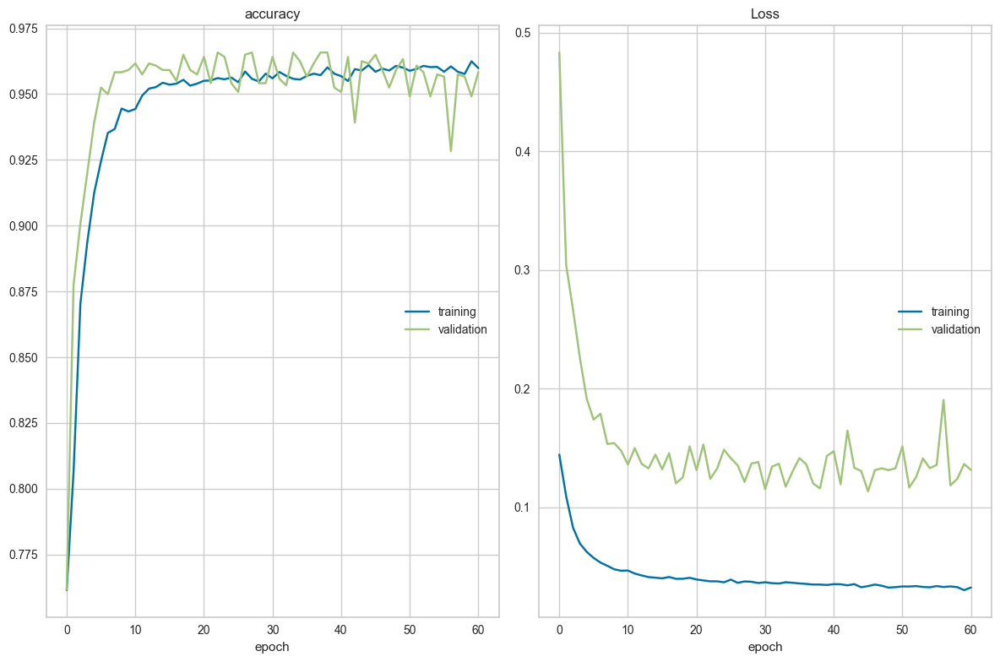

accuracy
	training         	 (min:    0.761, max:    0.962, cur:    0.960)
	validation       	 (min:    0.762, max:    0.966, cur:    0.958)
Loss
	training         	 (min:    0.030, max:    0.144, cur:    0.032)
	validation       	 (min:    0.113, max:    0.483, cur:    0.131)
Restoring model weights from the end of the best epoch: 46.
338/338 [==============================] - 1s 3ms/step - loss: 0.0322 - accuracy: 0.9599 - val_loss: 0.1314 - val_accuracy: 0.9583
Epoch 61: early stopping


In [234]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Activation
from keras.optimizers import Adam
from tensorflow.keras.layers import Dropout
from keras.callbacks import EarlyStopping
# In each minibatch during the training, 0.2 of the nuerons will set to be = 0, it helps to redcue the overfitting potential
tf.random.set_seed(seed)

Optuna_New2 = Sequential(
    [
        Input(shape= X_train_v.shape[1]),  # Number of inputs [feature]
        Dense(hidden_layer_units_0, activation="relu"),
        Dropout(dropout_0),
        Dense(hidden_layer_units_1, activation="relu"),
        Dropout(dropout_1),
        Dense(hidden_layer_units_2, activation="relu"),
        Dropout(dropout_2),
        Dense(hidden_layer_units_3, activation="relu"),
        Dropout(dropout_3),
        # Dense(hidden_layer_units_4, activation="relu"),
        # Dropout(dropout_4),
        # Dense(hidden_layer_units_5, activation="relu"),
        # Dropout(dropout_5),
        Dense(units=1, activation='sigmoid'),  #  1 neuron and Sigmoid because it is a bianry classification problem
    ]
)

# Complie
Optuna_New2.compile(optimizer=optimizer(learning_rate=learning_rate),
                     loss='binary_crossentropy',
                     metrics='accuracy')
#  live training loss plot
from livelossplot import PlotLossesKeras
# Stop training when a monitored metric has stopped improving.
early_stop = EarlyStopping(
    monitor="val_loss", mode="min", verbose=1, patience=15, restore_best_weights=True
)
# We are readt to fit the data
Optuna_New2.fit(
    x=X_train_v, y=y_train_v, validation_data=[X_val, y_val], batch_size=32, epochs=1000, verbose=1,  # 1000 epoch since there is early stopping
    class_weight={0: w0, 1: w1},
    callbacks=[PlotLossesKeras(), early_stop]  # We add the erarly stop
)


In [235]:
print('----------------------------')
print('Test')
print('----------------------------')
y_pred = (Optuna_New2.predict(X_test) > .5).astype("int32")
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

print('----------------------------')
print('Train')
print('----------------------------')
y_pred_train = (Optuna_New2.predict(X_train_v) > .5).astype("int32")
print(confusion_matrix(y_train_v, y_pred_train))
print(classification_report(y_train_v, y_pred_train))

----------------------------
Test
----------------------------
94/94 [==============================] - 0s 1ms/step
[[2263   23]
 [  73  641]]
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      2286
           1       0.97      0.90      0.93       714

    accuracy                           0.97      3000
   macro avg       0.97      0.94      0.95      3000
weighted avg       0.97      0.97      0.97      3000

----------------------------
Train
----------------------------
338/338 [==============================] - 0s 888us/step
[[8192   36]
 [ 298 2273]]
              precision    recall  f1-score   support

           0       0.96      1.00      0.98      8228
           1       0.98      0.88      0.93      2571

    accuracy                           0.97     10799
   macro avg       0.97      0.94      0.96     10799
weighted avg       0.97      0.97      0.97     10799



94/94 [==============================] - 0s 878us/step


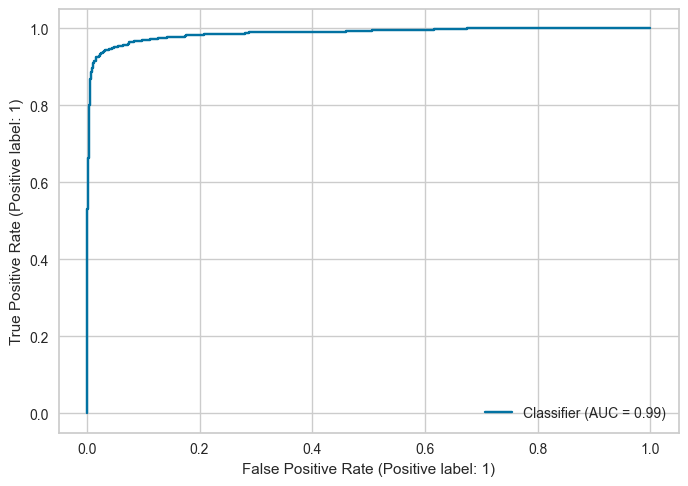

In [236]:
# Since this is without early stopping, we will just use 500 epoch

from sklearn.metrics import roc_curve, RocCurveDisplay
# eval_metric(model_Optuna_New2, X_train, y_train, X_test, y_test)

# ROC curve as the question satted, even though it is clearly imbalanced which means Precsion Vs Recall curve is better
y_pred_proba = Optuna_New2.predict(X_test)
RocCurveDisplay.from_predictions(y_test, y_pred_proba)

94/94 [==============================] - 0s 891us/step


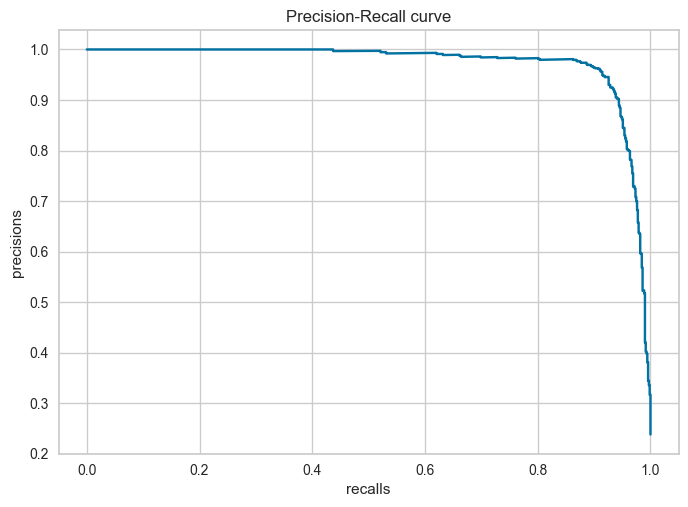

In [237]:
y_pred_proba = Optuna_New2.predict(X_test)
precisions, recalls, thresholds = precision_recall_curve(y_test, y_pred_proba)
plt.plot(recalls, precisions, label='ANN')
plt.xlabel('recalls')
plt.ylabel('precisions')
plt.title('Precision-Recall curve')
plt.show()

In [241]:
optuna_pre_score = average_precision_score(y_test, y_pred_proba)
optuna_f1 = f1_score(y_test, y_pred)
optuna_recall = recall_score(y_test, y_pred)

In [242]:
print(optuna_pre_score, optuna_f1, optuna_recall)

0.9732313329420273 0.9303338171262698 0.8977591036414566


In [243]:
import pickle
pickle.dump(Optuna_New2, open('Optuna', 'wb'))

### Comparing

In [127]:
rec_svm

array([0.93977591])

In [159]:
print(rec_svm, f1_svm, AP_svm)
print(rec_rf, f1_rf, AP_rf)
print(rec_rf_b, f1_rf_b, AP_rf_b)
print(rec_xg, f1_xg, AP_xg)
print(rec_xg_ba, f1_xg_ba, AP_xg_ba)
print(Sequential_pre_score, Sequential_f1, Sequential_recall)
print(optuna_recall, optuna_f1, optuna_pre_score)

[0.93977591] [0.8719948] 0.9071682357079847
[0.93697479] [0.96258993] 0.9811969866978556
[0.95798319] [0.87022901] 0.950139388893086
[0.96918768] [0.965806] 0.9798562085487477
[0.96498599] [0.96161898] 0.9832599089695152
0.9334473141936327 0.8987854251012145 0.9327731092436975
0.907563025210084 0.9330453563714903 0.9687354653314044


In [ ]:
#for our reference
# svm_r = [0.93977591] [0.8719948] 0.9071682357079847
# rf_r = [0.93697479] [0.96258993] 0.9811969866978556
# rfb_r =[0.95798319] [0.87022901] 0.950139388893086
# xg_r = [0.96918768] [0.965806] 0.9798562085487477
# xgb_r =[0.96498599] [0.96161898] 0.9832599089695152
# se_r =0.9334473141936327 0.8987854251012145 0.9327731092436975
# op_r = 0.907563025210084 0.9330453563714903 0.9687354653314044

In [246]:
compare = pd.DataFrame({
    "Model": ["SVM", "RF", 'RF_b', "XG", "XG_b", "DLModel", "DLOptuna"],
    "F1": [f1_svm[0], f1_rf[0], f1_rf_b[0], f1_xg[0], f1_xg_ba[0], DLModel_f1, optuna_f1],
    "Recall": [rec_svm[0], rec_rf[0], rec_rf_b[0], rec_xg[0], rec_xg_ba[0], DLModel_recall, optuna_recall],
    "AP": [AP_svm, AP_rf, AP_rf_b, AP_xg, AP_xg_ba, DLModel_pre_score, optuna_pre_score]
})

# rec_svm, f1_svm, AP_svm
# rec_rf, f1_rf, AP_rf
# rec_rf_b, f1_rf_b, AP_rf_b
# rec_xg, f1_xg, AP_xg
# rec_xg_ba, f1_xg_ba, AP_xg_ba
# Sequential_pre_score, Sequential_f1, Sequential_recall

In [247]:
compare

,Model,F1,Recall,AP
0,SVM,0.871995,0.939776,0.907168
1,RF,0.962590,0.936975,0.981197
2,RF_b,0.870229,0.957983,0.950139
3,XG,0.962448,0.969188,0.986566
4,XG_b,0.965566,0.962185,0.981373
5,DLModel,0.882859,0.934174,0.927089
6,DLOptuna,0.930334,0.897759,0.973231


In [248]:
print(compare["F1"])

0    0.871995
1    0.962590
2    0.870229
3    0.962448
4    0.965566
5    0.882859
6    0.930334
Name: F1, dtype: float64


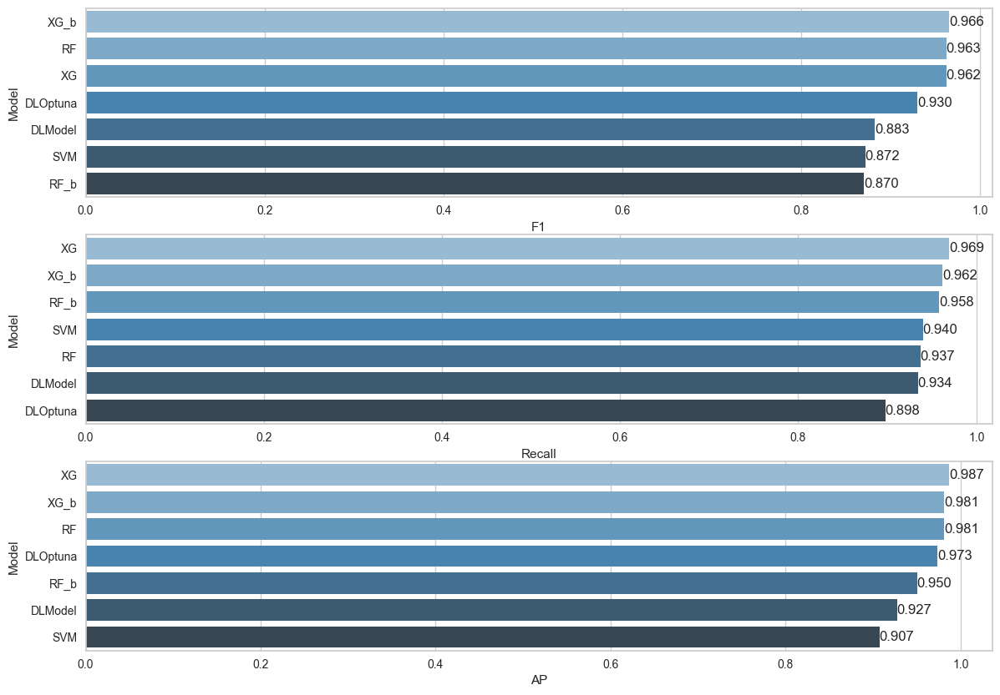

In [249]:
def labels(ax):
    for p in ax.patches:
        width = p.get_width()  # get bar length
        ax.text(
            width,  # set the text at 1 unit right of the bar
            p.get_y() +
            p.get_height() / 2,  # get Y coordinate + X coordinate / 2
            '{:1.3f}'.format(width),  # set variable to display, 2 decimals
            ha='left',  # horizontal alignment
            va='center')  # vertical alignment


plt.figure(figsize=(14, 10))
plt.subplot(311)
compare = compare.sort_values(by="F1", ascending=False)
ax = sns.barplot(x="F1", y="Model", data=compare, palette="Blues_d")
labels(ax)

plt.subplot(312)
compare = compare.sort_values(by="Recall", ascending=False)
ax = sns.barplot(x="Recall", y="Model", data=compare, palette="Blues_d")
labels(ax)

plt.subplot(313)
compare = compare.sort_values(by="AP", ascending=False)
ax = sns.barplot(x="AP", y="Model", data=compare, palette="Blues_d")
labels(ax)
plt.show()


### Preprocessing for Best Model

In [316]:
X = df.drop("left", axis=1)
display(X)
y = df.left
print(y)

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,Departments,salary
0,0.38,0.53,2,157,3,0,0,sales,low
1,0.80,0.86,5,262,6,0,0,sales,medium
2,0.11,0.88,7,272,4,0,0,sales,medium
3,0.72,0.87,5,223,5,0,0,sales,low
4,0.37,0.52,2,159,3,0,0,sales,low
...,...,...,...,...,...,...,...,...,...
14994,0.40,0.57,2,151,3,0,0,support,low
14995,0.37,0.48,2,160,3,0,0,support,low
14996,0.37,0.53,2,143,3,0,0,support,low
14997,0.11,0.96,6,280,4,0,0,support,low


0        1
1        1
2        1
3        1
4        1
        ..
14994    1
14995    1
14996    1
14997    1
14998    1
Name: left, Length: 14999, dtype: int64


In [317]:
# define seed fro models & split for a fair comparison

seed = 101

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=seed)
# stratify since it is imbalance


In [318]:
#Seeing the shape of X_train and X_test
print('X_train, shape is:', X_train.shape)
print('X_test shape is:', X_test.shape)


#Seeing the shape of y_train and y_test
print('y_train, shape is:', y_train.shape)
print('y_test shape is:', y_test.shape)

X_train, shape is: (11999, 9)
X_test shape is: (3000, 9)
y_train, shape is: (11999,)
y_test shape is: (3000,)


### Best model RF

In [319]:
#Creating the model with the values of best params we got it from the grid search, and then creat the graph to see the result
operations = [('Ordinal', trans_ord), ('rf', RandomForestClassifier(random_state=seed, max_depth=8, max_features=4,  min_samples_leaf=2, min_samples_split=2, n_estimators=100))]


pipe_rf = Pipeline(steps=operations).set_output(transform="pandas")

pipe_rf.fit(X_train, y_train)

# Get the predicted probabilities for the test data
# y_proba = pipe_rf.predict_proba(X_test)
# plot_precision_recall(y_test, y_proba)
# plt.show();

Pipeline(steps=[('Ordinal',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ordinalencoder',
                                                  OrdinalEncoder(),
                                                  Index(['Departments', 'salary'], dtype='object'))],
                                   verbose_feature_names_out=False)),
                ('rf',
                 RandomForestClassifier(max_depth=8, max_features=4,
                                        min_samples_leaf=2,
                                        random_state=101))])

In [320]:
#Creating the features to use them in the visualizing
features = pipe_rf["Ordinal"].get_feature_names_out()
features

array(['Departments', 'salary', 'satisfaction_level', 'last_evaluation',
       'number_project', 'average_montly_hours', 'time_spend_company',
       'Work_accident', 'promotion_last_5years'], dtype=object)

In [321]:
#Creating a dataframe of the features
rf_feature_imp = pd.DataFrame(data=pipe_rf["rf"].feature_importances_,
                              index = features,
                              columns=["Feature Importance"])

rf_feature_imp = rf_feature_imp.sort_values("Feature Importance", ascending=False)
rf_feature_imp

,Feature Importance
satisfaction_level,0.391479
time_spend_company,0.182578
number_project,0.181585
average_montly_hours,0.118634
last_evaluation,0.117768
Departments,0.003257
salary,0.002406
Work_accident,0.001882
promotion_last_5years,0.000410


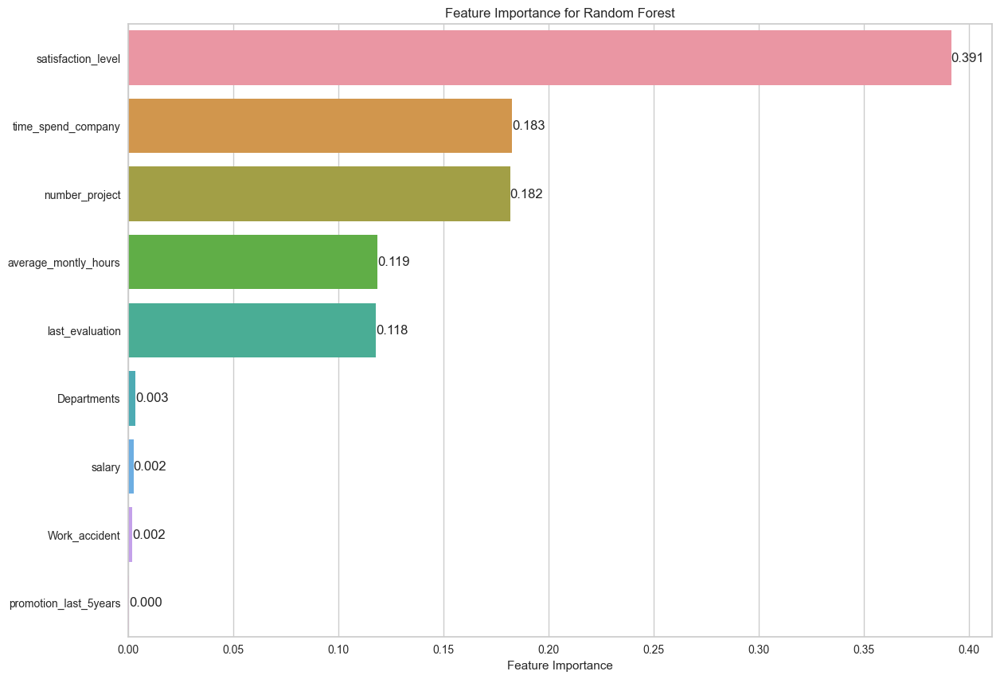

In [322]:
#Plotting the feature importance 
plt.figure(figsize=(14, 10), dpi=100)
ax = sns.barplot(x=rf_feature_imp["Feature Importance"],
                 y=rf_feature_imp.index)

ax.bar_label(ax.containers[0],fmt="%.3f")
plt.title("Feature Importance for Random Forest")
plt.show()


In [323]:
## Using the features from feature importance only

In [324]:
#Creating a new dataframe from the first dataframe
df_copy = df.copy()
df_copy.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,Departments,salary
0,0.38,0.53,2,157,3,0,1,0,sales,low
1,0.80,0.86,5,262,6,0,1,0,sales,medium
2,0.11,0.88,7,272,4,0,1,0,sales,medium
3,0.72,0.87,5,223,5,0,1,0,sales,low
4,0.37,0.52,2,159,3,0,1,0,sales,low


In [325]:
#Seeing the columns of df_co
df_copy.columns

Index(['satisfaction_level', 'last_evaluation', 'number_project',
       'average_montly_hours', 'time_spend_company', 'Work_accident', 'left',
       'promotion_last_5years', 'Departments', 'salary'],
      dtype='object')

In [326]:
#Dropping the unnecessary columns
df_copy = df_copy.drop(['promotion_last_5years', 'Departments', 'salary', 'Work_accident' ], axis=1)
#Seeing the head
df_copy.head()
#As we can see, we do not have all of the columns now

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,left
0,0.38,0.53,2,157,3,1
1,0.80,0.86,5,262,6,1
2,0.11,0.88,7,272,4,1
3,0.72,0.87,5,223,5,1
4,0.37,0.52,2,159,3,1


In [327]:
#Splitting the data to X and y
X= df_copy.drop(columns="left")
y= df_copy.left

In [328]:
#Seeing the head of X
X.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company
0,0.38,0.53,2,157,3
1,0.80,0.86,5,262,6
2,0.11,0.88,7,272,4
3,0.72,0.87,5,223,5
4,0.37,0.52,2,159,3


In [329]:
#Seeing the shape of X and y
print('X shape is:', X.shape)
print('y shape is:', y.shape)

X shape is: (14999, 5)
y shape is: (14999,)


In [330]:
#Seeing the object classes in the data set
df_copy.select_dtypes(include="object").head(1)
#There is no object in the new dataset

""
0


In [331]:
#Splitting the data to train and test
X_train_n, X_test_n, y_train_n, y_test_n = train_test_split(X, y, test_size=0.2, random_state=seed)

In [332]:
#Seeing the shape of X_train and X_test
print('X_train, shape is:', X_train_n.shape)
print('X_test shape is:', X_test_n.shape)


#Seeing the shape of y_train and y_test
print('y_train, shape is:', y_train_n.shape)
print('y_test shape is:', y_test_n.shape)

X_train, shape is: (11999, 5)
X_test shape is: (3000, 5)
y_train, shape is: (11999,)
y_test shape is: (3000,)


In [333]:
#Creating the model with the values of best params we got it from the grid search
rf_new = RandomForestClassifier(random_state=seed, max_depth=8, max_features=4,  min_samples_leaf=2, min_samples_split=2, n_estimators=100)


rf_new.fit(X_train_n, y_train_n)

RandomForestClassifier(max_depth=8, max_features=4, min_samples_leaf=2,
                       random_state=101)

In [334]:
eval_metric(rf_new, X_train_n, y_train_n, X_test_n, y_test_n)

Test_Set
[[2258    4]
 [  41  697]]
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      2262
           1       0.99      0.94      0.97       738

    accuracy                           0.98      3000
   macro avg       0.99      0.97      0.98      3000
weighted avg       0.99      0.98      0.98      3000


Train_Set
[[9143   23]
 [ 193 2640]]
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      9166
           1       0.99      0.93      0.96      2833

    accuracy                           0.98     11999
   macro avg       0.99      0.96      0.97     11999
weighted avg       0.98      0.98      0.98     11999



## Final Model RF

In [335]:
rf_final = RandomForestClassifier(random_state=seed, max_depth=8, max_features=4,  min_samples_leaf=2, min_samples_split=2, n_estimators=100)


rf_final.fit(X, y)

RandomForestClassifier(max_depth=8, max_features=4, min_samples_leaf=2,
                       random_state=101)

In [336]:
df_copy.columns

Index(['satisfaction_level', 'last_evaluation', 'number_project',
       'average_montly_hours', 'time_spend_company', 'left'],
      dtype='object')

In [338]:
my_dict = {
    'satisfaction_level': 0.40,
    'last_evaluation': 0.86,
    'number_project': 7, 
    'average_montly_hours': 262, 
    'time_spend_company': 2
}

In [339]:
data = pd.DataFrame.from_dict([my_dict])
data

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company
0,0.4,0.86,7,262,2


In [340]:
prediction = rf_final.predict(data)
print(prediction)

[1]


In [341]:
print("The employee {}. ".format(int(prediction[0])))

The employee 1. 


In [342]:
df2 = df_copy.copy()
df2.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,left
0,0.38,0.53,2,157,3,1
1,0.80,0.86,5,262,6,1
2,0.11,0.88,7,272,4,1
3,0.72,0.87,5,223,5,1
4,0.37,0.52,2,159,3,1


In [343]:
df2.to_csv('df2.csv')

In [344]:
pickle.dump(rf_final, open('final_rf', 'wb'))

In [345]:
new_model = pickle.load(open('final_rf', 'rb'))

### Best model XG

In [293]:
#Seeing the shape of X_train and X_test
print('X_train, shape is:', X_train.shape)
print('X_test shape is:', X_test.shape)


#Seeing the shape of y_train and y_test
print('y_train, shape is:', y_train.shape)
print('y_test shape is:', y_test.shape)

X_train, shape is: (11999, 9)
X_test shape is: (3000, 9)
y_train, shape is: (11999,)
y_test shape is: (3000,)


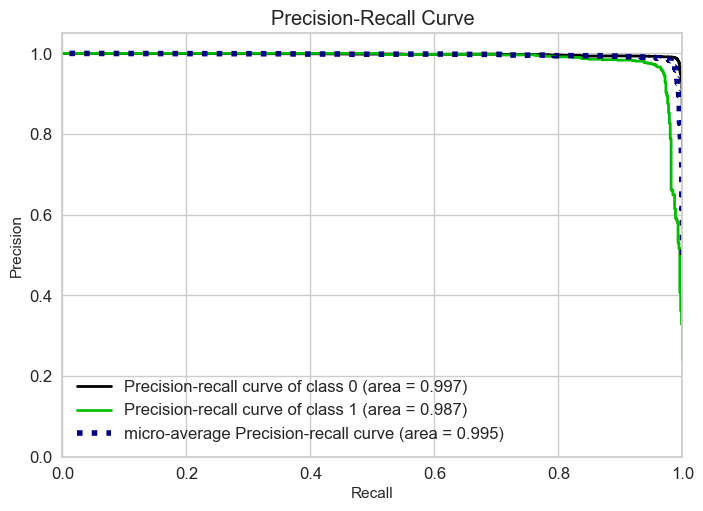

In [294]:
#Now, let's see the graph of it

#We will create the model of xg with the best params and graph the result
operations = [('Ordinal', trans_ord), ('xgb', XGBClassifier(random_state=seed, subsample= 0.7, reg_alpha=0.1, n_estimators=102, max_depth=8, learning_rate=1.701, gamma=0.0, colsample_bytree=0.49999999999999994))]


xg_model = Pipeline(steps=operations).set_output(transform="pandas")

xg_model.fit(X_train, y_train)

# Get the predicted probabilities for the test data
y_proba = xg_model.predict_proba(X_test)
plot_precision_recall(y_test, y_proba)
plt.show();

In [301]:
#Creating the features to use them in the visualizing
features = xg_model["Ordinal"].get_feature_names_out()
features

array(['Departments', 'salary', 'satisfaction_level', 'last_evaluation',
       'number_project', 'average_montly_hours', 'time_spend_company',
       'Work_accident', 'promotion_last_5years'], dtype=object)

In [302]:
#Creating a dataframe of the features
xg_feature_imp = pd.DataFrame(data=xg_model["xgb"].feature_importances_,
                              index = features,
                              columns=["Feature Importance"])

xg_feature_imp = xg_feature_imp.sort_values("Feature Importance", ascending=False)
xg_feature_imp

,Feature Importance
time_spend_company,0.308163
number_project,0.272692
last_evaluation,0.151927
Work_accident,0.073948
satisfaction_level,0.067515
average_montly_hours,0.050492
salary,0.039899
Departments,0.035363
promotion_last_5years,0.000000


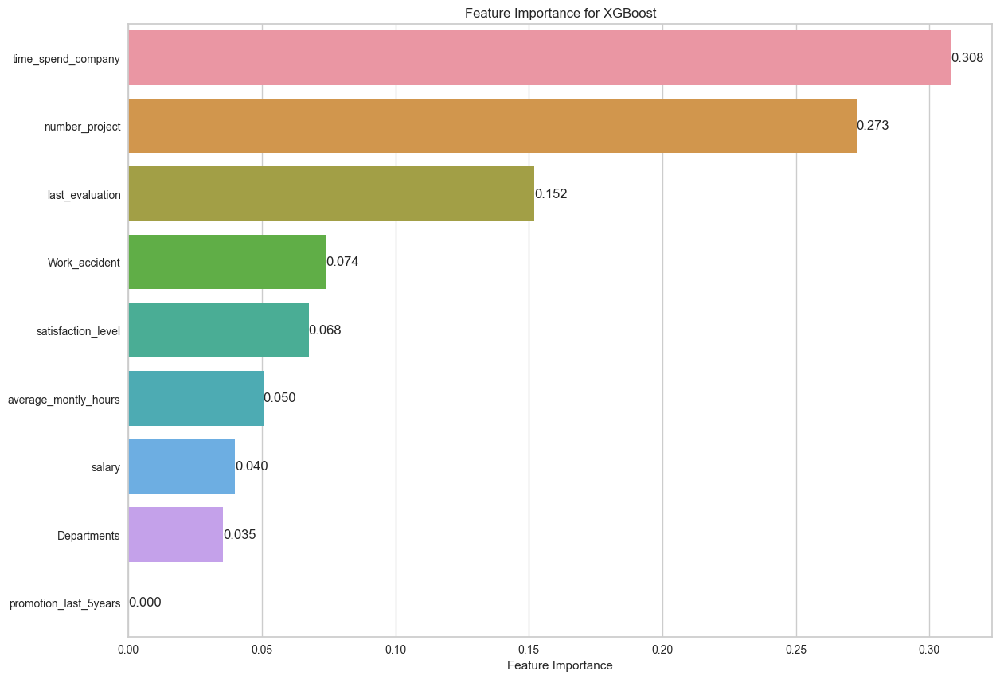

In [303]:
#Plotting the feature importance 
plt.figure(figsize=(14, 10), dpi=100)
ax = sns.barplot(x=xg_feature_imp["Feature Importance"],
                 y=xg_feature_imp.index)

ax.bar_label(ax.containers[0],fmt="%.3f")
plt.title("Feature Importance for XGBoost")
plt.show()


In [298]:
## Using the features from feature importance only

In [304]:
#Creating a new dataframe from the first dataframe
df_copy2 = df.copy()
df_copy2.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,Departments,salary
0,0.38,0.53,2,157,3,0,1,0,sales,low
1,0.80,0.86,5,262,6,0,1,0,sales,medium
2,0.11,0.88,7,272,4,0,1,0,sales,medium
3,0.72,0.87,5,223,5,0,1,0,sales,low
4,0.37,0.52,2,159,3,0,1,0,sales,low


In [305]:
#Seeing the columns of df_co
df_copy2.columns

Index(['satisfaction_level', 'last_evaluation', 'number_project',
       'average_montly_hours', 'time_spend_company', 'Work_accident', 'left',
       'promotion_last_5years', 'Departments', 'salary'],
      dtype='object')

In [306]:
#Dropping the unnecessary columns
df_copy2 = df_copy2.drop(['promotion_last_5years'], axis=1)
#Seeing the head
df_copy2.head()
#As we can see, we do not have all of the columns now

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,Departments,salary
0,0.38,0.53,2,157,3,0,1,sales,low
1,0.80,0.86,5,262,6,0,1,sales,medium
2,0.11,0.88,7,272,4,0,1,sales,medium
3,0.72,0.87,5,223,5,0,1,sales,low
4,0.37,0.52,2,159,3,0,1,sales,low


In [307]:
#Splitting the data to X and y
X2= df_copy2.drop(columns="left")
y2= df_copy2.left

In [308]:
#Seeing the head of X
X2.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,Departments,salary
0,0.38,0.53,2,157,3,0,sales,low
1,0.80,0.86,5,262,6,0,sales,medium
2,0.11,0.88,7,272,4,0,sales,medium
3,0.72,0.87,5,223,5,0,sales,low
4,0.37,0.52,2,159,3,0,sales,low


In [309]:
#Seeing the shape of X and y
print('X shape is:', X2.shape)
print('y shape is:', y2.shape)

X shape is: (14999, 8)
y shape is: (14999,)


In [310]:
#Seeing the object classes in the data set
df_copy2.select_dtypes(include="object").head(1)
#There is no object in the new dataset

,Departments,salary
0,sales,low


In [311]:
#Splitting the data to train and test
X_train_n2, X_test_n2, y_train_n2, y_test_n2 = train_test_split(X2, y2, test_size=0.2, random_state=seed)

In [312]:
#Seeing the shape of X_train and X_test
print('X_train, shape is:', X_train_n2.shape)
print('X_test shape is:', X_test_n2.shape)


#Seeing the shape of y_train and y_test
print('y_train, shape is:', y_train_n2.shape)
print('y_test shape is:', y_test_n2.shape)

X_train, shape is: (11999, 8)
X_test shape is: (3000, 8)
y_train, shape is: (11999,)
y_test shape is: (3000,)


In [313]:
cat_features2 = X_train_n2.select_dtypes("object").columns
cat_features2

ord_enc2 = OrdinalEncoder()
trans_ord2 = make_column_transformer((ord_enc2, cat_features2), remainder='passthrough', verbose_feature_names_out=False).set_output(transform="pandas")

In [314]:
#Now, let's see the graph of it

#We will create the model of xg with the best params and graph the result
operations = [('Ordinal', trans_ord2), ('xgb', XGBClassifier(random_state=seed, subsample= 0.7, reg_alpha=0.1, n_estimators=102, max_depth=8, learning_rate=1.701, gamma=0.0, colsample_bytree=0.49999999999999994))]


xg_model2 = Pipeline(steps=operations).set_output(transform="pandas")

xg_model2.fit(X_train_n2, y_train_n2)



Pipeline(steps=[('Ordinal',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ordinalencoder',
                                                  OrdinalEncoder(),
                                                  Index(['Departments', 'salary'], dtype='object'))],
                                   verbose_feature_names_out=False)),
                ('xgb',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=0.49999999999999994,
                               ea...
                               feature_types=None, gamma=0.0, gpu_id=None,
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None,
                               learning_rate=1.701, max_bin=None,
                               max_cat_threshold=None, max_cat_to_onehot=None,
                               max_delta_step=None, max_depth=8,
                               max_leaves=None, min_child_weight=None,
                               missing=nan, monotone_constraints=None,
                               n_estimators=102, n_jobs=None,
                               num_parallel_tree=None, predictor=None,
                               random_state=101, ...))])

In [315]:
eval_metric(xg_model2, X_train_n2, y_train_n2, X_test_n2, y_test_n2)

Test_Set
[[2240   22]
 [  21  717]]
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2262
           1       0.97      0.97      0.97       738

    accuracy                           0.99      3000
   macro avg       0.98      0.98      0.98      3000
weighted avg       0.99      0.99      0.99      3000


Train_Set
[[9166    0]
 [   0 2833]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      9166
           1       1.00      1.00      1.00      2833

    accuracy                           1.00     11999
   macro avg       1.00      1.00      1.00     11999
weighted avg       1.00      1.00      1.00     11999



## Final Model

In [180]:
rf_final = RandomForestClassifier(random_state=seed, max_depth=8, max_features=4,  min_samples_leaf=2, min_samples_split=2, n_estimators=100)


rf_final.fit(X, y)

RandomForestClassifier(max_depth=8, max_features=4, min_samples_leaf=2,
                       random_state=101)

In [181]:
df_copy.columns

Index(['satisfaction_level', 'last_evaluation', 'number_project',
       'average_montly_hours', 'time_spend_company', 'left'],
      dtype='object')

In [187]:
df_copy.time_spend_company

0        3
1        6
2        4
3        5
4        3
        ..
14994    3
14995    3
14996    3
14997    4
14998    3
Name: time_spend_company, Length: 14999, dtype: int64

In [188]:
my_dict = {
    'satisfaction_level': 0.40,
    'last_evaluation': 0.86,
    'number_project': 7, 
    'average_montly_hours': 262, 
    'time_spend_company': 2
}

In [189]:
data = pd.DataFrame.from_dict([my_dict])
data

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company
0,0.4,0.86,7,262,2


In [190]:
prediction = rf_final.predict(data)
print(prediction)

[1]


In [191]:
print("The employee {}. ".format(int(prediction[0])))

The employee 1. 


In [192]:
df2 = df_copy.copy()
df2.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,left
0,0.38,0.53,2,157,3,1
1,0.80,0.86,5,262,6,1
2,0.11,0.88,7,272,4,1
3,0.72,0.87,5,223,5,1
4,0.37,0.52,2,159,3,1


In [193]:
df2.to_csv('df2.csv')

In [194]:
pickle.dump(rf_final, open('final_rf', 'wb'))

In [195]:
new_model = pickle.load(open('final_rf', 'rb'))

## 6. Model Deployement

You cooked the food in the kitchen and moved on to the serving stage. The question is how do you showcase your work to others? Model Deployement helps you showcase your work to the world and make better decisions with it. But, deploying a model can get a little tricky at times. Before deploying the model, many things such as data storage, preprocessing, model building and monitoring need to be studied. Streamlit is a popular open source framework used by data scientists for model distribution.

Deployment of machine learning models, means making your models available to your other business systems. By deploying models, other systems can send data to them and get their predictions, which are in turn populated back into the company systems. Through machine learning model deployment, can begin to take full advantage of the model you built.

Data science is concerned with how to build machine learning models, which algorithm is more predictive, how to design features, and what variables to use to make the models more accurate. However, how these models are actually used is often neglected. And yet this is the most important step in the machine learning pipline. Only when a model is fully integrated with the business systems, real values ​​can be extract from its predictions.

After doing the following operations in this notebook, jump to new .py file and create your web app with Streamlit.

### Save and Export the Best Model

___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___